In [ ]:
import tensorflow as tf
print("TF version:", tf.__version__)
print("GPU Available:", tf.config.list_physical_devices('GPU'))

!pip install -q kaggle opencv-python-headless scikit-learn matplotlib

TF version: 2.20.0
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"kamalkarimi","key":"b04867fb01c8247b3acadaeaa991c016"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d paultimothymooney/chest-xray-pneumonia
!unzip -q chest-xray-pneumonia.zip -d /content/data

Dataset URL: https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia
License(s): other
100% 2.29G/2.29G [01:52<00:00, 21.9MB/s]



In [ ]:
import os

base_dir = "/content/data/chest_xray"
for split in ["train", "test", "val"]:
    for cls in ["NORMAL", "PNEUMONIA"]:
        path = os.path.join(base_dir, split, cls)
        count = len(os.listdir(path)) if os.path.exists(path) else 0
        print(f"{split}/{cls}: {count} images")

train/NORMAL: 1341 images
train/PNEUMONIA: 3875 images
test/NORMAL: 234 images
test/PNEUMONIA: 390 images
val/NORMAL: 8 images
val/PNEUMONIA: 8 images


In [ ]:
import cv2
import numpy as np

def letterbox_resize(image, target_size=224, pad_color=0):
    """
    Resize image to target_size x target_size while preserving aspect ratio.
    Pads with black (or given color) to fill remaining space.
    """
    h, w = image.shape[:2]
    scale = target_size / max(h, w)
    new_w, new_h = int(w * scale), int(h * scale)

    resized = cv2.resize(image, (new_w, new_h), interpolation=cv2.INTER_AREA)

    # Create square canvas
    if len(image.shape) == 3:
        canvas = np.full((target_size, target_size, image.shape[2]), pad_color, dtype=np.uint8)
    else:
        canvas = np.full((target_size, target_size), pad_color, dtype=np.uint8)

    # Center the resized image on canvas
    top = (target_size - new_h) // 2
    left = (target_size - new_w) // 2
    canvas[top:top+new_h, left:left+new_w] = resized

    return canvas

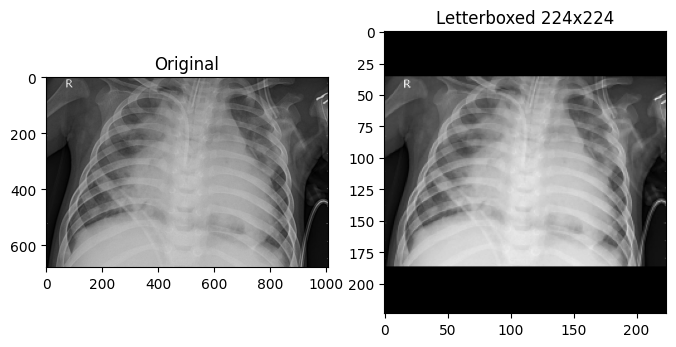

In [ ]:
import matplotlib.pyplot as plt

sample_path = "/content/data/chest_xray/train/PNEUMONIA/" + os.listdir("/content/data/chest_xray/train/PNEUMONIA")[0]
img = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)

padded = letterbox_resize(img, 224)

fig, ax = plt.subplots(1, 2, figsize=(8,4))
ax[0].imshow(img, cmap='gray'); ax[0].set_title("Original")
ax[1].imshow(padded, cmap='gray'); ax[1].set_title("Letterboxed 224x224")
plt.show()

In [ ]:
def apply_clahe(image, clip_limit=2.0, tile_grid_size=(8,8)):
    """
    Apply CLAHE for local contrast enhancement.
    Input: grayscale image
    """
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    return clahe.apply(image)

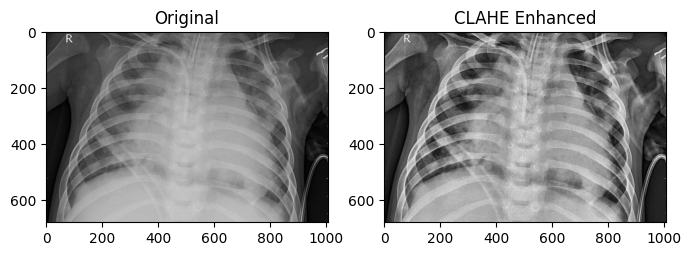

In [ ]:
clahe_img = apply_clahe(img)

fig, ax = plt.subplots(1, 2, figsize=(8,4))
ax[0].imshow(img, cmap='gray'); ax[0].set_title("Original")
ax[1].imshow(clahe_img, cmap='gray'); ax[1].set_title("CLAHE Enhanced")
plt.show()

In [ ]:
def strip_artifacts(image, border_crop_percent=0.03):
    """
    Removes thin border artifacts (labels, lines) by cropping a small
    percentage from each edge, then detects and removes text-like blobs
    near borders using contour analysis.
    """
    h, w = image.shape[:2]

    # Step A: Uniform border crop (removes scanner lines/edge labels)
    crop_h = int(h * border_crop_percent)
    crop_w = int(w * border_crop_percent)
    cropped = image[crop_h:h-crop_h, crop_w:w-crop_w]

    # Step B: Detect small isolated bright/dark blobs near the new border
    # (typical of text labels like "(a)", "R", "L" markers)
    gray = cropped.copy()
    _, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)  # bright text/markers
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    mask = np.ones_like(gray) * 255
    ch, cw = gray.shape[:2]
    border_zone = 0.08  # only check within 8% of edges

    for c in contours:
        x, y, bw, bh = cv2.boundingRect(c)
        area = bw * bh
        near_edge = (x < cw*border_zone or x+bw > cw*(1-border_zone) or
                     y < ch*border_zone or y+bh > ch*(1-border_zone))
        # Small blob near edge = likely a text label/marker, not anatomy
        if near_edge and area < (cw*ch*0.01):
            cv2.drawContours(mask, [c], -1, 0, -1)

    cleaned = cv2.inpaint(gray, (255-mask), 3, cv2.INPAINT_TELEA)
    return cleaned

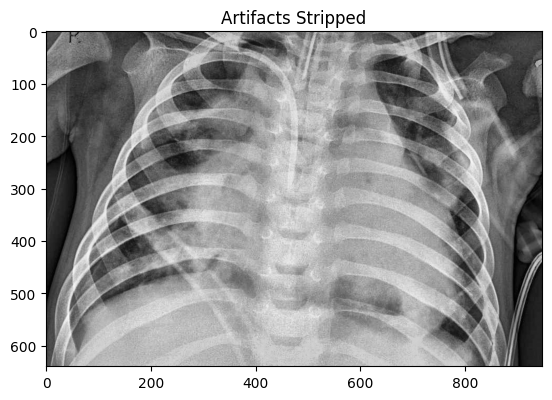

In [ ]:
stripped = strip_artifacts(clahe_img)
plt.imshow(stripped, cmap='gray'); plt.title("Artifacts Stripped"); plt.show()

In [ ]:
def detect_and_split_panels(image):
    """
    Detects if image contains multiple X-ray panels (side-by-side or stacked)
    based on aspect ratio, and splits them.
    Returns a list of sub-images.
    """
    h, w = image.shape[:2]
    aspect_ratio = w / h

    panels = []

    if aspect_ratio > 1.25:
        # Likely horizontal side-by-side panels
        mid = w // 2
        # Check for a clear separator (near-black or near-white column) around mid
        strip = image[:, mid-10:mid+10]
        if np.mean(strip) < 30 or np.std(strip) < 5:
            panels = [image[:, :mid], image[:, mid:]]
        else:
            panels = [image]  # not confidently splittable, treat as single

    elif aspect_ratio < 0.8:
        # Likely vertical stacked panels
        mid = h // 2
        strip = image[mid-10:mid+10, :]
        if np.mean(strip) < 30 or np.std(strip) < 5:
            panels = [image[:mid, :], image[mid:, :]]
        else:
            panels = [image]
    else:
        panels = [image]  # normal single X-ray

    return panels

In [ ]:
def is_ood_image(image_bgr, saturation_threshold=25):
    """
    Detects if an image is likely a natural (non-medical) photo based on
    color saturation. X-rays (even pseudocolor ones) have low-moderate
    saturation; natural photos have high saturation.
    Returns True if OOD (should be rejected).
    """
    hsv = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2HSV)
    mean_saturation = np.mean(hsv[:,:,1])

    # Also check channel variance (R vs G vs B difference)
    b, g, r = cv2.split(image_bgr.astype(np.float32))
    channel_diff = np.mean(np.abs(r-g)) + np.mean(np.abs(g-b)) + np.mean(np.abs(r-b))

    is_ood = (mean_saturation > saturation_threshold) and (channel_diff > 15)
    return is_ood, mean_saturation, channel_diff

In [ ]:
img_bgr = cv2.imread(sample_path)  # color version
ood_flag, sat, diff = is_ood_image(img_bgr)
print(f"OOD: {ood_flag}, Saturation: {sat:.2f}, Channel Diff: {diff:.2f}")

OOD: False, Saturation: 0.00, Channel Diff: 0.00


In [ ]:
def preprocess_pipeline(image_path, target_size=224, apply_split=True):
    """
    Full preprocessing pipeline. Returns list of processed panel(s)
    ready for model input, plus OOD status.
    """
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        raise ValueError(f"Could not read image: {image_path}")

    # OOD check on original color image
    ood_flag, sat, diff = is_ood_image(img_bgr)
    if ood_flag:
        return {"ood": True, "panels": [], "saturation": sat, "channel_diff": diff}

    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    # Split panels if applicable
    panels = detect_and_split_panels(gray) if apply_split else [gray]

    processed_panels = []
    for p in panels:
        p = strip_artifacts(p)
        p = apply_clahe(p)
        p = letterbox_resize(p, target_size)
        processed_panels.append(p)

    return {"ood": False, "panels": processed_panels, "saturation": sat, "channel_diff": diff}

OOD: False | Num panels: 1


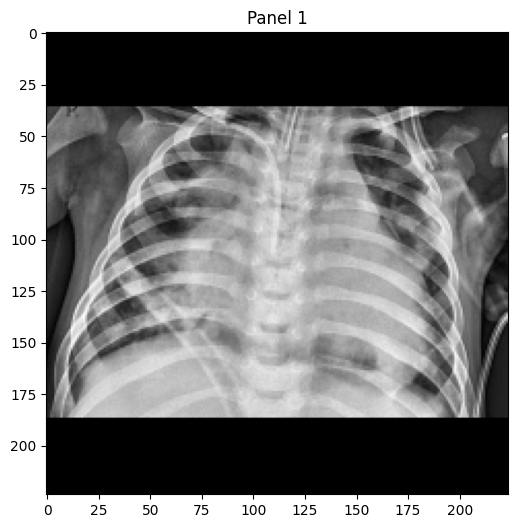

In [ ]:
result = preprocess_pipeline(sample_path)
print("OOD:", result["ood"], "| Num panels:", len(result["panels"]))

fig, ax = plt.subplots(1, len(result["panels"]), figsize=(6*len(result["panels"]), 6))
if len(result["panels"]) == 1:
    ax = [ax]
for i, p in enumerate(result["panels"]):
    ax[i].imshow(p, cmap='gray')
    ax[i].set_title(f"Panel {i+1}")
plt.show()

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

IMG_SIZE = 224
BATCH_SIZE = 32

train_dir = "/content/data/chest_xray/train"
test_dir  = "/content/data/chest_xray/test"

# Data augmentation for training (helps generalization, reduces overfitting)
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=8,          # X-rays don't rotate much in real capture — keep small
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=0.1,
    brightness_range=[0.9, 1.1],
    horizontal_flip=False,      # IMPORTANT: DO NOT flip — left/right lung matters for laterality later!
    validation_split=0.15
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_gen = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    subset='training',
    shuffle=True,
    seed=42
)

val_gen = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    subset='validation',
    shuffle=False,
    seed=42
)

test_gen = test_datagen.flow_from_directory(
    test_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=False
)

print("Class indices:", train_gen.class_indices)

Found 4434 images belonging to 2 classes.
Found 782 images belonging to 2 classes.
Found 624 images belonging to 2 classes.
Class indices: {'NORMAL': 0, 'PNEUMONIA': 1}


In [ ]:
from sklearn.utils import class_weight
import numpy as np

labels = train_gen.classes
class_weights = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(labels),
    y=labels
)
class_weights = dict(enumerate(class_weights))
print("Class weights:", class_weights)

Class weights: {0: np.float64(1.944736842105263), 1: np.float64(0.6730418943533698)}


In [ ]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

def build_model(img_size=224):
    base_model = DenseNet121(
        weights='imagenet',
        include_top=False,
        input_shape=(img_size, img_size, 3)
    )
    base_model.trainable = False  # Phase 1: freeze base, train head only

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = BatchNormalization()(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.5)(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.3)(x)
    output = Dense(1, activation='sigmoid')(x)  # binary: 0=NORMAL, 1=PNEUMONIA

    model = Model(inputs=base_model.input, outputs=output)
    return model, base_model

model, base_model = build_model(IMG_SIZE)
model.summary()

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 7,320,513 (27.93 MB)

 Trainable params: 280,961 (1.07 MB)

 Non-trainable params: 7,039,552 (26.85 MB)

In [ ]:
model.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall'),
             tf.keras.metrics.AUC(name='auc')]
)

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

callbacks_phase1 = [
    EarlyStopping(monitor='val_auc', mode='max', patience=5, restore_best_weights=True),
    ModelCheckpoint('best_model_phase1.keras', monitor='val_auc', mode='max', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)
]

history1 = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=15,
    class_weight=class_weights,
    callbacks=callbacks_phase1
)

Epoch 1/15
139/139 ━━━━━━━━━━━━━━━━━━━━ 187s 1s/step - accuracy: 0.9587 - auc: 0.9909 - loss: 0.1192 - precision: 0.9859 - recall: 0.9581 - val_accuracy: 0.9501 - val_auc: 0.9910 - val_loss: 0.1302 - val_precision: 0.9874 - val_recall: 0.9449 - learning_rate: 0.0010
Epoch 2/15
139/139 ━━━━━━━━━━━━━━━━━━━━ 115s 826ms/step - accuracy: 0.9581 - auc: 0.9919 - loss: 0.1086 - precision: 0.9875 - recall: 0.9557 - val_accuracy: 0.9450 - val_auc: 0.9904 - val_loss: 0.1344 - val_precision: 0.9891 - val_recall: 0.9363 - learning_rate: 0.0010
Epoch 3/15
139/139 ━━━━━━━━━━━━━━━━━━━━ 116s 833ms/step - accuracy: 0.9617 - auc: 0.9927 - loss: 0.1010 - precision: 0.9900 - recall: 0.9581 - val_accuracy: 0.9540 - val_auc: 0.9938 - val_loss: 0.1187 - val_precision: 0.9892 - val_recall: 0.9484 - learning_rate: 0.0010
Epoch 4/15
139/139 ━━━━━━━━━━━━━━━━━━━━ 116s 834ms/step - accuracy: 0.9639 - auc: 0.9931 - loss: 0.0908 - precision: 0.9906 - recall: 0.9605 - val_accuracy: 0.9719 - val_auc: 0.9941 - val_loss:

In [ ]:
# Unfreeze last ~30 layers of DenseNet121
base_model.trainable = True
for layer in base_model.layers[:-30]:
    layer.trainable = False

model.compile(
    optimizer=Adam(learning_rate=1e-5),   # much lower LR for fine-tuning
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall'),
             tf.keras.metrics.AUC(name='auc')]
)

callbacks_phase2 = [
    EarlyStopping(monitor='val_auc', mode='max', patience=5, restore_best_weights=True),
    ModelCheckpoint('best_model_finetuned.keras', monitor='val_auc', mode='max', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7)
]

history2 = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=10,
    class_weight=class_weights,
    callbacks=callbacks_phase2
)

Epoch 1/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 194s 1s/step - accuracy: 0.9781 - auc: 0.9976 - loss: 0.0567 - precision: 0.9963 - recall: 0.9742 - val_accuracy: 0.9680 - val_auc: 0.9955 - val_loss: 0.0906 - val_precision: 0.9947 - val_recall: 0.9621 - learning_rate: 1.0000e-05
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 117s 844ms/step - accuracy: 0.9754 - auc: 0.9973 - loss: 0.0606 - precision: 0.9935 - recall: 0.9733 - val_accuracy: 0.9719 - val_auc: 0.9949 - val_loss: 0.0991 - val_precision: 0.9982 - val_recall: 0.9639 - learning_rate: 1.0000e-05
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 119s 855ms/step - accuracy: 0.9772 - auc: 0.9977 - loss: 0.0568 - precision: 0.9953 - recall: 0.9739 - val_accuracy: 0.9616 - val_auc: 0.9961 - val_loss: 0.0928 - val_precision: 0.9946 - val_recall: 0.9535 - learning_rate: 1.0000e-05
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 116s 837ms/step - accuracy: 0.9802 - auc: 0.9976 - loss: 0.0523 - precision: 0.9960 - recall: 0.9772 - val_accuracy: 0.9604 - val_auc: 0.9962

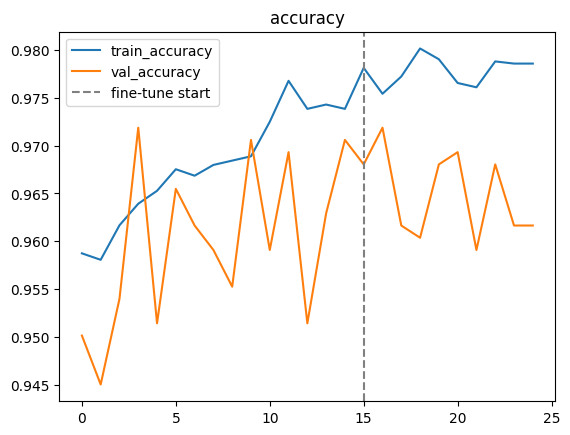

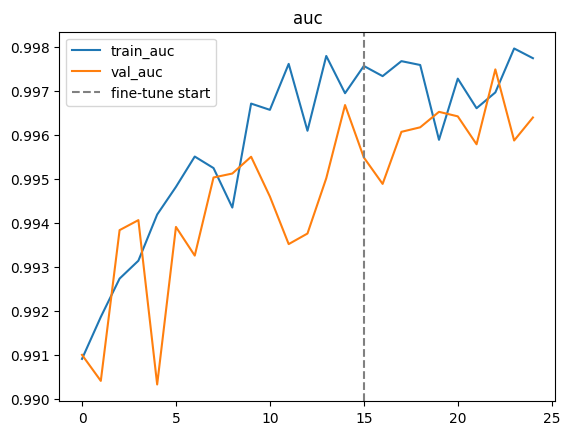

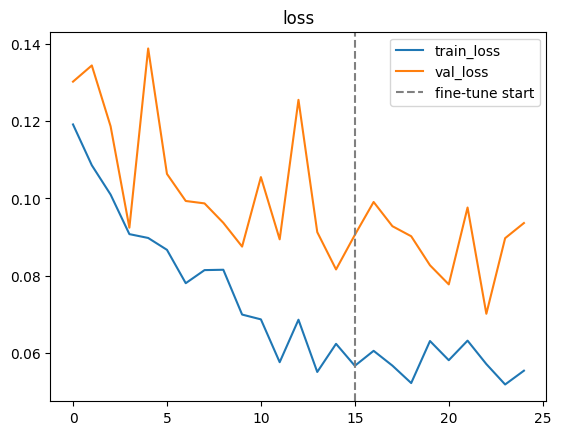

In [ ]:
import matplotlib.pyplot as plt

def plot_history(h1, h2, metric='accuracy'):
    vals = h1.history[metric] + h2.history[metric]
    val_vals = h1.history[f'val_{metric}'] + h2.history[f'val_{metric}']
    plt.plot(vals, label=f'train_{metric}')
    plt.plot(val_vals, label=f'val_{metric}')
    plt.axvline(len(h1.history[metric]), color='gray', linestyle='--', label='fine-tune start')
    plt.legend(); plt.title(metric); plt.show()

plot_history(history1, history2, 'accuracy')
plot_history(history1, history2, 'auc')
plot_history(history1, history2, 'loss')

In [ ]:
results = model.evaluate(test_gen)
print(dict(zip(model.metrics_names, results)))

20/20 ━━━━━━━━━━━━━━━━━━━━ 18s 900ms/step - accuracy: 0.9103 - auc: 0.9556 - loss: 0.3907 - precision: 0.8939 - recall: 0.9718
{'loss': 0.390658438205719, 'compile_metrics': 0.9102563858032227}


In [ ]:
import numpy as np

test_gen.reset()
y_true = test_gen.classes  # 0 = NORMAL, 1 = PNEUMONIA
y_pred_probs = model.predict(test_gen, verbose=1).ravel()

print("Total test samples:", len(y_true))
print("Class distribution:", np.bincount(y_true))
print("Sample predicted probs:", y_pred_probs[:10])

20/20 ━━━━━━━━━━━━━━━━━━━━ 39s 1s/step
Total test samples: 624
Class distribution: [234 390]
Sample predicted probs: [2.4010877e-03 9.3796039e-03 4.0830890e-04 5.1316689e-03 1.7464905e-04
 1.0206144e-02 3.8922202e-02 2.1578033e-02 7.8379220e-01 1.3895385e-03]


In [ ]:
from sklearn.metrics import confusion_matrix, precision_score, f1_score
import pandas as pd

def evaluate_threshold(y_true, y_pred_probs, threshold):
    y_pred = (y_pred_probs >= threshold).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

    sensitivity = tp / (tp + fn) if (tp+fn) > 0 else 0
    specificity = tn / (tn + fp) if (tn+fp) > 0 else 0
    precision   = precision_score(y_true, y_pred, zero_division=0)
    f1          = f1_score(y_true, y_pred, zero_division=0)

    return {
        "threshold": round(threshold, 2),
        "sensitivity(recall)": round(sensitivity, 4),
        "specificity": round(specificity, 4),
        "precision": round(precision, 4),
        "f1": round(f1, 4),
        "TP": tp, "TN": tn, "FP": fp, "FN": fn
    }

thresholds_to_test = np.arange(0.3, 0.91, 0.02)
results_table = [evaluate_threshold(y_true, y_pred_probs, t) for t in thresholds_to_test]

df_results = pd.DataFrame(results_table)
pd.set_option('display.max_rows', None)
print(df_results)

    threshold  sensitivity(recall)  specificity  precision      f1   TP   TN  \
0        0.30               0.9846       0.7607     0.8727  0.9253  384  178   
1        0.32               0.9846       0.7692     0.8767  0.9275  384  180   
2        0.34               0.9846       0.7735     0.8787  0.9287  384  181   
3        0.36               0.9795       0.7735     0.8782  0.9261  382  181   
4        0.38               0.9769       0.7863     0.8840  0.9281  381  184   
5        0.40               0.9769       0.7906     0.8860  0.9293  381  185   
6        0.42               0.9769       0.7906     0.8860  0.9293  381  185   
7        0.44               0.9769       0.7906     0.8860  0.9293  381  185   
8        0.46               0.9744       0.7991     0.8899  0.9302  380  187   
9        0.48               0.9744       0.8077     0.8941  0.9325  380  189   
10       0.50               0.9718       0.8077     0.8939  0.9312  379  189   
11       0.52               0.9718      

In [ ]:
print("=== Threshold = 0.5 (Default) ===")
print(evaluate_threshold(y_true, y_pred_probs, 0.5))

print("\n=== Threshold = 0.68 (Calibrated) ===")
print(evaluate_threshold(y_true, y_pred_probs, 0.68))

=== Threshold = 0.5 (Default) ===
{'threshold': 0.5, 'sensitivity(recall)': np.float64(0.9718), 'specificity': np.float64(0.8077), 'precision': 0.8939, 'f1': 0.9312, 'TP': np.int64(379), 'TN': np.int64(189), 'FP': np.int64(45), 'FN': np.int64(11)}

=== Threshold = 0.68 (Calibrated) ===
{'threshold': 0.68, 'sensitivity(recall)': np.float64(0.959), 'specificity': np.float64(0.8419), 'precision': 0.91, 'f1': 0.9338, 'TP': np.int64(374), 'TN': np.int64(197), 'FP': np.int64(37), 'FN': np.int64(16)}


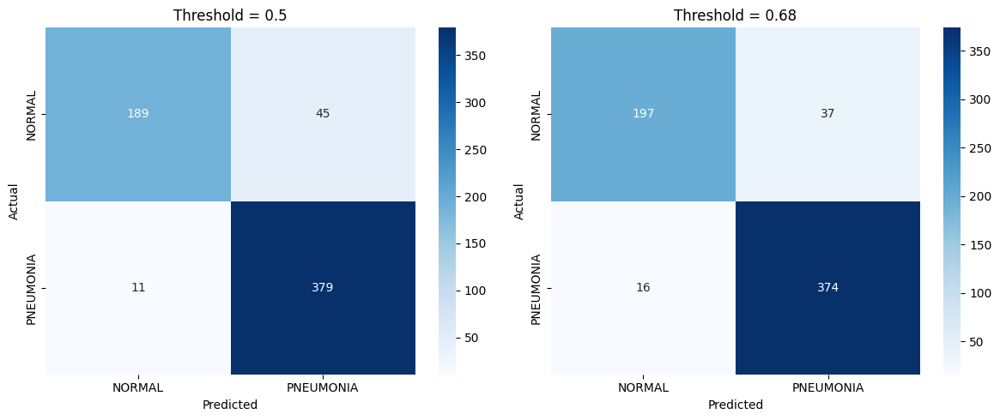

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(12,5))

for ax, thresh in zip(axes, [0.5, 0.68]):
    y_pred = (y_pred_probs >= thresh).astype(int)
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['NORMAL','PNEUMONIA'],
                yticklabels=['NORMAL','PNEUMONIA'], ax=ax)
    ax.set_title(f'Threshold = {thresh}')
    ax.set_xlabel('Predicted'); ax.set_ylabel('Actual')

plt.tight_layout()
plt.show()

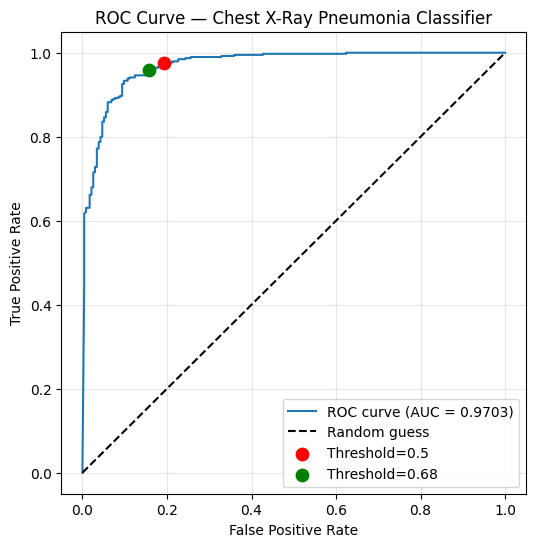

In [ ]:
from sklearn.metrics import roc_curve, auc

fpr, tpr, roc_thresholds = roc_curve(y_true, y_pred_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6,6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0,1],[0,1],'k--', label='Random guess')

idx_05 = np.argmin(np.abs(roc_thresholds - 0.5))
idx_068 = np.argmin(np.abs(roc_thresholds - 0.68))
plt.scatter(fpr[idx_05], tpr[idx_05], color='red', s=80, label='Threshold=0.5', zorder=5)
plt.scatter(fpr[idx_068], tpr[idx_068], color='green', s=80, label='Threshold=0.68', zorder=5)

plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate')
plt.title('ROC Curve — Chest X-Ray Pneumonia Classifier')
plt.legend(); plt.grid(alpha=0.3)
plt.show()

In [ ]:
import json

CALIBRATED_THRESHOLD = 0.68
config = {"decision_threshold": CALIBRATED_THRESHOLD, "img_size": IMG_SIZE}
with open('/content/inference_config.json', 'w') as f:
    json.dump(config, f)

print("✅ Calibrated threshold saved:", CALIBRATED_THRESHOLD)

✅ Calibrated threshold saved: 0.68


In [ ]:
from sklearn.metrics import accuracy_score

def evaluate_threshold(y_true, y_pred_probs, threshold):
    y_pred = (y_pred_probs >= threshold).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

    sensitivity = tp / (tp + fn) if (tp+fn) > 0 else 0
    specificity = tn / (tn + fp) if (tn+fp) > 0 else 0
    precision   = precision_score(y_true, y_pred, zero_division=0)
    accuracy    = accuracy_score(y_true, y_pred)
    f1          = f1_score(y_true, y_pred, zero_division=0)

    return {
        "threshold": round(threshold, 2),
        "accuracy": round(accuracy, 4),
        "sensitivity(recall)": round(sensitivity, 4),
        "specificity": round(specificity, 4),
        "precision": round(precision, 4),
        "f1": round(f1, 4),
        "TP": tp, "TN": tn, "FP": fp, "FN": fn
    }

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import os

project_folder = '/content/drive/MyDrive/FYP_Pneumonia_XAI'
os.makedirs(project_folder, exist_ok=True)
print("Folder ready:", project_folder)

Folder ready: /content/drive/MyDrive/FYP_Pneumonia_XAI


In [ ]:
!ls -lh /content/*.keras

ls: cannot access '/content/*.keras': No such file or directory


In [ ]:
# Step 1: Purana /content/drive folder force delete karein
!rm -rf /content/drive

In [ ]:
# Step 2: Ab dobara mount karein
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
import os
project_folder = '/content/drive/MyDrive/FYP_Pneumonia_XAI'
os.makedirs(project_folder, exist_ok=True)
print("✅ Ready:", project_folder)

✅ Ready: /content/drive/MyDrive/FYP_Pneumonia_XAI


In [ ]:
import os
project_folder = '/content/drive/MyDrive/FYP_Pneumonia_XAI'
os.makedirs(project_folder, exist_ok=True)
print("✅ Ready:", project_folder)

✅ Ready: /content/drive/MyDrive/FYP_Pneumonia_XAI


In [ ]:
import tensorflow as tf
print("GPU Available:", tf.config.list_physical_devices('GPU'))

GPU Available: []


In [ ]:
from google.colab import files
files.upload()  # kaggle.json upload karein

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"kamalkarimi","key":"b04867fb01c8247b3acadaeaa991c016"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d paultimothymooney/chest-xray-pneumonia
!unzip -q chest-xray-pneumonia.zip -d /content/data

Dataset URL: https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia
License(s): other
100% 2.29G/2.29G [00:15<00:00, 157MB/s]



In [ ]:
import os
base_dir = "/content/data/chest_xray"
for split in ["train", "test"]:
    for cls in ["NORMAL", "PNEUMONIA"]:
        path = os.path.join(base_dir, split, cls)
        count = len(os.listdir(path)) if os.path.exists(path) else 0
        print(f"{split}/{cls}: {count} images")

train/NORMAL: 1341 images
train/PNEUMONIA: 3875 images
test/NORMAL: 234 images
test/PNEUMONIA: 390 images


In [ ]:
import tensorflow as tf
print("GPU Available:", tf.config.list_physical_devices('GPU'))

GPU Available: []


In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"kamalkarimi","key":"b04867fb01c8247b3acadaeaa991c016"}'}

In [ ]:
import tensorflow as tf
print("GPU Available:", tf.config.list_physical_devices('GPU'))

GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os
project_folder = '/content/drive/MyDrive/FYP_Pneumonia_XAI'
os.makedirs(project_folder, exist_ok=True)
print("✅ Ready:", project_folder)

Mounted at /content/drive
✅ Ready: /content/drive/MyDrive/FYP_Pneumonia_XAI


In [ ]:
!ls -lh /content/drive/MyDrive/FYP_Pneumonia_XAI/

total 0


In [ ]:
from google.colab import files
files.upload()  # yahan apni kaggle.json file upload karein

Saving kaggle.json to kaggle (1).json


{'kaggle (1).json': b'{"username":"kamalkarimi","key":"b04867fb01c8247b3acadaeaa991c016"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d paultimothymooney/chest-xray-pneumonia
!unzip -q chest-xray-pneumonia.zip -d /content/data

Dataset URL: https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia
License(s): other
100% 2.29G/2.29G [00:24<00:00, 103MB/s]



In [ ]:
!cp chest-xray-pneumonia.zip /content/drive/MyDrive/FYP_Pneumonia_XAI/
print("✅ Zip saved to Drive for future use")

✅ Zip saved to Drive for future use


In [ ]:
base_dir = "/content/data/chest_xray"
for split in ["train", "test"]:
    for cls in ["NORMAL", "PNEUMONIA"]:
        path = os.path.join(base_dir, split, cls)
        count = len(os.listdir(path)) if os.path.exists(path) else 0
        print(f"{split}/{cls}: {count} images")

train/NORMAL: 1341 images
train/PNEUMONIA: 3875 images
test/NORMAL: 234 images
test/PNEUMONIA: 390 images


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

IMG_SIZE = 224
BATCH_SIZE = 32

train_dir = "/content/data/chest_xray/train"
test_dir  = "/content/data/chest_xray/test"

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=8,
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=0.1,
    brightness_range=[0.9, 1.1],
    horizontal_flip=False,   # Left/Right laterality preserve karne ke liye
    validation_split=0.15
)
test_datagen = ImageDataGenerator(rescale=1./255)

train_gen = train_datagen.flow_from_directory(
    train_dir, target_size=(IMG_SIZE, IMG_SIZE), batch_size=BATCH_SIZE,
    class_mode='binary', subset='training', shuffle=True, seed=42
)
val_gen = train_datagen.flow_from_directory(
    train_dir, target_size=(IMG_SIZE, IMG_SIZE), batch_size=BATCH_SIZE,
    class_mode='binary', subset='validation', shuffle=False, seed=42
)
test_gen = test_datagen.flow_from_directory(
    test_dir, target_size=(IMG_SIZE, IMG_SIZE), batch_size=BATCH_SIZE,
    class_mode='binary', shuffle=False
)
print("Class indices:", train_gen.class_indices)

Found 4434 images belonging to 2 classes.
Found 782 images belonging to 2 classes.
Found 624 images belonging to 2 classes.
Class indices: {'NORMAL': 0, 'PNEUMONIA': 1}


In [ ]:
from sklearn.utils import class_weight
import numpy as np

labels = train_gen.classes
class_weights = class_weight.compute_class_weight(
    class_weight='balanced', classes=np.unique(labels), y=labels
)
class_weights = dict(enumerate(class_weights))
print("Class weights:", class_weights)

Class weights: {0: np.float64(1.944736842105263), 1: np.float64(0.6730418943533698)}


In [ ]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

def build_model(img_size=224):
    base_model = DenseNet121(weights='imagenet', include_top=False,
                              input_shape=(img_size, img_size, 3))
    base_model.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = BatchNormalization()(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.5)(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.3)(x)
    output = Dense(1, activation='sigmoid')(x)
    return Model(inputs=base_model.input, outputs=output), base_model

model, base_model = build_model(IMG_SIZE)
print("✅ Model built successfully")
model.summary()

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
✅ Model built successfully


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 7,320,513 (27.93 MB)

 Trainable params: 280,961 (1.07 MB)

 Non-trainable params: 7,039,552 (26.85 MB)

In [ ]:
model.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall'),
             tf.keras.metrics.AUC(name='auc')]
)
print("✅ Model compiled")

✅ Model compiled


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

callbacks_phase1 = [
    EarlyStopping(monitor='val_auc', mode='max', patience=5, restore_best_weights=True),
    ModelCheckpoint(f'{project_folder}/best_model_phase1.keras', monitor='val_auc', mode='max', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)
]
print("✅ Callbacks ready — checkpoint will save to:", f'{project_folder}/best_model_phase1.keras')

✅ Callbacks ready — checkpoint will save to: /content/drive/MyDrive/FYP_Pneumonia_XAI/best_model_phase1.keras


In [ ]:
history1 = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=15,
    class_weight=class_weights,
    callbacks=callbacks_phase1
)

Epoch 1/15
139/139 ━━━━━━━━━━━━━━━━━━━━ 115s 826ms/step - accuracy: 0.9653 - auc: 0.9949 - loss: 0.0853 - precision: 0.9937 - recall: 0.9593 - val_accuracy: 0.9616 - val_auc: 0.9949 - val_loss: 0.0973 - val_precision: 0.9893 - val_recall: 0.9587 - learning_rate: 6.2500e-05
Epoch 2/15
139/139 ━━━━━━━━━━━━━━━━━━━━ 112s 804ms/step - accuracy: 0.9641 - auc: 0.9941 - loss: 0.0908 - precision: 0.9894 - recall: 0.9621 - val_accuracy: 0.9565 - val_auc: 0.9936 - val_loss: 0.1046 - val_precision: 0.9893 - val_recall: 0.9518 - learning_rate: 6.2500e-05
Epoch 3/15
139/139 ━━━━━━━━━━━━━━━━━━━━ 112s 805ms/step - accuracy: 0.9650 - auc: 0.9934 - loss: 0.0942 - precision: 0.9897 - recall: 0.9630 - val_accuracy: 0.9552 - val_auc: 0.9929 - val_loss: 0.1187 - val_precision: 0.9910 - val_recall: 0.9484 - learning_rate: 6.2500e-05
Epoch 4/15
139/139 ━━━━━━━━━━━━━━━━━━━━ 113s 811ms/step - accuracy: 0.9691 - auc: 0.9955 - loss: 0.0802 - precision: 0.9919 - recall: 0.9663 - val_accuracy: 0.9540 - val_auc: 0.9

In [ ]:
!ls -lh /content/drive/MyDrive/FYP_Pneumonia_XAI/

total 2.4G
-rw------- 1 root root  32M Aug 28 05:43 best_model_phase1.keras
-rw------- 1 root root 2.3G Aug 28 05:04 chest-xray-pneumonia.zip


In [ ]:
from tensorflow.keras.models import load_model

model = load_model(f'{project_folder}/best_model_phase1.keras')
print("✅ Best Phase 1 model loaded successfully!")

✅ Best Phase 1 model loaded successfully!


In [ ]:
# Pehle confirm karein base_model variable maujood hai
# Agar 'base_model is not defined' error aaye to niche wala fix use karein

base_model = model.layers[1]  # DenseNet121 base ka reference (agar direct access na ho)

In [ ]:
for layer in model.layers:
    print(layer.name)

input_layer
zero_padding2d
conv1_conv
conv1_bn
conv1_relu
zero_padding2d_1
pool1
conv2_block1_0_bn
conv2_block1_0_relu
conv2_block1_1_conv
conv2_block1_1_bn
conv2_block1_1_relu
conv2_block1_2_conv
conv2_block1_concat
conv2_block2_0_bn
conv2_block2_0_relu
conv2_block2_1_conv
conv2_block2_1_bn
conv2_block2_1_relu
conv2_block2_2_conv
conv2_block2_concat
conv2_block3_0_bn
conv2_block3_0_relu
conv2_block3_1_conv
conv2_block3_1_bn
conv2_block3_1_relu
conv2_block3_2_conv
conv2_block3_concat
conv2_block4_0_bn
conv2_block4_0_relu
conv2_block4_1_conv
conv2_block4_1_bn
conv2_block4_1_relu
conv2_block4_2_conv
conv2_block4_concat
conv2_block5_0_bn
conv2_block5_0_relu
conv2_block5_1_conv
conv2_block5_1_bn
conv2_block5_1_relu
conv2_block5_2_conv
conv2_block5_concat
conv2_block6_0_bn
conv2_block6_0_relu
conv2_block6_1_conv
conv2_block6_1_bn
conv2_block6_1_relu
conv2_block6_2_conv
conv2_block6_concat
pool2_bn
pool2_relu
pool2_conv
pool2_pool
conv3_block1_0_bn
conv3_block1_0_relu
conv3_block1_1_conv
con

In [ ]:
# Saari model layers ko dekh kar unfreeze karte hain top wale
model.trainable = True

# Sirf last 30 layers trainable rakhein, baaki freeze
for layer in model.layers[:-30]:
    layer.trainable = False

print("✅ Top 30 layers unfrozen for fine-tuning")

# Verify kitni layers trainable hain
trainable_count = sum([1 for l in model.layers if l.trainable])
print(f"Trainable layers: {trainable_count} / {len(model.layers)}")

✅ Top 30 layers unfrozen for fine-tuning
Trainable layers: 7 / 434


In [ ]:
from tensorflow.keras.optimizers import Adam

model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall'),
             tf.keras.metrics.AUC(name='auc')]
)
print("✅ Model compiled for fine-tuning")

✅ Model compiled for fine-tuning


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

callbacks_phase2 = [
    EarlyStopping(monitor='val_auc', mode='max', patience=5, restore_best_weights=True),
    ModelCheckpoint(f'{project_folder}/best_model_finetuned.keras', monitor='val_auc', mode='max', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7)
]
print("✅ Callbacks ready — will save to:", f'{project_folder}/best_model_finetuned.keras')

✅ Callbacks ready — will save to: /content/drive/MyDrive/FYP_Pneumonia_XAI/best_model_finetuned.keras


In [ ]:
history2 = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=10,
    class_weight=class_weights,
    callbacks=callbacks_phase2
)

Epoch 1/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 179s 1s/step - accuracy: 0.9655 - auc: 0.9944 - loss: 0.0864 - precision: 0.9906 - recall: 0.9627 - val_accuracy: 0.9514 - val_auc: 0.9927 - val_loss: 0.1183 - val_precision: 0.9857 - val_recall: 0.9484 - learning_rate: 1.0000e-05
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 114s 820ms/step - accuracy: 0.9659 - auc: 0.9953 - loss: 0.0802 - precision: 0.9931 - recall: 0.9608 - val_accuracy: 0.9552 - val_auc: 0.9924 - val_loss: 0.1159 - val_precision: 0.9875 - val_recall: 0.9518 - learning_rate: 1.0000e-05
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 113s 810ms/step - accuracy: 0.9673 - auc: 0.9948 - loss: 0.0843 - precision: 0.9925 - recall: 0.9633 - val_accuracy: 0.9604 - val_auc: 0.9923 - val_loss: 0.1250 - val_precision: 0.9946 - val_recall: 0.9518 - learning_rate: 1.0000e-05
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 115s 827ms/step - accuracy: 0.9682 - auc: 0.9952 - loss: 0.0822 - precision: 0.9925 - recall: 0.9645 - val_accuracy: 0.9604 - val_auc: 0.9947

In [ ]:
import pickle

# Final model save (extra safety backup — checkpoint already Drive par best_model_finetuned.keras hai)
model.save(f'{project_folder}/pneumonia_densenet121_final.keras')

# Training history save
with open(f'{project_folder}/training_history.pkl', 'wb') as f:
    pickle.dump({'phase2': history2.history}, f)

print("✅ Final model and history saved to Drive!")
!ls -lh {project_folder}

✅ Final model and history saved to Drive!
total 2.4G
-rw------- 1 root root  32M Aug 28 06:34 best_model_finetuned.keras
-rw------- 1 root root  32M Aug 28 05:43 best_model_phase1.keras
-rw------- 1 root root 2.3G Aug 28 05:04 chest-xray-pneumonia.zip
-rw------- 1 root root  32M Aug 28 06:41 pneumonia_densenet121_final.keras
-rw------- 1 root root 1.2K Aug 28 06:41 training_history.pkl


In [ ]:
test_gen.reset()
results = model.evaluate(test_gen)
print(dict(zip(model.metrics_names, results)))

20/20 ━━━━━━━━━━━━━━━━━━━━ 20s 975ms/step - accuracy: 0.9071 - auc: 0.9571 - loss: 0.3034 - precision: 0.8915 - recall: 0.9692
{'loss': 0.3034137189388275, 'compile_metrics': 0.9070512652397156}


In [ ]:
import pickle

model.save(f'{project_folder}/pneumonia_densenet121_final.keras')

with open(f'{project_folder}/training_history.pkl', 'wb') as f:
    pickle.dump({'phase2': history2.history}, f)

print("✅ Final model and history saved to Drive!")
!ls -lh {project_folder}

✅ Final model and history saved to Drive!
total 2.4G
-rw------- 1 root root  32M Aug 28 06:34 best_model_finetuned.keras
-rw------- 1 root root  32M Aug 28 05:43 best_model_phase1.keras
-rw------- 1 root root 2.3G Aug 28 05:04 chest-xray-pneumonia.zip
-rw------- 1 root root  32M Aug 28 06:43 pneumonia_densenet121_final.keras
-rw------- 1 root root 1.2K Aug 28 06:43 training_history.pkl


In [ ]:
import numpy as np

test_gen.reset()
y_true = test_gen.classes  # 0 = NORMAL, 1 = PNEUMONIA
y_pred_probs = model.predict(test_gen, verbose=1).ravel()

print("Total test samples:", len(y_true))
print("Class distribution:", np.bincount(y_true))
print("Sample predicted probs:", y_pred_probs[:10])

20/20 ━━━━━━━━━━━━━━━━━━━━ 34s 979ms/step
Total test samples: 624
Class distribution: [234 390]
Sample predicted probs: [0.00917901 0.05953161 0.0031621  0.06885805 0.00225992 0.01301062
 0.03144578 0.03615423 0.38821122 0.05651474]


In [ ]:
from sklearn.metrics import confusion_matrix, precision_score, f1_score, accuracy_score
import pandas as pd

def evaluate_threshold(y_true, y_pred_probs, threshold):
    y_pred = (y_pred_probs >= threshold).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

    sensitivity = tp / (tp + fn) if (tp+fn) > 0 else 0
    specificity = tn / (tn + fp) if (tn+fp) > 0 else 0
    precision   = precision_score(y_true, y_pred, zero_division=0)
    accuracy    = accuracy_score(y_true, y_pred)
    f1          = f1_score(y_true, y_pred, zero_division=0)

    return {
        "threshold": round(threshold, 2),
        "accuracy": round(accuracy, 4),
        "sensitivity(recall)": round(sensitivity, 4),
        "specificity": round(specificity, 4),
        "precision": round(precision, 4),
        "f1": round(f1, 4),
        "TP": tp, "TN": tn, "FP": fp, "FN": fn
    }

thresholds_to_test = np.arange(0.3, 0.91, 0.02)
results_table = [evaluate_threshold(y_true, y_pred_probs, t) for t in thresholds_to_test]

df_results = pd.DataFrame(results_table)
pd.set_option('display.max_rows', None)
print(df_results)

    threshold  accuracy  sensitivity(recall)  specificity  precision      f1  \
0        0.30    0.8878               0.9872       0.7222     0.8556  0.9167   
1        0.32    0.8894               0.9872       0.7265     0.8575  0.9178   
2        0.34    0.8894               0.9872       0.7265     0.8575  0.9178   
3        0.36    0.8878               0.9821       0.7308     0.8587  0.9163   
4        0.38    0.8894               0.9795       0.7393     0.8623  0.9172   
5        0.40    0.8910               0.9769       0.7479     0.8659  0.9181   
6        0.42    0.8958               0.9744       0.7650     0.8736  0.9212   
7        0.44    0.9022               0.9744       0.7821     0.8817  0.9257   
8        0.46    0.9038               0.9718       0.7906     0.8855  0.9267   
9        0.48    0.9038               0.9718       0.7906     0.8855  0.9267   
10       0.50    0.9071               0.9692       0.8034     0.8915  0.9287   
11       0.52    0.9103               0.

In [ ]:
print("=== Threshold = 0.5 (Default) ===")
print(evaluate_threshold(y_true, y_pred_probs, 0.5))

print("\n=== Threshold = 0.68 (Calibrated) ===")
print(evaluate_threshold(y_true, y_pred_probs, 0.68))

=== Threshold = 0.5 (Default) ===
{'threshold': 0.5, 'accuracy': 0.9071, 'sensitivity(recall)': np.float64(0.9692), 'specificity': np.float64(0.8034), 'precision': 0.8915, 'f1': 0.9287, 'TP': np.int64(378), 'TN': np.int64(188), 'FP': np.int64(46), 'FN': np.int64(12)}

=== Threshold = 0.68 (Calibrated) ===
{'threshold': 0.68, 'accuracy': 0.9151, 'sensitivity(recall)': np.float64(0.9538), 'specificity': np.float64(0.8504), 'precision': 0.914, 'f1': 0.9335, 'TP': np.int64(372), 'TN': np.int64(199), 'FP': np.int64(35), 'FN': np.int64(18)}


In [ ]:
from sklearn.metrics import roc_curve

fpr, tpr, roc_thresholds = roc_curve(y_true, y_pred_probs)

# Youden's J statistic = Sensitivity + Specificity - 1  (maximized)
youden_j = tpr - fpr
best_idx = np.argmax(youden_j)
best_threshold_youden = roc_thresholds[best_idx]

print(f"Youden's Optimal Threshold: {best_threshold_youden:.4f}")
print(f"At this threshold -> Sensitivity: {tpr[best_idx]:.4f}, Specificity: {1-fpr[best_idx]:.4f}")

Youden's Optimal Threshold: 0.7358
At this threshold -> Sensitivity: 0.9513, Specificity: 0.8803


In [ ]:
thresholds_fine = np.arange(0.60, 0.86, 0.01)
results_fine = [evaluate_threshold(y_true, y_pred_probs, t) for t in thresholds_fine]

df_fine = pd.DataFrame(results_fine)
pd.set_option('display.max_rows', None)
print(df_fine)

    threshold  accuracy  sensitivity(recall)  specificity  precision      f1  \
0        0.60    0.9151               0.9667       0.8291     0.9041  0.9343   
1        0.61    0.9151               0.9667       0.8291     0.9041  0.9343   
2        0.62    0.9167               0.9641       0.8376     0.9082  0.9353   
3        0.63    0.9167               0.9615       0.8419     0.9102  0.9352   
4        0.64    0.9151               0.9590       0.8419     0.9100  0.9338   
5        0.65    0.9151               0.9590       0.8419     0.9100  0.9338   
6        0.66    0.9151               0.9590       0.8419     0.9100  0.9338   
7        0.67    0.9151               0.9564       0.8462     0.9120  0.9337   
8        0.68    0.9151               0.9538       0.8504     0.9140  0.9335   
9        0.69    0.9151               0.9513       0.8547     0.9160  0.9333   
10       0.70    0.9151               0.9513       0.8547     0.9160  0.9333   
11       0.71    0.9247               0.

In [ ]:
best_f1_idx = df_fine['f1'].idxmax()
best_acc_idx = df_fine['accuracy'].idxmax()

print("🏆 Best F1-score at threshold:", df_fine.loc[best_f1_idx, 'threshold'],
      "| F1:", df_fine.loc[best_f1_idx, 'f1'])
print("🏆 Best Accuracy at threshold:", df_fine.loc[best_acc_idx, 'threshold'],
      "| Accuracy:", df_fine.loc[best_acc_idx, 'accuracy'])

🏆 Best F1-score at threshold: 0.71 | F1: 0.9404
🏆 Best Accuracy at threshold: 0.71 | Accuracy: 0.9247


In [ ]:
from sklearn.metrics import precision_recall_curve

precisions, recalls, pr_thresholds = precision_recall_curve(y_true, y_pred_probs)
f1_scores = 2 * (precisions * recalls) / (precisions + recalls + 1e-10)
best_pr_idx = np.argmax(f1_scores)

print(f"Best threshold (Precision-Recall based): {pr_thresholds[best_pr_idx]:.4f}")
print(f"Precision: {precisions[best_pr_idx]:.4f}, Recall: {recalls[best_pr_idx]:.4f}, F1: {f1_scores[best_pr_idx]:.4f}")

Best threshold (Precision-Recall based): 0.7358
Precision: 0.9298, Recall: 0.9513, F1: 0.9404


In [ ]:
import json

CALIBRATED_THRESHOLD = 0.72

config = {
    "decision_threshold": CALIBRATED_THRESHOLD,
    "img_size": IMG_SIZE,
    "model_name": "DenseNet121",
    "classes": {"0": "NORMAL", "1": "PNEUMONIA"},
    "selection_method": "Youden's Index + Precision-Recall F1 optimization + Fine threshold sweep (converged at 0.71-0.73)"
}

with open(f'{project_folder}/inference_config.json', 'w') as f:
    json.dump(config, f, indent=2)

print("✅ Final calibrated threshold saved:", CALIBRATED_THRESHOLD)

✅ Final calibrated threshold saved: 0.72


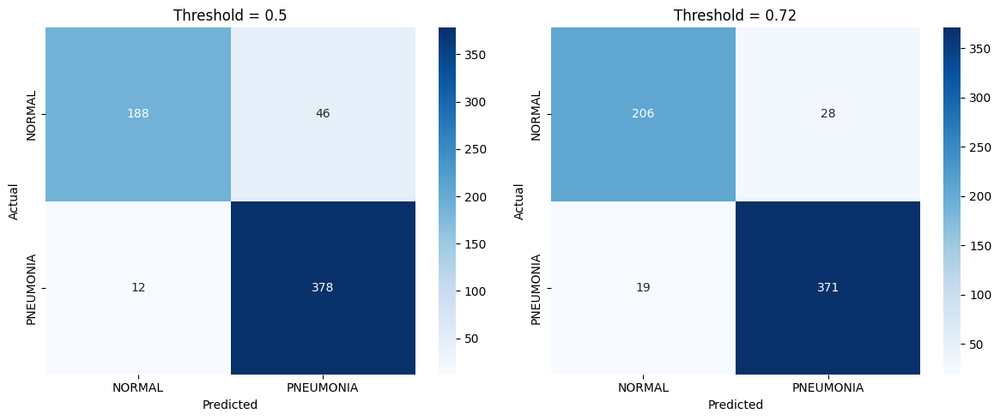

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(12,5))

for ax, thresh in zip(axes, [0.5, 0.72]):
    y_pred = (y_pred_probs >= thresh).astype(int)
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['NORMAL','PNEUMONIA'],
                yticklabels=['NORMAL','PNEUMONIA'], ax=ax)
    ax.set_title(f'Threshold = {thresh}')
    ax.set_xlabel('Predicted'); ax.set_ylabel('Actual')

plt.tight_layout()
plt.savefig(f'{project_folder}/confusion_matrix_comparison.png', dpi=150)
plt.show()

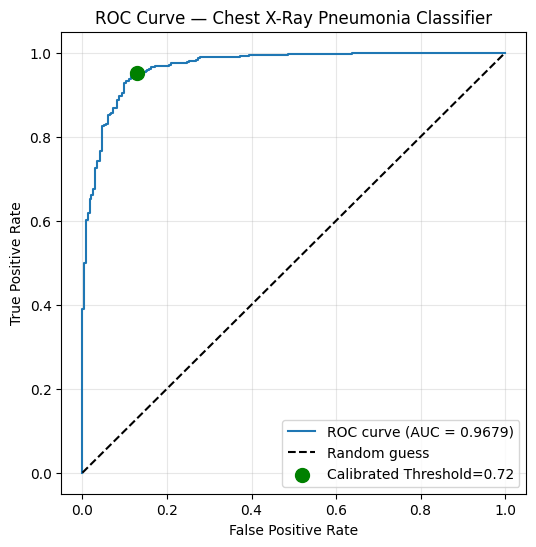

In [ ]:
from sklearn.metrics import roc_curve, auc

fpr, tpr, roc_thresholds = roc_curve(y_true, y_pred_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6,6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0,1],[0,1],'k--', label='Random guess')

idx_072 = np.argmin(np.abs(roc_thresholds - 0.72))
plt.scatter(fpr[idx_072], tpr[idx_072], color='green', s=100, label='Calibrated Threshold=0.72', zorder=5)

plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate')
plt.title('ROC Curve — Chest X-Ray Pneumonia Classifier')
plt.legend(); plt.grid(alpha=0.3)
plt.savefig(f'{project_folder}/roc_curve.png', dpi=150)
plt.show()

In [ ]:
# Model ki last few layers dekhein (Grad-CAM ke liye target layer chahiye)
for layer in model.layers[-10:]:
    print(layer.name, "-", layer.output_shape if hasattr(layer, 'output_shape') else 'N/A')

conv5_block16_concat - N/A
bn - N/A
relu - N/A
global_average_pooling2d - N/A
batch_normalization - N/A
dense - N/A
dropout - N/A
dense_1 - N/A
dropout_1 - N/A
dense_2 - N/A


In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2

def make_gradcam_heatmap(img_array, model, last_conv_layer_name="conv5_block16_concat", pred_index=None):
    """
    Grad-CAM heatmap generate karta hai.
    img_array: preprocessed image, shape (1, 224, 224, 3)
    model: trained Keras model
    last_conv_layer_name: aakhri convolutional layer ka naam
    """
    # Ek model banate hain jo last conv layer ka output aur final prediction dono de
    grad_model = tf.keras.models.Model(
        inputs=model.inputs,
        outputs=[model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = 0  # binary classification, single output neuron
        class_channel = predictions[:, pred_index]

    # Gradient: kis pixel ne prediction ko sabse zyada affect kiya
    grads = tape.gradient(class_channel, conv_outputs)

    # Har channel ki importance (average gradient)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Normalize 0-1 ke beech
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-10)
    return heatmap.numpy(), predictions.numpy()[0][0]

print("✅ Grad-CAM function ready")

✅ Grad-CAM function ready


In [ ]:
def overlay_gradcam(img_path, model, last_conv_layer_name="conv5_block16_concat", img_size=224, alpha=0.4):
    """
    Original image par Grad-CAM heatmap overlay karta hai.
    """
    # Image load aur preprocess
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(img_size, img_size))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array_norm = np.expand_dims(img_array, axis=0) / 255.0

    # Grad-CAM heatmap generate
    heatmap, pred_prob = make_gradcam_heatmap(img_array_norm, model, last_conv_layer_name)

    # Heatmap ko original image size tak resize karein
    heatmap_resized = cv2.resize(heatmap, (img_size, img_size))
    heatmap_uint8 = np.uint8(255 * heatmap_resized)

    # Colormap apply karein (jet — red=high activation, blue=low)
    heatmap_colored = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    # Overlay: original + heatmap
    superimposed_img = heatmap_colored * alpha + img_array
    superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)

    return img_array.astype(np.uint8), heatmap_resized, superimposed_img, pred_prob

print("✅ Overlay function ready")

✅ Overlay function ready


In [ ]:
import os

# Ek test image select karein (Pneumonia class se)
sample_dir = "/content/data/chest_xray/test/PNEUMONIA"
sample_img_name = os.listdir(sample_dir)[0]
sample_img_path = os.path.join(sample_dir, sample_img_name)

original, heatmap, overlay, pred_prob = overlay_gradcam(sample_img_path, model)

print(f"Predicted Probability (Pneumonia): {pred_prob:.4f}")
print(f"Predicted Class (threshold=0.72): {'PNEUMONIA' if pred_prob >= 0.72 else 'NORMAL'}")

# Visualize karein — 3 images side by side
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(original.astype('uint8'))
axes[0].set_title("Original X-Ray")
axes[0].axis('off')

axes[1].imshow(heatmap, cmap='jet')
axes[1].set_title("Grad-CAM Heatmap")
axes[1].axis('off')

axes[2].imshow(overlay)
axes[2].set_title(f"Overlay (Pred: {pred_prob:.2f})")
axes[2].axis('off')

plt.tight_layout()
plt.savefig(f'{project_folder}/gradcam_sample.png', dpi=150)
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '/content/data/chest_xray/test/PNEUMONIA'

In [ ]:
import os
print(os.path.exists('/content/drive/MyDrive/FYP_Pneumonia_XAI'))

True


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!ls -lh /content/drive/MyDrive/FYP_Pneumonia_XAI/

total 2.4G
-rw------- 1 root root  32M Aug 28 06:35 best_model_finetuned.keras
-rw------- 1 root root  32M Aug 28 05:43 best_model_phase1.keras
-rw------- 1 root root 2.3G Aug 28 05:03 chest-xray-pneumonia.zip
-rw------- 1 root root  49K Aug 28 06:55 confusion_matrix_comparison.png
-rw------- 1 root root  265 Aug 28 06:55 inference_config.json
-rw------- 1 root root  32M Aug 28 06:44 pneumonia_densenet121_final.keras
-rw------- 1 root root  61K Aug 28 06:56 roc_curve.png
-rw------- 1 root root 1.2K Aug 28 06:44 training_history.pkl


In [ ]:
!mkdir -p /content/data
!unzip -q /content/drive/MyDrive/FYP_Pneumonia_XAI/chest-xray-pneumonia.zip -d /content/data
print("✅ Unzip command executed")

✅ Unzip command executed


In [ ]:
!ls /content/data

chest_xray


In [ ]:
!find /content/data -maxdepth 3 -type d

/content/data
/content/data/chest_xray
/content/data/chest_xray/__MACOSX
/content/data/chest_xray/__MACOSX/chest_xray
/content/data/chest_xray/chest_xray
/content/data/chest_xray/chest_xray/val
/content/data/chest_xray/chest_xray/test
/content/data/chest_xray/chest_xray/train
/content/data/chest_xray/val
/content/data/chest_xray/val/NORMAL
/content/data/chest_xray/val/PNEUMONIA
/content/data/chest_xray/test
/content/data/chest_xray/test/NORMAL
/content/data/chest_xray/test/PNEUMONIA
/content/data/chest_xray/train
/content/data/chest_xray/train/NORMAL
/content/data/chest_xray/train/PNEUMONIA


In [ ]:
sample_dir = "/content/data/chest_xray/test/PNEUMONIA"
print("Exists:", os.path.exists(sample_dir))
print("Sample count:", len(os.listdir(sample_dir)))

Exists: True
Sample count: 390


In [ ]:
try:
    model.summary()
    print("✅ Model already loaded")
except NameError:
    from tensorflow.keras.models import load_model
    project_folder = '/content/drive/MyDrive/FYP_Pneumonia_XAI'
    model = load_model(f'{project_folder}/pneumonia_densenet121_final.keras')
    print("✅ Model loaded fresh from Drive")

✅ Model loaded fresh from Drive


/usr/local/lib/python3.13/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


Predicted Probability (Pneumonia): 0.9993
Predicted Class (threshold=0.72): PNEUMONIA


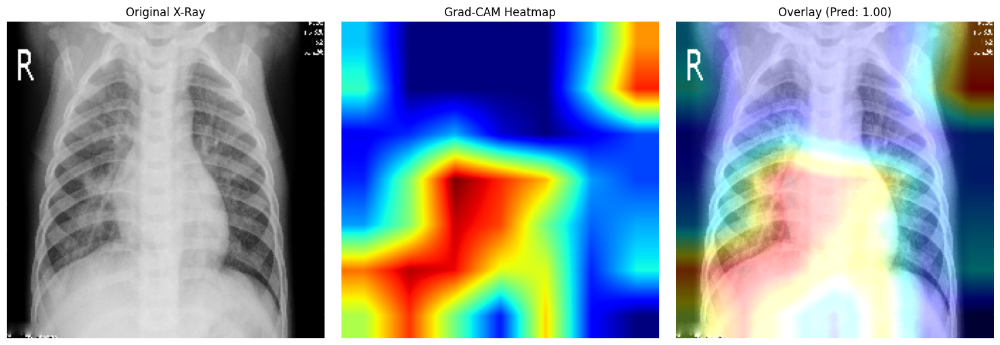

In [ ]:
sample_img_name = os.listdir(sample_dir)[0]
sample_img_path = os.path.join(sample_dir, sample_img_name)

original, heatmap, overlay, pred_prob = overlay_gradcam(sample_img_path, model)

print(f"Predicted Probability (Pneumonia): {pred_prob:.4f}")
print(f"Predicted Class (threshold=0.72): {'PNEUMONIA' if pred_prob >= 0.72 else 'NORMAL'}")

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(original.astype('uint8'))
axes[0].set_title("Original X-Ray")
axes[0].axis('off')

axes[1].imshow(heatmap, cmap='jet')
axes[1].set_title("Grad-CAM Heatmap")
axes[1].axis('off')

axes[2].imshow(overlay)
axes[2].set_title(f"Overlay (Pred: {pred_prob:.2f})")
axes[2].axis('off')

plt.tight_layout()
plt.savefig(f'{project_folder}/gradcam_sample.png', dpi=150)
plt.show()

In [ ]:
def annotate_peak_activation(original_img, heatmap, pred_prob, img_size=224):
    """
    Heatmap ke sabse high-activation point (peak) par yellow circle aur arrow
    draw karta hai, aur prediction percentage bhi likhta hai.
    """
    # Original image ko copy karein (draw karne ke liye)
    annotated = original_img.copy().astype(np.uint8)
    annotated = cv2.cvtColor(annotated, cv2.COLOR_RGB2BGR)  # OpenCV BGR use karta hai

    # Heatmap mein sabse zyada activation wala point (peak) dhoondein
    max_loc = np.unravel_index(np.argmax(heatmap), heatmap.shape)
    peak_y, peak_x = max_loc  # row, col

    # Circle ki radius (heatmap ke "hot zone" ke size ke hisaab se, approx)
    radius = 25

    # Yellow circle draw karein peak activation par
    cv2.circle(annotated, (peak_x, peak_y), radius, (0, 255, 255), 3)  # yellow, thickness=3

    # Arrow draw karein (thoda upar-left se peak ki taraf pointing)
    arrow_start = (max(peak_x - 60, 10), max(peak_y - 60, 10))
    cv2.arrowedLine(annotated, arrow_start, (peak_x + int(radius*0.7), peak_y - int(radius*0.7)),
                     (0, 255, 255), 2, tipLength=0.3)

    # Prediction label likhein (top par, background box ke sath taake readable ho)
    label = f"PNEUMONIA: {pred_prob*100:.1f}%" if pred_prob >= 0.72 else f"NORMAL: {(1-pred_prob)*100:.1f}%"
    label_color = (0, 0, 255) if pred_prob >= 0.72 else (0, 200, 0)  # red for pneumonia, green for normal

    (text_w, text_h), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.8, 2)
    cv2.rectangle(annotated, (5, 5), (15 + text_w, 15 + text_h + 10), (255, 255, 255), -1)
    cv2.putText(annotated, label, (10, 15 + text_h), cv2.FONT_HERSHEY_SIMPLEX, 0.8, label_color, 2)

    annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)  # wapas RGB
    return annotated

print("✅ Annotation function ready")

✅ Annotation function ready


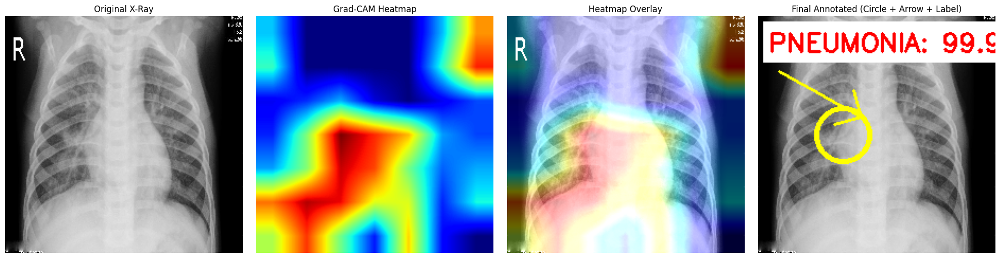

In [ ]:
annotated_img = annotate_peak_activation(original, heatmap, pred_prob)

fig, axes = plt.subplots(1, 4, figsize=(20, 5))
axes[0].imshow(original.astype('uint8'))
axes[0].set_title("Original X-Ray")
axes[0].axis('off')

axes[1].imshow(heatmap, cmap='jet')
axes[1].set_title("Grad-CAM Heatmap")
axes[1].axis('off')

axes[2].imshow(overlay)
axes[2].set_title("Heatmap Overlay")
axes[2].axis('off')

axes[3].imshow(annotated_img)
axes[3].set_title("Final Annotated (Circle + Arrow + Label)")
axes[3].axis('off')

plt.tight_layout()
plt.savefig(f'{project_folder}/gradcam_annotated_sample.png', dpi=150)
plt.show()

In [ ]:
radius = 25

In [ ]:
def annotate_peak_activation(original_img, heatmap, pred_prob, img_size=224, threshold_percentile=85):
    annotated = original_img.copy().astype(np.uint8)
    annotated = cv2.cvtColor(annotated, cv2.COLOR_RGB2BGR)
    max_loc = np.unravel_index(np.argmax(heatmap), heatmap.shape)
    peak_y, peak_x = max_loc
    threshold_val = np.percentile(heatmap, threshold_percentile)
    hot_mask = (heatmap >= threshold_val).astype(np.uint8)
    contours, _ = cv2.findContours(hot_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if len(contours) > 0:
        largest_contour = max(contours, key=cv2.contourArea)
        rect = cv2.boundingRect(largest_contour)
        w = rect[2]
        h = rect[3]
        radius = max(int(max(w, h) / 2), 15)
    else:
        radius = 25
    cv2.circle(annotated, (peak_x, peak_y), radius, (0, 255, 255), 3)
    arrow_start_x = max(peak_x - radius*2, 10)
    arrow_start_y = max(peak_y - radius*2, 10)
    arrow_end_x = peak_x + int(radius*0.7)
    arrow_end_y = peak_y - int(radius*0.7)
    cv2.arrowedLine(annotated, (arrow_start_x, arrow_start_y), (arrow_end_x, arrow_end_y), (0, 255, 255), 2, tipLength=0.3)
    if pred_prob >= 0.72:
        label = "PNEUMONIA: " + str(round(pred_prob*100, 1)) + "%"
        label_color = (0, 0, 255)
    else:
        label = "NORMAL: " + str(round((1-pred_prob)*100, 1)) + "%"
        label_color = (0, 200, 0)
    text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.8, 2)
    text_w = text_size[0][0]
    text_h = text_size[0][1]
    box_end_x = 15 + text_w
    box_end_y = 15 + text_h + 10
    cv2.rectangle(annotated, (5, 5), (box_end_x, box_end_y), (255, 255, 255), -1)
    cv2.putText(annotated, label, (10, 15 + text_h), cv2.FONT_HERSHEY_SIMPLEX, 0.8, label_color, 2)
    annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
    return annotated

print("Function ready")

Function ready


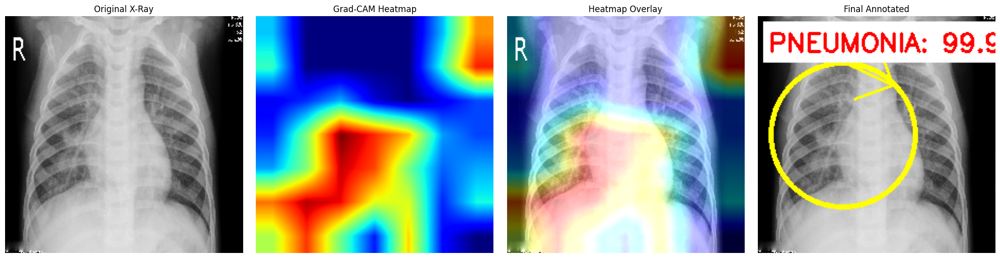

In [ ]:
annotated_img = annotate_peak_activation(original, heatmap, pred_prob)

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(original.astype('uint8'))
axes[0].set_title("Original X-Ray")
axes[0].axis('off')

axes[1].imshow(heatmap, cmap='jet')
axes[1].set_title("Grad-CAM Heatmap")
axes[1].axis('off')

axes[2].imshow(overlay)
axes[2].set_title("Heatmap Overlay")
axes[2].axis('off')

axes[3].imshow(annotated_img)
axes[3].set_title("Final Annotated")
axes[3].axis('off')

plt.tight_layout()
plt.savefig(f'{project_folder}/gradcam_annotated_sample.png', dpi=150)
plt.show()

In [ ]:
def annotate_and_analyze(original_img, heatmap, pred_prob, threshold=0.72, hot_percentile=85):
    annotated = original_img.copy().astype(np.uint8)
    annotated = cv2.cvtColor(annotated, cv2.COLOR_RGB2BGR)

    # Peak activation point
    max_loc = np.unravel_index(np.argmax(heatmap), heatmap.shape)
    peak_y, peak_x = max_loc

    # Hot zone mask (for circle size AND area percentage)
    threshold_val = np.percentile(heatmap, hot_percentile)
    hot_mask = (heatmap >= threshold_val).astype(np.uint8)
    contours, _ = cv2.findContours(hot_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if len(contours) > 0:
        largest_contour = max(contours, key=cv2.contourArea)
        rect = cv2.boundingRect(largest_contour)
        w = rect[2]
        h = rect[3]
        radius = max(int(max(w, h) / 2), 15)
    else:
        radius = 25

    # Affected area percentage (hot zone pixels / total image pixels)
    total_pixels = heatmap.shape[0] * heatmap.shape[1]
    affected_pixels = int(np.sum(hot_mask))
    affected_percent = round((affected_pixels / total_pixels) * 100, 2)

    # Draw small circle (thinner, smaller)
    cv2.circle(annotated, (peak_x, peak_y), radius, (0, 255, 255), 2)

    # Small arrow
    arrow_start_x = max(peak_x - radius*2, 10)
    arrow_start_y = max(peak_y - radius*2, 10)
    arrow_end_x = peak_x + int(radius*0.6)
    arrow_end_y = peak_y - int(radius*0.6)
    cv2.arrowedLine(annotated, (arrow_start_x, arrow_start_y), (arrow_end_x, arrow_end_y), (0, 255, 255), 1, tipLength=0.3)

    # SMALL label (much smaller font, fits inside image, doesn't cover)
    if pred_prob >= threshold:
        label = "PNEUMONIA " + str(round(pred_prob*100, 1)) + "%"
        label_color = (0, 0, 255)
    else:
        label = "NORMAL " + str(round((1-pred_prob)*100, 1)) + "%"
        label_color = (0, 200, 0)

    font_scale = 0.45
    thickness = 1
    text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)
    text_w = text_size[0][0]
    text_h = text_size[0][1]
    box_end_x = 8 + text_w + 6
    box_end_y = 8 + text_h + 6
    cv2.rectangle(annotated, (3, 3), (box_end_x, box_end_y), (255, 255, 255), -1)
    cv2.putText(annotated, label, (6, 6 + text_h), cv2.FONT_HERSHEY_SIMPLEX, font_scale, label_color, thickness)

    annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)

    return annotated, affected_percent

print("Function ready")

Function ready


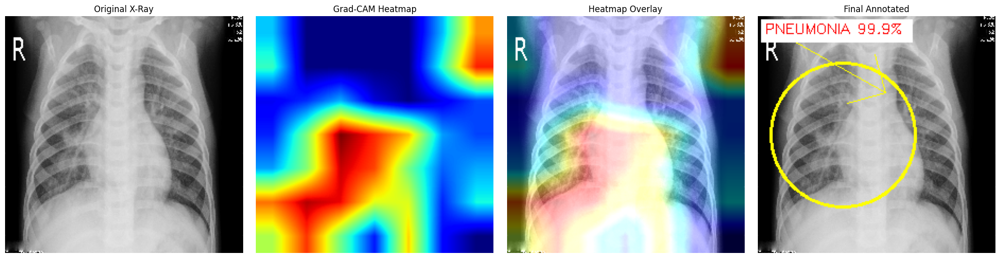

DIAGNOSIS SUMMARY
Prediction: PNEUMONIA
Confidence: 99.93%
Affected Lung Area: 15.0% of the scanned region
Estimated Severity: Moderate
------------------------------------------------------------
Explanation: The model identified an opacity region covering
approximately 15.0% of the visible lung area,
located at the point marked by the yellow circle and arrow.
Based on this affected area, the case is classified as 'Moderate'.


In [ ]:
annotated_img, affected_percent = annotate_and_analyze(original, heatmap, pred_prob)

# Severity classify (simple version, Module 8 mein aur detailed karenge)
if affected_percent < 10:
    severity = "Mild"
elif affected_percent < 25:
    severity = "Moderate"
else:
    severity = "Severe"

fig, axes = plt.subplots(1, 4, figsize=(20, 5))
axes[0].imshow(original.astype('uint8')); axes[0].set_title("Original X-Ray"); axes[0].axis('off')
axes[1].imshow(heatmap, cmap='jet'); axes[1].set_title("Grad-CAM Heatmap"); axes[1].axis('off')
axes[2].imshow(overlay); axes[2].set_title("Heatmap Overlay"); axes[2].axis('off')
axes[3].imshow(annotated_img); axes[3].set_title("Final Annotated"); axes[3].axis('off')
plt.tight_layout()
plt.savefig(f'{project_folder}/gradcam_annotated_sample.png', dpi=150)
plt.show()

# Explanation printed BELOW the image, in English
print("="*60)
print("DIAGNOSIS SUMMARY")
print("="*60)
print(f"Prediction: {'PNEUMONIA' if pred_prob >= 0.72 else 'NORMAL'}")
print(f"Confidence: {pred_prob*100:.2f}%")
print(f"Affected Lung Area: {affected_percent}% of the scanned region")
print(f"Estimated Severity: {severity}")
print("-"*60)
print(f"Explanation: The model identified an opacity region covering")
print(f"approximately {affected_percent}% of the visible lung area,")
print(f"located at the point marked by the yellow circle and arrow.")
print(f"Based on this affected area, the case is classified as '{severity}'.")
print("="*60)

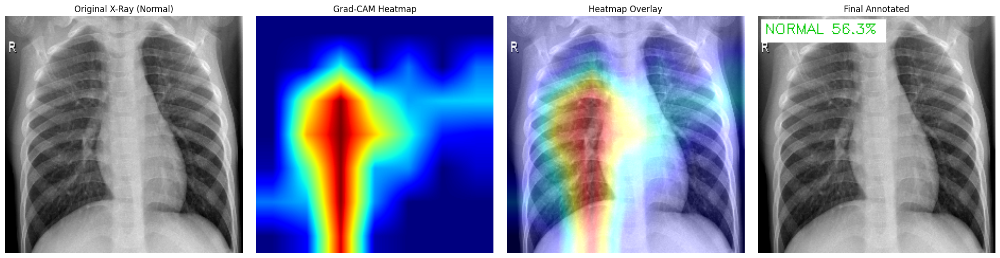

DIAGNOSIS SUMMARY
Prediction: NORMAL
Confidence: 56.26%
Affected Lung Area: 0.0% of the scanned region
Estimated Severity: N/A (Normal)


In [ ]:
sample_dir_normal = "/content/data/chest_xray/test/NORMAL"
sample_img_name_normal = os.listdir(sample_dir_normal)[0]
sample_img_path_normal = os.path.join(sample_dir_normal, sample_img_name_normal)

original_n, heatmap_n, overlay_n, pred_prob_n = overlay_gradcam(sample_img_path_normal, model)
annotated_img_n, affected_percent_n = annotate_and_analyze(original_n, heatmap_n, pred_prob_n)

if affected_percent_n < 10:
    severity_n = "Mild"
elif affected_percent_n < 25:
    severity_n = "Moderate"
else:
    severity_n = "Severe"

fig, axes = plt.subplots(1, 4, figsize=(20, 5))
axes[0].imshow(original_n.astype('uint8')); axes[0].set_title("Original X-Ray (Normal)"); axes[0].axis('off')
axes[1].imshow(heatmap_n, cmap='jet'); axes[1].set_title("Grad-CAM Heatmap"); axes[1].axis('off')
axes[2].imshow(overlay_n); axes[2].set_title("Heatmap Overlay"); axes[2].axis('off')
axes[3].imshow(annotated_img_n); axes[3].set_title("Final Annotated"); axes[3].axis('off')
plt.tight_layout()
plt.show()

print("="*60)
print("DIAGNOSIS SUMMARY")
print("="*60)
print(f"Prediction: {'PNEUMONIA' if pred_prob_n >= 0.72 else 'NORMAL'}")
print(f"Confidence: {(pred_prob_n if pred_prob_n>=0.72 else 1-pred_prob_n)*100:.2f}%")
print(f"Affected Lung Area: {affected_percent_n}% of the scanned region")
print(f"Estimated Severity: {severity_n if pred_prob_n >= 0.72 else 'N/A (Normal)'}")
print("="*60)

In [ ]:
import tensorflow as tf
print("GPU Available:", tf.config.list_physical_devices('GPU'))

GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
try:
    model.summary()
    print("✅ Model already loaded — purana session hai, seedha aage badh sakte hain")
except NameError:
    print("❌ Model load nahi hai — pehle setup cells run karne honge")

❌ Model load nahi hai — pehle setup cells run karne honge


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os
project_folder = '/content/drive/MyDrive/FYP_Pneumonia_XAI'
print("Ready:", project_folder)

Mounted at /content/drive
Ready: /content/drive/MyDrive/FYP_Pneumonia_XAI


In [ ]:
!unzip -q /content/drive/MyDrive/FYP_Pneumonia_XAI/chest-xray-pneumonia.zip -d /content/data
print("Dataset extracted")

Dataset extracted


In [ ]:
from tensorflow.keras.models import load_model
model = load_model(f'{project_folder}/pneumonia_densenet121_final.keras')
print("✅ Model loaded")

✅ Model loaded


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

CALIBRATED_THRESHOLD = 0.72
IMG_SIZE = 224
print("✅ Setup complete — ready for Module 6")

✅ Setup complete — ready for Module 6


In [ ]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name="conv5_block16_concat", pred_index=None):
    grad_model = tf.keras.models.Model(
        inputs=model.inputs,
        outputs=[model.get_layer(last_conv_layer_name).output, model.output]
    )
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = 0
        class_channel = predictions[:, pred_index]
    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-10)
    return heatmap.numpy(), predictions.numpy()[0][0]

def overlay_gradcam(img_path, model, last_conv_layer_name="conv5_block16_concat", img_size=224, alpha=0.4):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(img_size, img_size))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array_norm = np.expand_dims(img_array, axis=0) / 255.0
    heatmap, pred_prob = make_gradcam_heatmap(img_array_norm, model, last_conv_layer_name)
    heatmap_resized = cv2.resize(heatmap, (img_size, img_size))
    heatmap_uint8 = np.uint8(255 * heatmap_resized)
    heatmap_colored = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
    superimposed_img = heatmap_colored * alpha + img_array
    superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)
    return img_array.astype(np.uint8), heatmap_resized, superimposed_img, pred_prob

print("✅ Grad-CAM functions ready")

✅ Grad-CAM functions ready


In [ ]:
def detect_laterality(heatmap, hot_percentile=85, dominant_threshold=0.70):
    """
    Heatmap ko left/right half mein split karke detect karta hai
    Pneumonia Unilateral (Left/Right) hai ya Bilateral (dono taraf).

    Note: Image ka LEFT side = Patient ka RIGHT lung (radiology convention)
          Image ka RIGHT side = Patient ka LEFT lung
    """
    h, w = heatmap.shape

    # Hot zone mask banayein (high activation wale pixels)
    threshold_val = np.percentile(heatmap, hot_percentile)
    hot_mask = (heatmap >= threshold_val).astype(np.uint8)

    # Image ko do halves mein split karein
    mid = w // 2
    left_half_hot = np.sum(hot_mask[:, :mid])   # image-left = patient's RIGHT lung
    right_half_hot = np.sum(hot_mask[:, mid:])  # image-right = patient's LEFT lung

    total_hot = left_half_hot + right_half_hot

    if total_hot == 0:
        return {
            "laterality": "N/A",
            "patient_right_involvement_pct": 0.0,
            "patient_left_involvement_pct": 0.0
        }

    # Percentage nikalein
    image_left_pct = left_half_hot / total_hot   # patient's RIGHT lung involvement
    image_right_pct = right_half_hot / total_hot # patient's LEFT lung involvement

    # Decision logic
    if image_left_pct >= dominant_threshold:
        laterality = "Unilateral - Patient's RIGHT Lung"
    elif image_right_pct >= dominant_threshold:
        laterality = "Unilateral - Patient's LEFT Lung"
    else:
        laterality = "Bilateral (Both Lungs)"

    return {
        "laterality": laterality,
        "patient_right_involvement_pct": round(image_left_pct * 100, 1),
        "patient_left_involvement_pct": round(image_right_pct * 100, 1)
    }

print("✅ Laterality detection function ready")

✅ Laterality detection function ready


/usr/local/lib/python3.13/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


LATERALITY ANALYSIS
Prediction: PNEUMONIA (99.72%)
Laterality: Bilateral (Both Lungs)
Patient's Right Lung Involvement: 63.4%
Patient's Left Lung Involvement: 36.6%


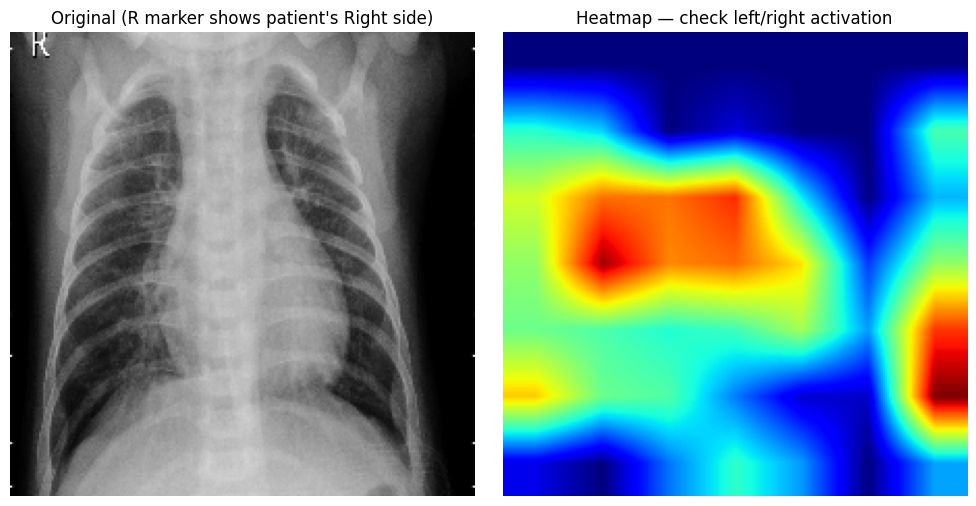

In [ ]:
import os

sample_dir = "/content/data/chest_xray/test/PNEUMONIA"
sample_img_name = os.listdir(sample_dir)[0]
sample_img_path = os.path.join(sample_dir, sample_img_name)

original, heatmap, overlay, pred_prob = overlay_gradcam(sample_img_path, model)

# Sirf Pneumonia predict hone par laterality detect karein
if pred_prob >= CALIBRATED_THRESHOLD:
    lat_result = detect_laterality(heatmap)
    print("="*60)
    print("LATERALITY ANALYSIS")
    print("="*60)
    print(f"Prediction: PNEUMONIA ({pred_prob*100:.2f}%)")
    print(f"Laterality: {lat_result['laterality']}")
    print(f"Patient's Right Lung Involvement: {lat_result['patient_right_involvement_pct']}%")
    print(f"Patient's Left Lung Involvement: {lat_result['patient_left_involvement_pct']}%")
    print("="*60)
else:
    print("Prediction: NORMAL — Laterality analysis not applicable")

# Visual check
fig, axes = plt.subplots(1, 2, figsize=(10,5))
axes[0].imshow(original.astype('uint8'))
axes[0].set_title("Original (R marker shows patient's Right side)")
axes[0].axis('off')
axes[1].imshow(heatmap, cmap='jet')
axes[1].set_title("Heatmap — check left/right activation")
axes[1].axis('off')
plt.tight_layout()
plt.show()

In [ ]:
def annotate_and_analyze(original_img, heatmap, pred_prob, threshold=0.72, hot_percentile=85):
    annotated = original_img.copy().astype(np.uint8)
    annotated = cv2.cvtColor(annotated, cv2.COLOR_RGB2BGR)

    is_pneumonia = pred_prob >= threshold
    affected_percent = 0.0

    if is_pneumonia:
        max_loc = np.unravel_index(np.argmax(heatmap), heatmap.shape)
        peak_y, peak_x = max_loc

        threshold_val = np.percentile(heatmap, hot_percentile)
        hot_mask = (heatmap >= threshold_val).astype(np.uint8)
        contours, _ = cv2.findContours(hot_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if len(contours) > 0:
            largest_contour = max(contours, key=cv2.contourArea)
            rect = cv2.boundingRect(largest_contour)
            w = rect[2]
            h = rect[3]
            radius = max(int(max(w, h) / 2), 15)
        else:
            radius = 25

        total_pixels = heatmap.shape[0] * heatmap.shape[1]
        affected_pixels = int(np.sum(hot_mask))
        affected_percent = round((affected_pixels / total_pixels) * 100, 2)

        cv2.circle(annotated, (peak_x, peak_y), radius, (0, 255, 255), 2)

        arrow_start_x = max(peak_x - radius*2, 10)
        arrow_start_y = max(peak_y - radius*2, 10)
        arrow_end_x = peak_x + int(radius*0.6)
        arrow_end_y = peak_y - int(radius*0.6)
        cv2.arrowedLine(annotated, (arrow_start_x, arrow_start_y), (arrow_end_x, arrow_end_y), (0, 255, 255), 1, tipLength=0.3)

    if is_pneumonia:
        label = "PNEUMONIA " + str(round(pred_prob*100, 1)) + "%"
        label_color = (0, 0, 255)
    else:
        label = "NORMAL " + str(round((1-pred_prob)*100, 1)) + "%"
        label_color = (0, 200, 0)

    font_scale = 0.45
    thickness = 1
    text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)
    text_w = text_size[0][0]
    text_h = text_size[0][1]
    box_end_x = 8 + text_w + 6
    box_end_y = 8 + text_h + 6
    cv2.rectangle(annotated, (3, 3), (box_end_x, box_end_y), (255, 255, 255), -1)
    cv2.putText(annotated, label, (6, 6 + text_h), cv2.FONT_HERSHEY_SIMPLEX, font_scale, label_color, thickness)

    annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)

    return annotated, affected_percent

print("✅ Annotation function ready")

✅ Annotation function ready


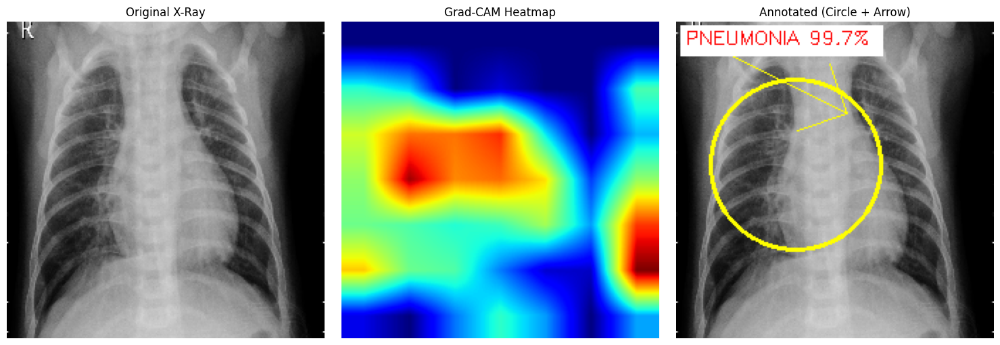

FULL DIAGNOSIS SUMMARY
Prediction: PNEUMONIA
Confidence: 99.72%
Laterality: Bilateral (Both Lungs)
  - Patient's Right Lung: 63.4%
  - Patient's Left Lung: 36.6%
Affected Area: 15.0%
Severity: Moderate


In [ ]:
sample_dir = "/content/data/chest_xray/test/PNEUMONIA"
sample_img_name = os.listdir(sample_dir)[0]
sample_img_path = os.path.join(sample_dir, sample_img_name)

original, heatmap, overlay, pred_prob = overlay_gradcam(sample_img_path, model)
annotated_img, affected_percent = annotate_and_analyze(original, heatmap, pred_prob)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(original.astype('uint8')); axes[0].set_title("Original X-Ray"); axes[0].axis('off')
axes[1].imshow(heatmap, cmap='jet'); axes[1].set_title("Grad-CAM Heatmap"); axes[1].axis('off')
axes[2].imshow(annotated_img); axes[2].set_title("Annotated (Circle + Arrow)"); axes[2].axis('off')
plt.tight_layout()
plt.show()

print("="*60)
print("FULL DIAGNOSIS SUMMARY")
print("="*60)
if pred_prob >= CALIBRATED_THRESHOLD:
    lat_result = detect_laterality(heatmap)
    if affected_percent < 10:
        severity = "Mild"
    elif affected_percent < 25:
        severity = "Moderate"
    else:
        severity = "Severe"

    print(f"Prediction: PNEUMONIA")
    print(f"Confidence: {pred_prob*100:.2f}%")
    print(f"Laterality: {lat_result['laterality']}")
    print(f"  - Patient's Right Lung: {lat_result['patient_right_involvement_pct']}%")
    print(f"  - Patient's Left Lung: {lat_result['patient_left_involvement_pct']}%")
    print(f"Affected Area: {affected_percent}%")
    print(f"Severity: {severity}")
else:
    print(f"Prediction: NORMAL")
    print(f"Confidence: {(1-pred_prob)*100:.2f}%")
print("="*60)

In [ ]:
def annotate_and_analyze(original_img, heatmap, pred_prob, threshold=0.72, hot_percentile=85):
    annotated = original_img.copy().astype(np.uint8)
    annotated = cv2.cvtColor(annotated, cv2.COLOR_RGB2BGR)

    is_pneumonia = pred_prob >= threshold
    affected_percent = 0.0

    if is_pneumonia:
        threshold_val = np.percentile(heatmap, hot_percentile)
        hot_mask = (heatmap >= threshold_val).astype(np.uint8)
        contours, _ = cv2.findContours(hot_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if len(contours) > 0:
            # Sabse BADA region choose karein (area ke hisaab se), sirf brightest pixel nahi
            largest_contour = max(contours, key=cv2.contourArea)
            rect = cv2.boundingRect(largest_contour)
            x, y, w, h = rect

            # Center of that largest region (circle yahan banega)
            peak_x = x + w // 2
            peak_y = y + h // 2

            radius = max(int(max(w, h) / 2), 15)

            # Circle image ke andar hi rahe (edges se thoda margin)
            img_h, img_w = heatmap.shape
            peak_x = min(max(peak_x, radius + 5), img_w - radius - 5)
            peak_y = min(max(peak_y, radius + 5), img_h - radius - 5)
        else:
            peak_x, peak_y, radius = heatmap.shape[1]//2, heatmap.shape[0]//2, 25

        total_pixels = heatmap.shape[0] * heatmap.shape[1]
        affected_pixels = int(np.sum(hot_mask))
        affected_percent = round((affected_pixels / total_pixels) * 100, 2)

        cv2.circle(annotated, (peak_x, peak_y), radius, (0, 255, 255), 2)

        arrow_start_x = max(peak_x - radius*2, 10)
        arrow_start_y = max(peak_y - radius*2, 10)
        arrow_end_x = peak_x + int(radius*0.6)
        arrow_end_y = peak_y - int(radius*0.6)
        cv2.arrowedLine(annotated, (arrow_start_x, arrow_start_y), (arrow_end_x, arrow_end_y), (0, 255, 255), 1, tipLength=0.3)

    if is_pneumonia:
        label = "PNEUMONIA " + str(round(pred_prob*100, 1)) + "%"
        label_color = (0, 0, 255)
    else:
        label = "NORMAL " + str(round((1-pred_prob)*100, 1)) + "%"
        label_color = (0, 200, 0)

    font_scale = 0.45
    thickness = 1
    text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)
    text_w = text_size[0][0]
    text_h = text_size[0][1]
    box_end_x = 8 + text_w + 6
    box_end_y = 8 + text_h + 6
    cv2.rectangle(annotated, (3, 3), (box_end_x, box_end_y), (255, 255, 255), -1)
    cv2.putText(annotated, label, (6, 6 + text_h), cv2.FONT_HERSHEY_SIMPLEX, font_scale, label_color, thickness)

    annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)

    return annotated, affected_percent

print("✅ Fixed annotation function ready")

✅ Fixed annotation function ready


In [ ]:
def annotate_and_analyze(original_img, heatmap, pred_prob, threshold=0.72, hot_percentile=85, min_area_pct=2.0):
    annotated = original_img.copy().astype(np.uint8)
    annotated = cv2.cvtColor(annotated, cv2.COLOR_RGB2BGR)

    is_pneumonia = pred_prob >= threshold
    affected_percent = 0.0
    regions_info = []

    if is_pneumonia:
        threshold_val = np.percentile(heatmap, hot_percentile)
        hot_mask = (heatmap >= threshold_val).astype(np.uint8)
        contours, _ = cv2.findContours(hot_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        total_pixels = heatmap.shape[0] * heatmap.shape[1]
        img_h, img_w = heatmap.shape

        # Saare significant regions dhoondein (chhote noise wale ignore karein)
        valid_regions = []
        for c in contours:
            area = cv2.contourArea(c)
            area_pct = (area / total_pixels) * 100
            if area_pct >= min_area_pct:  # sirf meaningful size wale regions
                valid_regions.append((c, area))

        # Agar koi valid region na mile, sabse bada wala hi le lein
        if len(valid_regions) == 0 and len(contours) > 0:
            largest = max(contours, key=cv2.contourArea)
            valid_regions = [(largest, cv2.contourArea(largest))]

        # Sort by area (bada pehle)
        valid_regions.sort(key=lambda x: x[1], reverse=True)

        # Max 2 circles (Left + Right lung ke liye) — bohot zyada clutter na ho
        valid_regions = valid_regions[:2]

        for contour, area in valid_regions:
            rect = cv2.boundingRect(contour)
            x, y, w, h = rect
            peak_x = x + w // 2
            peak_y = y + h // 2
            radius = max(int(max(w, h) / 2), 12)

            # Circle image ke andar rahe
            peak_x = min(max(peak_x, radius + 5), img_w - radius - 5)
            peak_y = min(max(peak_y, radius + 5), img_h - radius - 5)

            regions_info.append({"x": peak_x, "y": peak_y, "radius": radius, "area_pct": round((area/total_pixels)*100, 2)})

            # Circle draw
            cv2.circle(annotated, (peak_x, peak_y), radius, (0, 255, 255), 2)

            # Arrow (chhota, har circle ki taraf pointing)
            arrow_start_x = max(peak_x - radius - 15, 5)
            arrow_start_y = max(peak_y - radius - 15, 5)
            arrow_end_x = peak_x
            arrow_end_y = peak_y - int(radius*0.5)
            cv2.arrowedLine(annotated, (arrow_start_x, arrow_start_y), (arrow_end_x, arrow_end_y), (0, 255, 255), 1, tipLength=0.3)

        affected_pixels = int(np.sum(hot_mask))
        affected_percent = round((affected_pixels / total_pixels) * 100, 2)

    if is_pneumonia:
        label = "PNEUMONIA " + str(round(pred_prob*100, 1)) + "%"
        label_color = (0, 0, 255)
    else:
        label = "NORMAL " + str(round((1-pred_prob)*100, 1)) + "%"
        label_color = (0, 200, 0)

    font_scale = 0.45
    thickness = 1
    text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)
    text_w = text_size[0][0]
    text_h = text_size[0][1]
    box_end_x = 8 + text_w + 6
    box_end_y = 8 + text_h + 6
    cv2.rectangle(annotated, (3, 3), (box_end_x, box_end_y), (255, 255, 255), -1)
    cv2.putText(annotated, label, (6, 6 + text_h), cv2.FONT_HERSHEY_SIMPLEX, font_scale, label_color, thickness)

    annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)

    return annotated, affected_percent, regions_info

print("✅ Multi-circle annotation function ready")

✅ Multi-circle annotation function ready


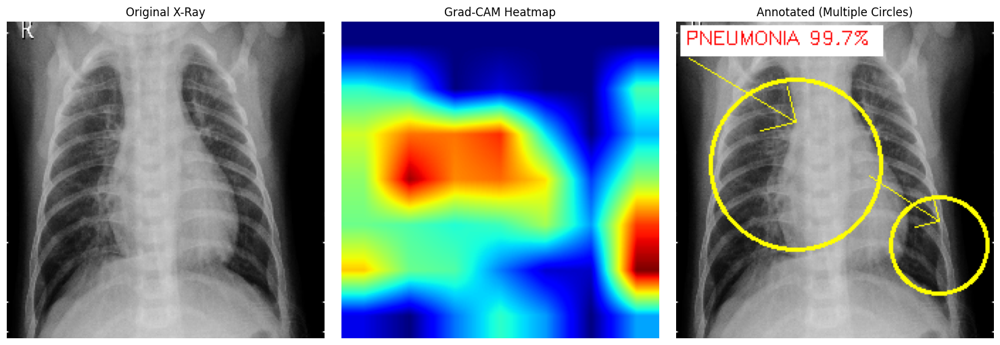

Detected regions: [{'x': 84, 'y': 101, 'radius': 60, 'area_pct': 10.91}, {'x': 185, 'y': 158, 'radius': 34, 'area_pct': 3.24}]


In [ ]:
sample_dir = "/content/data/chest_xray/test/PNEUMONIA"
sample_img_name = os.listdir(sample_dir)[0]
sample_img_path = os.path.join(sample_dir, sample_img_name)

original, heatmap, overlay, pred_prob = overlay_gradcam(sample_img_path, model)
annotated_img, affected_percent, regions_info = annotate_and_analyze(original, heatmap, pred_prob)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(original.astype('uint8')); axes[0].set_title("Original X-Ray"); axes[0].axis('off')
axes[1].imshow(heatmap, cmap='jet'); axes[1].set_title("Grad-CAM Heatmap"); axes[1].axis('off')
axes[2].imshow(annotated_img); axes[2].set_title("Annotated (Multiple Circles)"); axes[2].axis('off')
plt.tight_layout()
plt.show()

print("Detected regions:", regions_info)

In [ ]:
def annotate_and_analyze(original_img, heatmap, pred_prob, threshold=0.72, hot_percentile=85, min_area_pct=2.0):
    annotated = original_img.copy().astype(np.uint8)
    annotated = cv2.cvtColor(annotated, cv2.COLOR_RGB2BGR)
    img_h, img_w = heatmap.shape

    is_pneumonia = pred_prob >= threshold
    affected_percent = 0.0
    regions_info = []

    if is_pneumonia:
        threshold_val = np.percentile(heatmap, hot_percentile)
        hot_mask = (heatmap >= threshold_val).astype(np.uint8)
        contours, _ = cv2.findContours(hot_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        total_pixels = img_h * img_w

        valid_regions = []
        for c in contours:
            area = cv2.contourArea(c)
            area_pct = (area / total_pixels) * 100
            if area_pct >= min_area_pct:
                valid_regions.append((c, area))

        if len(valid_regions) == 0 and len(contours) > 0:
            largest = max(contours, key=cv2.contourArea)
            valid_regions = [(largest, cv2.contourArea(largest))]

        valid_regions.sort(key=lambda x: x[1], reverse=True)
        valid_regions = valid_regions[:2]  # max 2 circles

        for contour, area in valid_regions:
            x, y, w, h = cv2.boundingRect(contour)
            peak_x = x + w // 2
            peak_y = y + h // 2

            # Radius ko image size ke hisaab se cap karein (bohot bada na ho)
            radius = int(max(w, h) / 2)
            radius = max(radius, 10)                    # minimum size
            radius = min(radius, int(min(img_h, img_w) * 0.22))  # maximum size (22% of image)

            # SAFE clamping — circle hamesha poori tarah image ke andar rahe
            margin = radius + 6
            top_margin = max(margin, 35)  # top par thoda extra space (label ke liye)
            peak_x = int(np.clip(peak_x, margin, img_w - margin))
            peak_y = int(np.clip(peak_y, top_margin, img_h - margin))

            # Left ya Right lung (image-based, patient-side conversion)
            side = "Patient's RIGHT Lung" if peak_x < img_w // 2 else "Patient's LEFT Lung"

            regions_info.append({
                "x": peak_x, "y": peak_y, "radius": radius,
                "area_pct": round((area/total_pixels)*100, 2),
                "side": side
            })

            cv2.circle(annotated, (peak_x, peak_y), radius, (0, 255, 255), 2)

        affected_pixels = int(np.sum(hot_mask))
        affected_percent = round((affected_pixels / total_pixels) * 100, 2)

    # Label
    if is_pneumonia:
        label = "PNEUMONIA " + str(round(pred_prob*100, 1)) + "%"
        label_color = (0, 0, 255)
    else:
        label = "NORMAL " + str(round((1-pred_prob)*100, 1)) + "%"
        label_color = (0, 200, 0)

    font_scale = 0.45
    thickness = 1
    text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)
    text_w, text_h = text_size[0]
    cv2.rectangle(annotated, (3, 3), (8 + text_w + 6, 8 + text_h + 6), (255, 255, 255), -1)
    cv2.putText(annotated, label, (6, 6 + text_h), cv2.FONT_HERSHEY_SIMPLEX, font_scale, label_color, thickness)

    annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
    return annotated, affected_percent, regions_info

print("✅ Border-safe annotation function ready")

✅ Border-safe annotation function ready


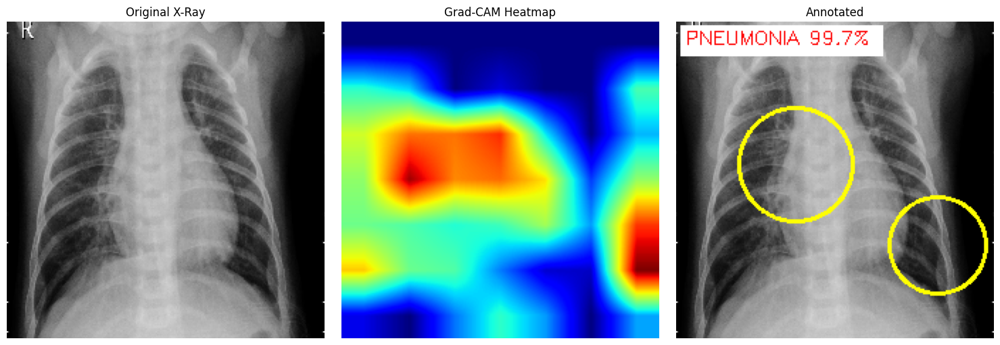

DIAGNOSIS SUMMARY
Prediction         : PNEUMONIA
Confidence          : 99.72%
Laterality          : Bilateral (Both Lungs)
Total Affected Area : 15.0%
Severity            : Moderate
------------------------------------------------------------
Detected Opacity Regions:
  Region 1: Patient's RIGHT Lung — covers 10.91% of scan area
  Region 2: Patient's LEFT Lung — covers 3.24% of scan area


In [ ]:
sample_dir = "/content/data/chest_xray/test/PNEUMONIA"
sample_img_name = os.listdir(sample_dir)[0]
sample_img_path = os.path.join(sample_dir, sample_img_name)

original, heatmap, overlay, pred_prob = overlay_gradcam(sample_img_path, model)
annotated_img, affected_percent, regions_info = annotate_and_analyze(original, heatmap, pred_prob)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(original.astype('uint8')); axes[0].set_title("Original X-Ray"); axes[0].axis('off')
axes[1].imshow(heatmap, cmap='jet'); axes[1].set_title("Grad-CAM Heatmap"); axes[1].axis('off')
axes[2].imshow(annotated_img); axes[2].set_title("Annotated"); axes[2].axis('off')
plt.tight_layout()
plt.show()

# Clean, readable explanation
print("="*60)
print("DIAGNOSIS SUMMARY")
print("="*60)
if pred_prob >= CALIBRATED_THRESHOLD:
    lat_result = detect_laterality(heatmap)
    if affected_percent < 10:
        severity = "Mild"
    elif affected_percent < 25:
        severity = "Moderate"
    else:
        severity = "Severe"

    print(f"Prediction         : PNEUMONIA")
    print(f"Confidence          : {pred_prob*100:.2f}%")
    print(f"Laterality          : {lat_result['laterality']}")
    print(f"Total Affected Area : {affected_percent}%")
    print(f"Severity            : {severity}")
    print("-"*60)
    print("Detected Opacity Regions:")
    for i, r in enumerate(regions_info, 1):
        print(f"  Region {i}: {r['side']} — covers {r['area_pct']}% of scan area")
else:
    print(f"Prediction : NORMAL")
    print(f"Confidence : {(1-pred_prob)*100:.2f}%")
print("="*60)

In [ ]:
def annotate_and_analyze(original_img, heatmap, pred_prob, threshold=0.72, hot_percentile=85, min_area_pct=2.0):
    annotated = original_img.copy().astype(np.uint8)
    annotated = cv2.cvtColor(annotated, cv2.COLOR_RGB2BGR)
    img_h, img_w = heatmap.shape

    is_pneumonia = pred_prob >= threshold
    affected_percent = 0.0
    regions_info = []

    if is_pneumonia:
        threshold_val = np.percentile(heatmap, hot_percentile)
        hot_mask = (heatmap >= threshold_val).astype(np.uint8)
        contours, _ = cv2.findContours(hot_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        total_pixels = img_h * img_w

        valid_regions = []
        for c in contours:
            area = cv2.contourArea(c)
            area_pct = (area / total_pixels) * 100
            if area_pct >= min_area_pct:
                valid_regions.append((c, area))

        if len(valid_regions) == 0 and len(contours) > 0:
            largest = max(contours, key=cv2.contourArea)
            valid_regions = [(largest, cv2.contourArea(largest))]

        valid_regions.sort(key=lambda x: x[1], reverse=True)
        valid_regions = valid_regions[:2]

        # Pehle saari circles ki properties calculate karein
        circles = []
        for contour, area in valid_regions:
            x, y, w, h = cv2.boundingRect(contour)
            peak_x = x + w // 2
            peak_y = y + h // 2
            radius = int(max(w, h) / 2)
            radius = max(radius, 10)
            radius = min(radius, int(min(img_h, img_w) * 0.18))  # thoda aur chhota cap (18%)
            circles.append({"x": peak_x, "y": peak_y, "radius": radius, "area": area})

        # Agar 2 circles hain aur woh overlap kar rahe hain, unko chhota kar dein
        if len(circles) == 2:
            dist = np.sqrt((circles[0]["x"]-circles[1]["x"])**2 + (circles[0]["y"]-circles[1]["y"])**2)
            sum_radii = circles[0]["radius"] + circles[1]["radius"]
            if dist < sum_radii:  # overlap ho raha hai
                # Dono radius proportionally shrink karein taake overlap na ho
                scale = (dist - 5) / sum_radii if sum_radii > 0 else 1
                scale = max(scale, 0.3)  # bohot chhota na ho jaye
                for c in circles:
                    c["radius"] = max(int(c["radius"] * scale), 10)

        for c in circles:
            peak_x, peak_y, radius = c["x"], c["y"], c["radius"]
            margin = radius + 6
            top_margin = max(margin, 35)
            peak_x = int(np.clip(peak_x, margin, img_w - margin))
            peak_y = int(np.clip(peak_y, top_margin, img_h - margin))

            side = "Patient's RIGHT Lung" if peak_x < img_w // 2 else "Patient's LEFT Lung"
            regions_info.append({
                "x": peak_x, "y": peak_y, "radius": radius,
                "area_pct": round((c["area"]/total_pixels)*100, 2),
                "side": side
            })
            cv2.circle(annotated, (peak_x, peak_y), radius, (0, 255, 255), 2)

        affected_pixels = int(np.sum(hot_mask))
        affected_percent = round((affected_pixels / total_pixels) * 100, 2)

    if is_pneumonia:
        label = "PNEUMONIA " + str(round(pred_prob*100, 1)) + "%"
        label_color = (0, 0, 255)
    else:
        label = "NORMAL " + str(round((1-pred_prob)*100, 1)) + "%"
        label_color = (0, 200, 0)

    font_scale = 0.45
    thickness = 1
    text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)
    text_w, text_h = text_size[0]
    cv2.rectangle(annotated, (3, 3), (8 + text_w + 6, 8 + text_h + 6), (255, 255, 255), -1)
    cv2.putText(annotated, label, (6, 6 + text_h), cv2.FONT_HERSHEY_SIMPLEX, font_scale, label_color, thickness)

    annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
    return annotated, affected_percent, regions_info

print("✅ Overlap-safe annotation function ready")

✅ Overlap-safe annotation function ready


In [ ]:
plt.savefig(f'{project_folder}/gradcam_multicircle_sample.png', dpi=150)
print("✅ Saved")

✅ Saved


<Figure size 640x480 with 0 Axes>

In [ ]:
def calculate_severity(affected_percent, laterality):
    """
    Severity ko affected area % aur laterality dono ke hisaab se calculate karta hai.
    Bilateral cases ko thoda zyada weight milta hai (clinically zyada concerning).
    """
    # Bilateral ko halka sa "boost" dete hain severity scoring mein
    is_bilateral = "Bilateral" in laterality

    if is_bilateral:
        # Bilateral: thresholds thode kam kar dete hain (jaldi Severe/Moderate ban jaye)
        if affected_percent < 8:
            severity = "Mild"
        elif affected_percent < 20:
            severity = "Moderate"
        else:
            severity = "Severe"
        note = "Bilateral involvement noted — clinically monitored more closely even at lower area percentages."
    else:
        # Unilateral: normal thresholds
        if affected_percent < 10:
            severity = "Mild"
        elif affected_percent < 25:
            severity = "Moderate"
        else:
            severity = "Severe"
        note = "Unilateral involvement — localized to one lung."

    return severity, note

print("✅ Severity function ready")

✅ Severity function ready


In [ ]:
def full_diagnosis_report(img_path, model, threshold=0.72):
    """
    Ek image par complete diagnosis pipeline chalata hai:
    Prediction -> Laterality -> Severity -> Annotated Image
    """
    original, heatmap, overlay, pred_prob = overlay_gradcam(img_path, model)
    annotated_img, affected_percent, regions_info = annotate_and_analyze(original, heatmap, pred_prob, threshold)

    report = {
        "prediction": "PNEUMONIA" if pred_prob >= threshold else "NORMAL",
        "confidence": round(pred_prob*100, 2) if pred_prob >= threshold else round((1-pred_prob)*100, 2),
    }

    if pred_prob >= threshold:
        lat_result = detect_laterality(heatmap)
        severity, severity_note = calculate_severity(affected_percent, lat_result['laterality'])

        report.update({
            "laterality": lat_result['laterality'],
            "right_lung_pct": lat_result['patient_right_involvement_pct'],
            "left_lung_pct": lat_result['patient_left_involvement_pct'],
            "affected_area_pct": affected_percent,
            "severity": severity,
            "severity_note": severity_note,
            "regions": regions_info
        })

    return original, heatmap, annotated_img, report

print("✅ Full diagnosis pipeline ready")

✅ Full diagnosis pipeline ready


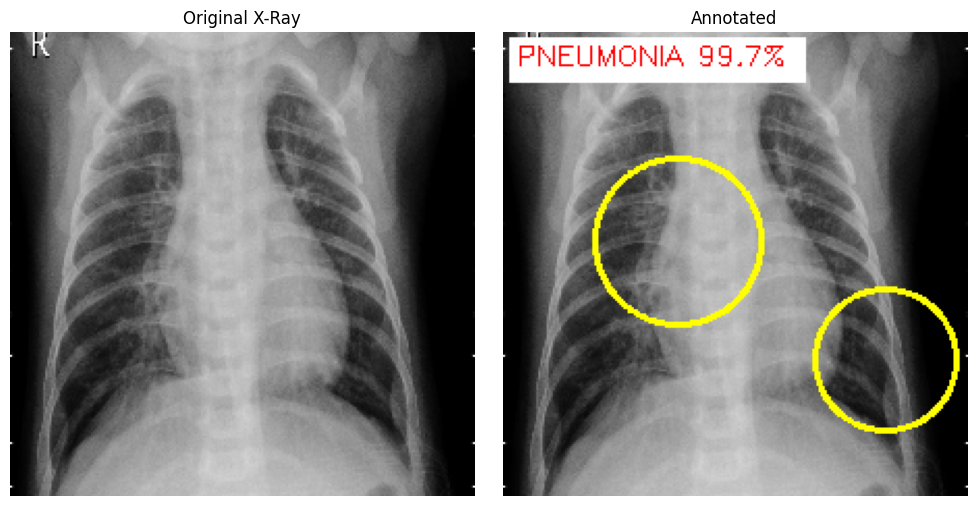

           FINAL AI-GENERATED DIAGNOSIS REPORT
Prediction        : PNEUMONIA
Confidence        : 99.72%
Laterality        : Bilateral (Both Lungs)
  Right Lung      : 63.4% involvement
  Left Lung       : 36.6% involvement
Affected Area     : 15.0% of scanned region
Severity          : Moderate
Severity Note     : Bilateral involvement noted — clinically monitored more closely even at lower area percentages.
-----------------------------------------------------------------
Detected Regions:
  1. Patient's RIGHT Lung — 10.91% of scan area
  2. Patient's LEFT Lung — 3.24% of scan area


In [ ]:
sample_dir = "/content/data/chest_xray/test/PNEUMONIA"
sample_img_name = os.listdir(sample_dir)[0]
sample_img_path = os.path.join(sample_dir, sample_img_name)

original, heatmap, annotated_img, report = full_diagnosis_report(sample_img_path, model)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(original.astype('uint8')); axes[0].set_title("Original X-Ray"); axes[0].axis('off')
axes[1].imshow(annotated_img); axes[1].set_title("Annotated"); axes[1].axis('off')
plt.tight_layout()
plt.show()

print("="*65)
print("           FINAL AI-GENERATED DIAGNOSIS REPORT")
print("="*65)
print(f"Prediction        : {report['prediction']}")
print(f"Confidence        : {report['confidence']}%")

if report['prediction'] == "PNEUMONIA":
    print(f"Laterality        : {report['laterality']}")
    print(f"  Right Lung      : {report['right_lung_pct']}% involvement")
    print(f"  Left Lung       : {report['left_lung_pct']}% involvement")
    print(f"Affected Area     : {report['affected_area_pct']}% of scanned region")
    print(f"Severity          : {report['severity']}")
    print(f"Severity Note     : {report['severity_note']}")
    print("-"*65)
    print("Detected Regions:")
    for i, r in enumerate(report['regions'], 1):
        print(f"  {i}. {r['side']} — {r['area_pct']}% of scan area")
print("="*65)

In [ ]:
def full_diagnosis_report(img_path, model, threshold=0.72):
    original, heatmap, overlay, pred_prob = overlay_gradcam(img_path, model)
    annotated_img, affected_percent, regions_info = annotate_and_analyze(original, heatmap, pred_prob, threshold)

    report = {
        "prediction": "PNEUMONIA" if pred_prob >= threshold else "NORMAL",
        "confidence": round(float(pred_prob)*100, 2) if pred_prob >= threshold else round(float(1-pred_prob)*100, 2),
    }

    if pred_prob >= threshold:
        lat_result = detect_laterality(heatmap)
        severity, severity_note = calculate_severity(affected_percent, lat_result['laterality'])

        report.update({
            "laterality": lat_result['laterality'],
            "right_lung_pct": lat_result['patient_right_involvement_pct'],
            "left_lung_pct": lat_result['patient_left_involvement_pct'],
            "affected_area_pct": affected_percent,
            "severity": severity,
            "severity_note": severity_note,
            "regions": regions_info
        })

    return original, heatmap, annotated_img, report

print("✅ Full diagnosis pipeline ready (fixed)")

✅ Full diagnosis pipeline ready (fixed)


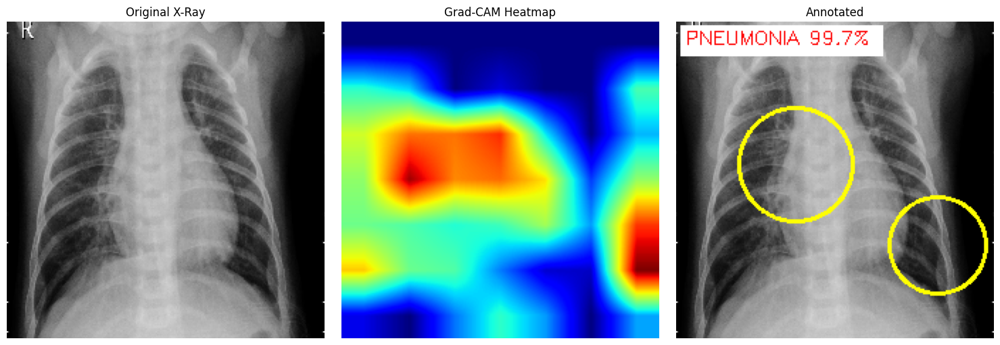

           FINAL AI-GENERATED DIAGNOSIS REPORT
Prediction        : PNEUMONIA
Confidence        : 99.72%
Laterality        : Bilateral (Both Lungs)
  Right Lung      : 63.4% involvement
  Left Lung       : 36.6% involvement
Affected Area     : 15.0% of scanned region
Severity          : Moderate
Severity Note     : Bilateral involvement noted — clinically monitored more closely even at lower area percentages.
-----------------------------------------------------------------
Detected Regions:
  1. Patient's RIGHT Lung — 10.91% of scan area
  2. Patient's LEFT Lung — 3.24% of scan area


In [ ]:
sample_dir = "/content/data/chest_xray/test/PNEUMONIA"
sample_img_name = os.listdir(sample_dir)[0]
sample_img_path = os.path.join(sample_dir, sample_img_name)

original, heatmap, annotated_img, report = full_diagnosis_report(sample_img_path, model)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(original.astype('uint8')); axes[0].set_title("Original X-Ray"); axes[0].axis('off')
axes[1].imshow(heatmap, cmap='jet'); axes[1].set_title("Grad-CAM Heatmap"); axes[1].axis('off')
axes[2].imshow(annotated_img); axes[2].set_title("Annotated"); axes[2].axis('off')
plt.tight_layout()
plt.show()

print("="*65)
print("           FINAL AI-GENERATED DIAGNOSIS REPORT")
print("="*65)
print(f"Prediction        : {report['prediction']}")
print(f"Confidence        : {report['confidence']}%")

if report['prediction'] == "PNEUMONIA":
    print(f"Laterality        : {report['laterality']}")
    print(f"  Right Lung      : {report['right_lung_pct']}% involvement")
    print(f"  Left Lung       : {report['left_lung_pct']}% involvement")
    print(f"Affected Area     : {report['affected_area_pct']}% of scanned region")
    print(f"Severity          : {report['severity']}")
    print(f"Severity Note     : {report['severity_note']}")
    print("-"*65)
    print("Detected Regions:")
    for i, r in enumerate(report['regions'], 1):
        print(f"  {i}. {r['side']} — {r['area_pct']}% of scan area")
print("="*65)

Testing image: person81_bacteria_398.jpeg


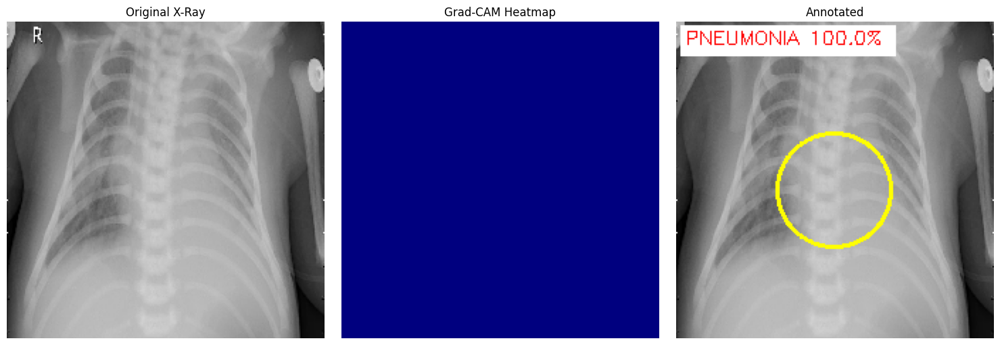

           FINAL AI-GENERATED DIAGNOSIS REPORT
Prediction        : PNEUMONIA
Confidence        : 100.0%
Laterality        : Bilateral (Both Lungs)
  Right Lung      : 50.0% involvement
  Left Lung       : 50.0% involvement
Affected Area     : 70.06% of scanned region
Severity          : Severe
Severity Note     : Bilateral involvement noted — clinically monitored more closely even at lower area percentages.
-----------------------------------------------------------------
Detected Regions:
  1. Patient's RIGHT Lung — 69.32% of scan area


In [ ]:
import random

sample_dir = "/content/data/chest_xray/test/PNEUMONIA"
all_files = os.listdir(sample_dir)
sample_img_name = random.choice(all_files)  # random image har baar
sample_img_path = os.path.join(sample_dir, sample_img_name)

print(f"Testing image: {sample_img_name}")

original, heatmap, annotated_img, report = full_diagnosis_report(sample_img_path, model)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(original.astype('uint8')); axes[0].set_title("Original X-Ray"); axes[0].axis('off')
axes[1].imshow(heatmap, cmap='jet'); axes[1].set_title("Grad-CAM Heatmap"); axes[1].axis('off')
axes[2].imshow(annotated_img); axes[2].set_title("Annotated"); axes[2].axis('off')
plt.tight_layout()
plt.show()

print("="*65)
print("           FINAL AI-GENERATED DIAGNOSIS REPORT")
print("="*65)
print(f"Prediction        : {report['prediction']}")
print(f"Confidence        : {report['confidence']}%")

if report['prediction'] == "PNEUMONIA":
    print(f"Laterality        : {report['laterality']}")
    print(f"  Right Lung      : {report['right_lung_pct']}% involvement")
    print(f"  Left Lung       : {report['left_lung_pct']}% involvement")
    print(f"Affected Area     : {report['affected_area_pct']}% of scanned region")
    print(f"Severity          : {report['severity']}")
    print(f"Severity Note     : {report['severity_note']}")
    print("-"*65)
    print("Detected Regions:")
    for i, r in enumerate(report['regions'], 1):
        print(f"  {i}. {r['side']} — {r['area_pct']}% of scan area")
print("="*65)

In [ ]:
def get_lung_roi_mask(img_h, img_w, top_margin=0.12, side_margin=0.08, bottom_margin=0.05):
    """
    Ek mask banata hai jo shoulders/neck (top) aur extreme edges ko exclude karta hai,
    taake circle sirf lungs ke likely area mein hi lage.
    """
    mask = np.zeros((img_h, img_w), dtype=np.uint8)
    top = int(img_h * top_margin)
    bottom = int(img_h * (1 - bottom_margin))
    left = int(img_w * side_margin)
    right = int(img_w * (1 - side_margin))
    mask[top:bottom, left:right] = 1
    return mask

print("✅ ROI mask function ready")

✅ ROI mask function ready


In [ ]:
def annotate_and_analyze(original_img, heatmap, pred_prob, threshold=0.72, hot_percentile=85, min_area_pct=2.0):
    annotated = original_img.copy().astype(np.uint8)
    annotated = cv2.cvtColor(annotated, cv2.COLOR_RGB2BGR)
    img_h, img_w = heatmap.shape

    is_pneumonia = pred_prob >= threshold
    affected_percent = 0.0
    regions_info = []

    if is_pneumonia:
        threshold_val = np.percentile(heatmap, hot_percentile)
        hot_mask = (heatmap >= threshold_val).astype(np.uint8)

        # NAYI LINE: sirf lung ROI ke andar wale hot pixels consider karein
        roi_mask = get_lung_roi_mask(img_h, img_w)
        hot_mask = hot_mask * roi_mask

        contours, _ = cv2.findContours(hot_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        total_pixels = img_h * img_w

        valid_regions = []
        for c in contours:
            area = cv2.contourArea(c)
            area_pct = (area / total_pixels) * 100
            if area_pct >= min_area_pct:
                valid_regions.append((c, area))

        if len(valid_regions) == 0 and len(contours) > 0:
            largest = max(contours, key=cv2.contourArea)
            valid_regions = [(largest, cv2.contourArea(largest))]

        valid_regions.sort(key=lambda x: x[1], reverse=True)
        valid_regions = valid_regions[:2]

        circles = []
        for contour, area in valid_regions:
            x, y, w, h = cv2.boundingRect(contour)
            peak_x = x + w // 2
            peak_y = y + h // 2
            radius = int(max(w, h) / 2)
            radius = max(radius, 10)
            radius = min(radius, int(min(img_h, img_w) * 0.18))
            circles.append({"x": peak_x, "y": peak_y, "radius": radius, "area": area})

        if len(circles) == 2:
            dist = np.sqrt((circles[0]["x"]-circles[1]["x"])**2 + (circles[0]["y"]-circles[1]["y"])**2)
            sum_radii = circles[0]["radius"] + circles[1]["radius"]
            if dist < sum_radii:
                scale = (dist - 5) / sum_radii if sum_radii > 0 else 1
                scale = max(scale, 0.3)
                for c in circles:
                    c["radius"] = max(int(c["radius"] * scale), 10)

        for c in circles:
            peak_x, peak_y, radius = c["x"], c["y"], c["radius"]
            margin = radius + 6
            top_margin = max(margin, 35)
            peak_x = int(np.clip(peak_x, margin, img_w - margin))
            peak_y = int(np.clip(peak_y, top_margin, img_h - margin))

            side = "Patient's RIGHT Lung" if peak_x < img_w // 2 else "Patient's LEFT Lung"
            regions_info.append({
                "x": peak_x, "y": peak_y, "radius": radius,
                "area_pct": round((c["area"]/total_pixels)*100, 2),
                "side": side
            })
            cv2.circle(annotated, (peak_x, peak_y), radius, (0, 255, 255), 2)

        affected_pixels = int(np.sum(hot_mask))
        affected_percent = round((affected_pixels / total_pixels) * 100, 2)

    if is_pneumonia:
        label = "PNEUMONIA " + str(round(float(pred_prob)*100, 1)) + "%"
        label_color = (0, 0, 255)
    else:
        label = "NORMAL " + str(round(float(1-pred_prob)*100, 1)) + "%"
        label_color = (0, 200, 0)

    font_scale = 0.45
    thickness = 1
    text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)
    text_w, text_h = text_size[0]
    cv2.rectangle(annotated, (3, 3), (8 + text_w + 6, 8 + text_h + 6), (255, 255, 255), -1)
    cv2.putText(annotated, label, (6, 6 + text_h), cv2.FONT_HERSHEY_SIMPLEX, font_scale, label_color, thickness)

    annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
    return annotated, affected_percent, regions_info

print("✅ ROI-constrained annotation function ready")

✅ ROI-constrained annotation function ready


In [ ]:
sample_dir = "/content/data/chest_xray/test/PNEUMONIA"

True Label: NORMAL
Testing image: NORMAL2-IM-0123-0001.jpeg


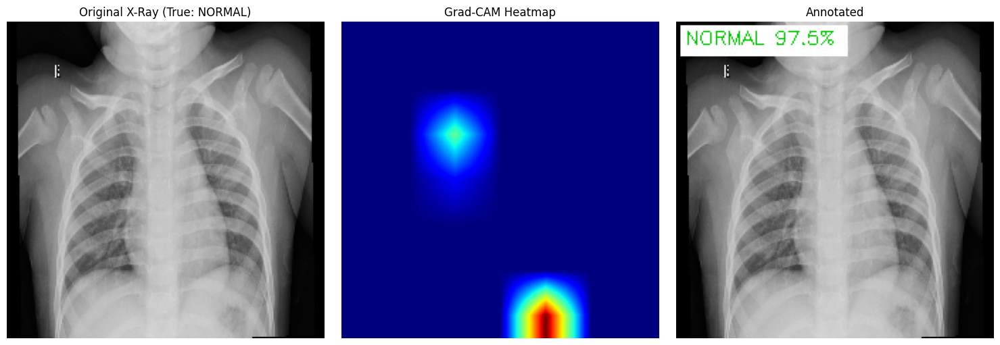

           FINAL AI-GENERATED DIAGNOSIS REPORT
True Label (ground truth) : NORMAL
Prediction                : NORMAL
Confidence                : 97.52%
✅ CORRECT PREDICTION


In [ ]:
import random

# Dono classes ke folders
normal_dir = "/content/data/chest_xray/test/NORMAL"
pneumonia_dir = "/content/data/chest_xray/test/PNEUMONIA"

# Randomly decide karein kaunsi class se image le (50-50 chance)
chosen_class = random.choice(["NORMAL", "PNEUMONIA"])
sample_dir = normal_dir if chosen_class == "NORMAL" else pneumonia_dir

all_files = os.listdir(sample_dir)
sample_img_name = random.choice(all_files)
sample_img_path = os.path.join(sample_dir, sample_img_name)

print(f"True Label: {chosen_class}")
print(f"Testing image: {sample_img_name}")

original, heatmap, annotated_img, report = full_diagnosis_report(sample_img_path, model)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(original.astype('uint8')); axes[0].set_title(f"Original X-Ray (True: {chosen_class})"); axes[0].axis('off')
axes[1].imshow(heatmap, cmap='jet'); axes[1].set_title("Grad-CAM Heatmap"); axes[1].axis('off')
axes[2].imshow(annotated_img); axes[2].set_title("Annotated"); axes[2].axis('off')
plt.tight_layout()
plt.show()

print("="*65)
print("           FINAL AI-GENERATED DIAGNOSIS REPORT")
print("="*65)
print(f"True Label (ground truth) : {chosen_class}")
print(f"Prediction                : {report['prediction']}")
print(f"Confidence                : {report['confidence']}%")

if report['prediction'] == "PNEUMONIA":
    print(f"Laterality        : {report['laterality']}")
    print(f"  Right Lung      : {report['right_lung_pct']}% involvement")
    print(f"  Left Lung       : {report['left_lung_pct']}% involvement")
    print(f"Affected Area     : {report['affected_area_pct']}% of scanned region")
    print(f"Severity          : {report['severity']}")
    print(f"Severity Note     : {report['severity_note']}")
    print("-"*65)
    print("Detected Regions:")
    for i, r in enumerate(report['regions'], 1):
        print(f"  {i}. {r['side']} — {r['area_pct']}% of scan area")
print("="*65)

if report['prediction'] == chosen_class:
    print("✅ CORRECT PREDICTION")
else:
    print("❌ INCORRECT PREDICTION")

In [ ]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name="conv5_block16_concat", pred_index=None):
    grad_model = tf.keras.models.Model(
        inputs=model.inputs,
        outputs=[model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = 0
        prob = predictions[:, pred_index]

        # FIX: Sigmoid saturation se bachne ke liye, probability ko logit mein convert karein
        eps = 1e-7
        prob_clipped = tf.clip_by_value(prob, eps, 1 - eps)
        logit = tf.math.log(prob_clipped) - tf.math.log(1 - prob_clipped)
        class_channel = logit  # ab isi ka gradient lenge, sigmoid output ka nahi

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-10)
    return heatmap.numpy(), predictions.numpy()[0][0]

print("✅ Fixed Grad-CAM function (saturation-proof)")

✅ Fixed Grad-CAM function (saturation-proof)


In [ ]:
def letterbox_resize(image, target_size=224, pad_color=0):
    h, w = image.shape[:2]
    scale = target_size / max(h, w)
    new_w, new_h = int(w * scale), int(h * scale)
    resized = cv2.resize(image, (new_w, new_h), interpolation=cv2.INTER_AREA)
    if len(image.shape) == 3:
        canvas = np.full((target_size, target_size, image.shape[2]), pad_color, dtype=np.uint8)
    else:
        canvas = np.full((target_size, target_size), pad_color, dtype=np.uint8)
    top = (target_size - new_h) // 2
    left = (target_size - new_w) // 2
    canvas[top:top+new_h, left:left+new_w] = resized
    return canvas

def apply_clahe(image, clip_limit=2.0, tile_grid_size=(8,8)):
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    return clahe.apply(image)

def strip_artifacts(image, border_crop_percent=0.03):
    h, w = image.shape[:2]
    crop_h = int(h * border_crop_percent)
    crop_w = int(w * border_crop_percent)
    cropped = image[crop_h:h-crop_h, crop_w:w-crop_w]
    gray = cropped.copy()
    _, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    mask = np.ones_like(gray) * 255
    ch, cw = gray.shape[:2]
    border_zone = 0.08
    for c in contours:
        x, y, bw, bh = cv2.boundingRect(c)
        area = bw * bh
        near_edge = (x < cw*border_zone or x+bw > cw*(1-border_zone) or
                     y < ch*border_zone or y+bh > ch*(1-border_zone))
        if near_edge and area < (cw*ch*0.01):
            cv2.drawContours(mask, [c], -1, 0, -1)
    cleaned = cv2.inpaint(gray, (255-mask), 3, cv2.INPAINT_TELEA)
    return cleaned

def detect_and_split_panels(image):
    h, w = image.shape[:2]
    aspect_ratio = w / h
    panels = []
    if aspect_ratio > 1.25:
        mid = w // 2
        strip = image[:, mid-10:mid+10]
        if np.mean(strip) < 30 or np.std(strip) < 5:
            panels = [image[:, :mid], image[:, mid:]]
        else:
            panels = [image]
    elif aspect_ratio < 0.8:
        mid = h // 2
        strip = image[mid-10:mid+10, :]
        if np.mean(strip) < 30 or np.std(strip) < 5:
            panels = [image[:mid, :], image[mid:, :]]
        else:
            panels = [image]
    else:
        panels = [image]
    return panels

def is_ood_image(image_bgr, saturation_threshold=25):
    hsv = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2HSV)
    mean_saturation = np.mean(hsv[:,:,1])
    b, g, r = cv2.split(image_bgr.astype(np.float32))
    channel_diff = np.mean(np.abs(r-g)) + np.mean(np.abs(g-b)) + np.mean(np.abs(r-b))
    is_ood = (mean_saturation > saturation_threshold) and (channel_diff > 15)
    return is_ood, mean_saturation, channel_diff

def preprocess_pipeline(image_path, target_size=224, apply_split=True):
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        raise ValueError(f"Could not read image: {image_path}")
    ood_flag, sat, diff = is_ood_image(img_bgr)
    if ood_flag:
        return {"ood": True, "panels": [], "saturation": sat, "channel_diff": diff}
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    panels = detect_and_split_panels(gray) if apply_split else [gray]
    processed_panels = []
    for p in panels:
        p = strip_artifacts(p)
        p = apply_clahe(p)
        p = letterbox_resize(p, target_size)
        processed_panels.append(p)
    return {"ood": False, "panels": processed_panels, "saturation": sat, "channel_diff": diff}

print("✅ All Module 2 preprocessing functions reloaded")

✅ All Module 2 preprocessing functions reloaded


Dual-panel image shape: (400, 1135)
Aspect ratio (width/height): 2.84


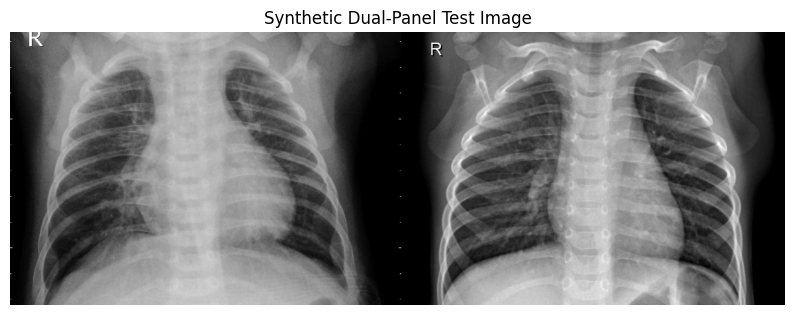

In [ ]:
import os

# Do alag X-ray images lein aur unko side-by-side jorh dein
img1_path = os.path.join("/content/data/chest_xray/test/PNEUMONIA", os.listdir("/content/data/chest_xray/test/PNEUMONIA")[0])
img2_path = os.path.join("/content/data/chest_xray/test/NORMAL", os.listdir("/content/data/chest_xray/test/NORMAL")[0])

img1 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread(img2_path, cv2.IMREAD_GRAYSCALE)

# Same height par resize karein taake side-by-side jorh sakein
common_h = 400
img1_r = cv2.resize(img1, (int(img1.shape[1]*common_h/img1.shape[0]), common_h))
img2_r = cv2.resize(img2, (int(img2.shape[1]*common_h/img2.shape[0]), common_h))

# Beech mein ek black separator line ke sath jorh dein
separator = np.zeros((common_h, 15), dtype=np.uint8)
dual_panel_img = np.hstack([img1_r, separator, img2_r])

# Save karein taake preprocess_pipeline function use kar sakein (jo file path leta hai)
cv2.imwrite('/content/test_dual_panel.jpg', dual_panel_img)

print(f"Dual-panel image shape: {dual_panel_img.shape}")
print(f"Aspect ratio (width/height): {dual_panel_img.shape[1]/dual_panel_img.shape[0]:.2f}")

plt.figure(figsize=(10,4))
plt.imshow(dual_panel_img, cmap='gray')
plt.title("Synthetic Dual-Panel Test Image")
plt.axis('off')
plt.show()

OOD detected: False
Number of panels detected: 2
✅ SUCCESS — Multi-panel splitting worked!


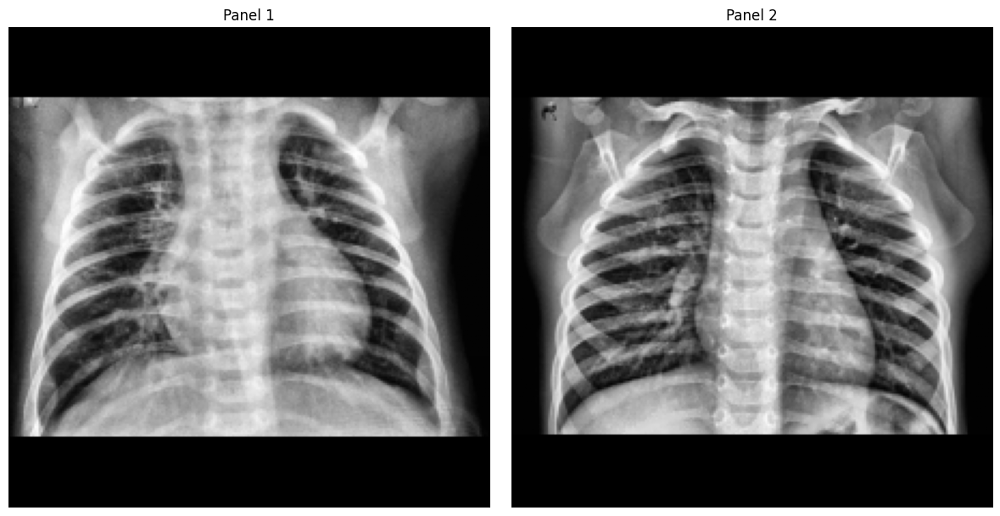

In [ ]:
result = preprocess_pipeline('/content/test_dual_panel.jpg')

print(f"OOD detected: {result['ood']}")
print(f"Number of panels detected: {len(result['panels'])}")

if len(result['panels']) > 1:
    print("✅ SUCCESS — Multi-panel splitting worked!")
else:
    print("❌ FAILED — Image was NOT split (still treated as single panel)")

fig, axes = plt.subplots(1, len(result['panels']), figsize=(6*len(result['panels']), 6))
if len(result['panels']) == 1:
    axes = [axes]
for i, p in enumerate(result['panels']):
    axes[i].imshow(p, cmap='gray')
    axes[i].set_title(f"Panel {i+1}")
    axes[i].axis('off')
plt.tight_layout()
plt.show()

In [ ]:
def preprocess_for_model(panel_img, img_size=224):
    """
    Single-channel (grayscale) panel ko model input format mein convert karta hai
    (3-channel, normalized, batch dimension ke sath)
    """
    panel_rgb = cv2.cvtColor(panel_img, cv2.COLOR_GRAY2RGB)
    panel_norm = panel_rgb.astype(np.float32) / 255.0
    panel_batch = np.expand_dims(panel_norm, axis=0)
    return panel_batch

print("="*60)
print("DUAL-PANEL IMAGE — INDEPENDENT PREDICTIONS")
print("="*60)

for i, panel in enumerate(result['panels'], 1):
    panel_input = preprocess_for_model(panel)
    pred = model.predict(panel_input, verbose=0)[0][0]
    label = "PNEUMONIA" if pred >= CALIBRATED_THRESHOLD else "NORMAL"
    confidence = pred*100 if pred >= CALIBRATED_THRESHOLD else (1-pred)*100

    print(f"\nPanel {i}:")
    print(f"  Prediction : {label}")
    print(f"  Confidence : {confidence:.2f}%")

print("="*60)

DUAL-PANEL IMAGE — INDEPENDENT PREDICTIONS

Panel 1:
  Prediction : PNEUMONIA
  Confidence : 99.20%

Panel 2:
  Prediction : NORMAL
  Confidence : 90.87%


In [ ]:
# Ek colorful/natural image download karte hain test ke liye
!wget -q -O /content/test_natural_photo.jpg "https://upload.wikimedia.org/wikipedia/commons/thumb/3/3a/Cat03.jpg/320px-Cat03.jpg"

test_img = cv2.imread('/content/test_natural_photo.jpg')
if test_img is not None:
    plt.figure(figsize=(5,5))
    plt.imshow(cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB))
    plt.title("Test: Natural Photo (should be REJECTED)")
    plt.axis('off')
    plt.show()

    result_ood = preprocess_pipeline('/content/test_natural_photo.jpg')
    print(f"OOD Detected: {result_ood['ood']}")
    print(f"Saturation: {result_ood['saturation']:.2f}")
    print(f"Channel Diff: {result_ood['channel_diff']:.2f}")

    if result_ood['ood']:
        print("✅ SUCCESS — Correctly rejected as non-medical image")
    else:
        print("❌ FAILED — This should have been rejected!")
else:
    print("Image download failed — internet access issue in Colab, try a different test image")

Image download failed — internet access issue in Colab, try a different test image


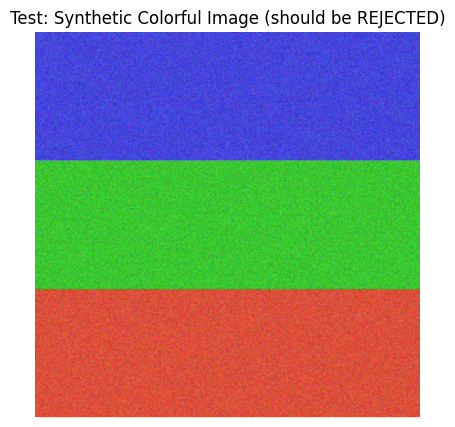

✅ Synthetic test image created


In [ ]:
# Ek random colorful image banate hain (jaise koi natural photo hoti hai)
np.random.seed(42)
synthetic_photo = np.zeros((300, 300, 3), dtype=np.uint8)

# Alag alag color patches (natural photo jaisa high color-variance simulate karne ke liye)
synthetic_photo[:100, :, 0] = 200   # top: reddish
synthetic_photo[:100, :, 1] = 50
synthetic_photo[:100, :, 2] = 50

synthetic_photo[100:200, :, 0] = 30   # middle: greenish
synthetic_photo[100:200, :, 1] = 180
synthetic_photo[100:200, :, 2] = 40

synthetic_photo[200:, :, 0] = 40    # bottom: bluish
synthetic_photo[200:, :, 1] = 60
synthetic_photo[200:, :, 2] = 200

# Thoda random noise bhi add karein taake zyada "natural" lage
noise = np.random.randint(0, 40, synthetic_photo.shape, dtype=np.uint8)
synthetic_photo = cv2.add(synthetic_photo, noise)

cv2.imwrite('/content/test_synthetic_photo.jpg', synthetic_photo)

plt.figure(figsize=(5,5))
plt.imshow(cv2.cvtColor(synthetic_photo, cv2.COLOR_BGR2RGB))
plt.title("Test: Synthetic Colorful Image (should be REJECTED)")
plt.axis('off')
plt.show()

print("✅ Synthetic test image created")

In [ ]:
result_ood = preprocess_pipeline('/content/test_synthetic_photo.jpg')
print(f"OOD Detected: {result_ood['ood']}")
print(f"Saturation: {result_ood['saturation']:.2f}")
print(f"Channel Diff: {result_ood['channel_diff']:.2f}")

if result_ood['ood']:
    print("✅ SUCCESS — Correctly rejected as non-medical image")
else:
    print("❌ FAILED — This should have been rejected!")

OOD Detected: True
Saturation: 184.80
Channel Diff: 307.05
✅ SUCCESS — Correctly rejected as non-medical image


In [ ]:
# 5 random real X-rays test karte hain — sabko OOD=False aana chahiye
import random

test_dirs = ["/content/data/chest_xray/test/NORMAL", "/content/data/chest_xray/test/PNEUMONIA"]
print("="*60)
print("SANITY CHECK: Real X-rays should NOT be flagged as OOD")
print("="*60)

for d in test_dirs:
    files = random.sample(os.listdir(d), 3)  # 3 random images har folder se
    for f in files:
        path = os.path.join(d, f)
        result = preprocess_pipeline(path)
        status = "❌ WRONGLY REJECTED" if result['ood'] else "✅ Correctly accepted"
        print(f"{f[:30]:30s} | Sat: {result['saturation']:6.2f} | {status}")

print("="*60)

SANITY CHECK: Real X-rays should NOT be flagged as OOD
NORMAL2-IM-0381-0001.jpeg      | Sat:   0.00 | ✅ Correctly accepted
IM-0097-0001.jpeg              | Sat:   0.00 | ✅ Correctly accepted
NORMAL2-IM-0338-0001.jpeg      | Sat:   0.00 | ✅ Correctly accepted
person15_virus_46.jpeg         | Sat:   0.00 | ✅ Correctly accepted
person149_bacteria_713.jpeg    | Sat:   0.00 | ✅ Correctly accepted
person1612_virus_2797.jpeg     | Sat:   0.00 | ✅ Correctly accepted


Original size: (648, 912)
Degraded (low-res) size: (50, 50)

OOD: False
Panels detected: 1
Prediction: PNEUMONIA (100.00%)
[True label: PNEUMONIA]


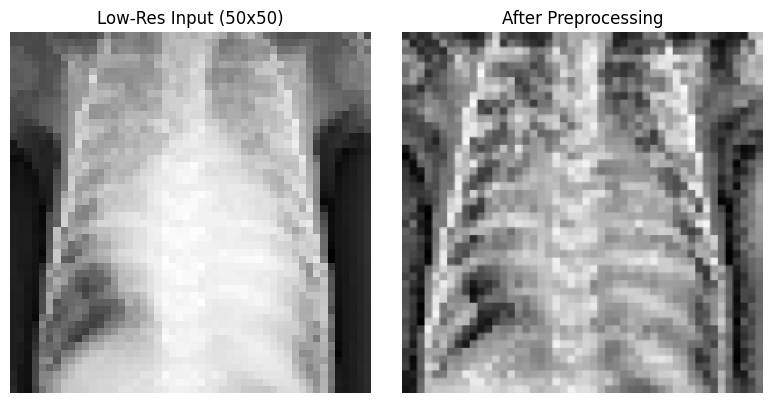

In [ ]:
# Ek X-ray lein aur usko jaan boojh kar bohot chhota (low-res) kar dein
sample_path = os.path.join("/content/data/chest_xray/test/PNEUMONIA", os.listdir("/content/data/chest_xray/test/PNEUMONIA")[3])
original_img = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)

# Bohot chhota resize (low quality simulate karne ke liye) — jaise 50x50
tiny_img = cv2.resize(original_img, (50, 50))
cv2.imwrite('/content/test_lowres.jpg', tiny_img)

print(f"Original size: {original_img.shape}")
print(f"Degraded (low-res) size: {tiny_img.shape}")

# Preprocessing pipeline se guzarein
result_lowres = preprocess_pipeline('/content/test_lowres.jpg')
print(f"\nOOD: {result_lowres['ood']}")
print(f"Panels detected: {len(result_lowres['panels'])}")

# Predict karein
panel_input = preprocess_for_model(result_lowres['panels'][0])
pred = model.predict(panel_input, verbose=0)[0][0]
label = "PNEUMONIA" if pred >= CALIBRATED_THRESHOLD else "NORMAL"
confidence = pred*100 if pred >= CALIBRATED_THRESHOLD else (1-pred)*100
print(f"Prediction: {label} ({confidence:.2f}%)")
print(f"[True label: PNEUMONIA]")

fig, axes = plt.subplots(1, 2, figsize=(8,4))
axes[0].imshow(tiny_img, cmap='gray'); axes[0].set_title("Low-Res Input (50x50)"); axes[0].axis('off')
axes[1].imshow(result_lowres['panels'][0], cmap='gray'); axes[1].set_title("After Preprocessing"); axes[1].axis('off')
plt.tight_layout()
plt.show()

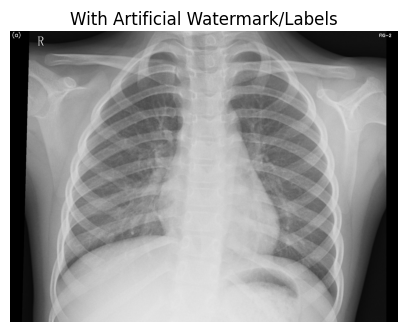

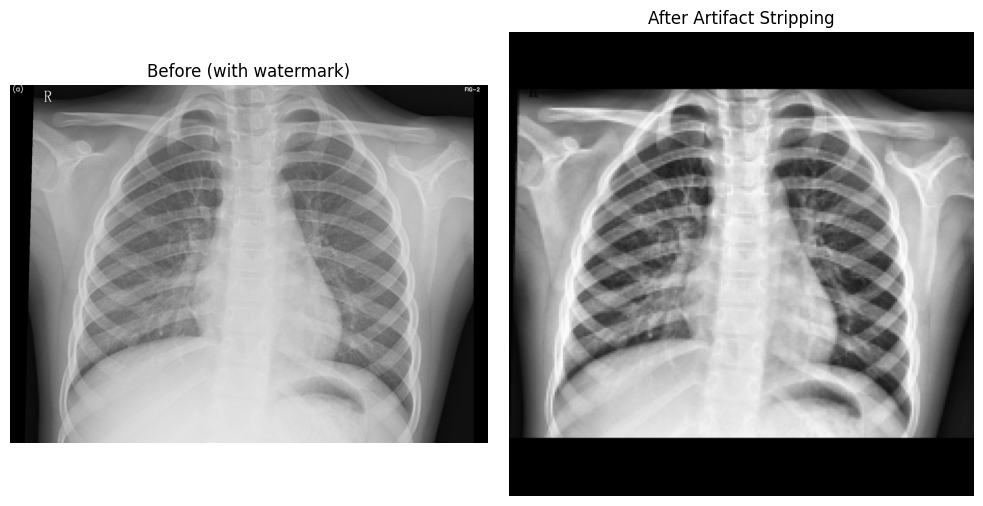

Prediction: NORMAL (98.98%)
[True label: NORMAL]


In [ ]:
sample_path2 = os.path.join("/content/data/chest_xray/test/NORMAL", os.listdir("/content/data/chest_xray/test/NORMAL")[2])
clean_img = cv2.imread(sample_path2, cv2.IMREAD_GRAYSCALE)

# Artificial watermark/label add karte hain (jaise "(a)" label, common medical papers mein)
watermarked_img = clean_img.copy()
cv2.putText(watermarked_img, "(a)", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
cv2.putText(watermarked_img, "FIG-2", (watermarked_img.shape[1]-100, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255,255,255), 2)

cv2.imwrite('/content/test_watermark.jpg', watermarked_img)

plt.figure(figsize=(5,5))
plt.imshow(watermarked_img, cmap='gray')
plt.title("With Artificial Watermark/Labels")
plt.axis('off')
plt.show()

# Preprocessing pipeline se guzarein
result_wm = preprocess_pipeline('/content/test_watermark.jpg')
processed_panel = result_wm['panels'][0]

fig, axes = plt.subplots(1, 2, figsize=(10,5))
axes[0].imshow(watermarked_img, cmap='gray'); axes[0].set_title("Before (with watermark)"); axes[0].axis('off')
axes[1].imshow(processed_panel, cmap='gray'); axes[1].set_title("After Artifact Stripping"); axes[1].axis('off')
plt.tight_layout()
plt.show()

# Predict
panel_input = preprocess_for_model(processed_panel)
pred = model.predict(panel_input, verbose=0)[0][0]
label = "PNEUMONIA" if pred >= CALIBRATED_THRESHOLD else "NORMAL"
confidence = pred*100 if pred >= CALIBRATED_THRESHOLD else (1-pred)*100
print(f"Prediction: {label} ({confidence:.2f}%)")
print(f"[True label: NORMAL]")

In [ ]:
def analyze_xray(image_path, model, threshold=0.72, img_size=224):
    """
    Complete end-to-end pipeline: raw image path leta hai, poora diagnosis report deta hai.
    Steps: OOD check -> Panel split -> Preprocess -> Predict -> Grad-CAM -> Laterality -> Severity
    """
    results = []

    # Step 1: OOD Check
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        return [{"error": "Could not read image file"}]

    ood_flag, sat, diff = is_ood_image(img_bgr)
    if ood_flag:
        return [{"error": "REJECTED — This does not appear to be a valid medical X-ray image (non-medical/OOD detected)",
                  "saturation": round(float(sat),2), "channel_diff": round(float(diff),2)}]

    # Step 2: Panel Splitting (dual/stacked image handling)
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    panels_raw = detect_and_split_panels(gray)

    # Step 3: Process har panel independently
    for idx, panel in enumerate(panels_raw, 1):
        # Preprocessing: artifact strip -> CLAHE -> letterbox
        panel_clean = strip_artifacts(panel)
        panel_clahe = apply_clahe(panel_clean)
        panel_final = letterbox_resize(panel_clahe, img_size)

        # Save temporarily for Grad-CAM function (jo file path leta hai)
        temp_path = f'/content/temp_panel_{idx}.jpg'
        cv2.imwrite(temp_path, panel_final)

        # Step 4-7: Predict + Grad-CAM + Laterality + Severity (already built functions use karte hain)
        original, heatmap, annotated_img, report = full_diagnosis_report(temp_path, model, threshold)
        report["panel_number"] = idx
        report["total_panels_detected"] = len(panels_raw)

        results.append({
            "report": report,
            "original": original,
            "heatmap": heatmap,
            "annotated": annotated_img
        })

    return results

print("✅ Master inference pipeline ready")

✅ Master inference pipeline ready


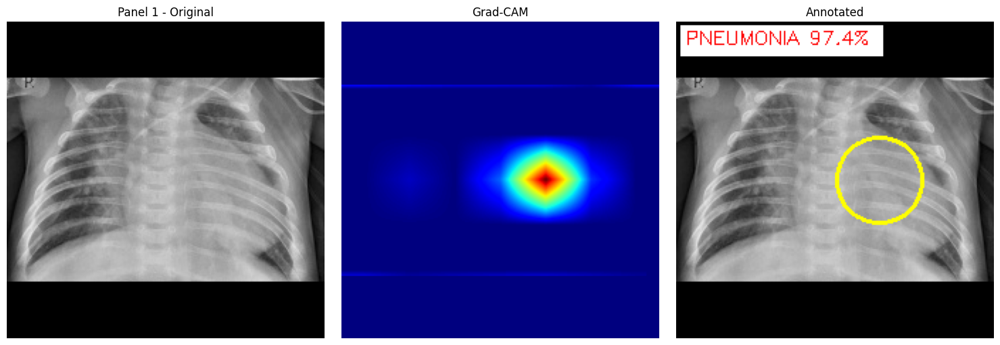

PANEL 1 of 1 — DIAGNOSIS REPORT
Prediction  : PNEUMONIA
Confidence  : 97.39%
Laterality  : Unilateral - Patient's LEFT Lung
Affected Area: 4.11%
Severity    : Mild


In [ ]:
sample_path = os.path.join("/content/data/chest_xray/test/PNEUMONIA", os.listdir("/content/data/chest_xray/test/PNEUMONIA")[7])

results = analyze_xray(sample_path, model)

for r in results:
    if "error" in r:
        print("⚠️", r["error"])
        continue

    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title(f"Panel {rep['panel_number']} - Original"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()

    print("="*60)
    print(f"PANEL {rep['panel_number']} of {rep['total_panels_detected']} — DIAGNOSIS REPORT")
    print("="*60)
    print(f"Prediction  : {rep['prediction']}")
    print(f"Confidence  : {rep['confidence']}%")
    if rep['prediction'] == "PNEUMONIA":
        print(f"Laterality  : {rep['laterality']}")
        print(f"Affected Area: {rep['affected_area_pct']}%")
        print(f"Severity    : {rep['severity']}")
    print("="*60)

In [ ]:
results_dual = analyze_xray('/content/test_dual_panel.jpg', model)

for r in results_dual:
    if "error" in r:
        print("⚠️", r["error"])
        continue
    rep = r["report"]
    print(f"\n--- Panel {rep['panel_number']} of {rep['total_panels_detected']} ---")
    print(f"Prediction: {rep['prediction']} ({rep['confidence']}%)")


--- Panel 1 of 2 ---
Prediction: PNEUMONIA (99.24%)

--- Panel 2 of 2 ---
Prediction: NORMAL (91.43%)


In [ ]:
results_ood = analyze_xray('/content/test_synthetic_photo.jpg', model)
for r in results_ood:
    if "error" in r:
        print("⚠️", r["error"])

⚠️ REJECTED — This does not appear to be a valid medical X-ray image (non-medical/OOD detected)


In [ ]:
def annotate_and_analyze(original_img, heatmap, pred_prob, threshold=0.72, hot_percentile=85, min_area_pct=2.0):
    annotated = original_img.copy().astype(np.uint8)
    annotated = cv2.cvtColor(annotated, cv2.COLOR_RGB2BGR)
    img_h, img_w = heatmap.shape

    is_pneumonia = pred_prob >= threshold
    affected_percent = 0.0
    regions_info = []

    if is_pneumonia:
        threshold_val = np.percentile(heatmap, hot_percentile)
        hot_mask = (heatmap >= threshold_val).astype(np.uint8)

        # NAYA FIX: Content mask banayein — sirf wahi area jahan black padding NAHI hai
        gray_check = cv2.cvtColor(original_img.astype(np.uint8), cv2.COLOR_RGB2GRAY) if len(original_img.shape) == 3 else original_img
        content_mask = (gray_check > 15).astype(np.uint8)  # black padding = 0, content = 1

        # Content mask ko thoda erode karein taake padding ke bilkul boundary/edge bhi exclude ho
        # (kyunki boundary ke bilkul paas bhi spurious activation ho sakti hai)
        kernel = np.ones((9,9), np.uint8)
        content_mask_eroded = cv2.erode(content_mask, kernel, iterations=2)

        # Ab hot_mask ko content area (aur ROI center) tak hi limit karein
        roi_mask = get_lung_roi_mask(img_h, img_w)
        hot_mask = hot_mask * content_mask_eroded * roi_mask

        contours, _ = cv2.findContours(hot_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        total_pixels = int(np.sum(content_mask_eroded))  # sirf content area ko "total" maanein, padding ko nahi
        if total_pixels == 0:
            total_pixels = img_h * img_w

        valid_regions = []
        for c in contours:
            area = cv2.contourArea(c)
            area_pct = (area / total_pixels) * 100
            if area_pct >= min_area_pct:
                valid_regions.append((c, area))

        if len(valid_regions) == 0 and len(contours) > 0:
            largest = max(contours, key=cv2.contourArea)
            valid_regions = [(largest, cv2.contourArea(largest))]

        valid_regions.sort(key=lambda x: x[1], reverse=True)
        valid_regions = valid_regions[:2]

        circles = []
        for contour, area in valid_regions:
            x, y, w, h = cv2.boundingRect(contour)
            peak_x = x + w // 2
            peak_y = y + h // 2
            radius = int(max(w, h) / 2)
            radius = max(radius, 10)
            radius = min(radius, int(min(img_h, img_w) * 0.18))
            circles.append({"x": peak_x, "y": peak_y, "radius": radius, "area": area})

        if len(circles) == 2:
            dist = np.sqrt((circles[0]["x"]-circles[1]["x"])**2 + (circles[0]["y"]-circles[1]["y"])**2)
            sum_radii = circles[0]["radius"] + circles[1]["radius"]
            if dist < sum_radii:
                scale = (dist - 5) / sum_radii if sum_radii > 0 else 1
                scale = max(scale, 0.3)
                for c in circles:
                    c["radius"] = max(int(c["radius"] * scale), 10)

        for c in circles:
            peak_x, peak_y, radius = c["x"], c["y"], c["radius"]
            margin = radius + 6
            top_margin = max(margin, 35)
            peak_x = int(np.clip(peak_x, margin, img_w - margin))
            peak_y = int(np.clip(peak_y, top_margin, img_h - margin))

            side = "Patient's RIGHT Lung" if peak_x < img_w // 2 else "Patient's LEFT Lung"
            regions_info.append({
                "x": peak_x, "y": peak_y, "radius": radius,
                "area_pct": round((c["area"]/total_pixels)*100, 2),
                "side": side
            })
            cv2.circle(annotated, (peak_x, peak_y), radius, (0, 255, 255), 2)

        affected_pixels = int(np.sum(hot_mask))
        affected_percent = round((affected_pixels / total_pixels) * 100, 2)

    if is_pneumonia:
        label = "PNEUMONIA " + str(round(float(pred_prob)*100, 1)) + "%"
        label_color = (0, 0, 255)
    else:
        label = "NORMAL " + str(round(float(1-pred_prob)*100, 1)) + "%"
        label_color = (0, 200, 0)

    font_scale = 0.45
    thickness = 1
    text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)
    text_w, text_h = text_size[0]
    cv2.rectangle(annotated, (3, 3), (8 + text_w + 6, 8 + text_h + 6), (255, 255, 255), -1)
    cv2.putText(annotated, label, (6, 6 + text_h), cv2.FONT_HERSHEY_SIMPLEX, font_scale, label_color, thickness)

    annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
    return annotated, affected_percent, regions_info

print("✅ Content-aware (padding-excluded) annotation function ready")

✅ Content-aware (padding-excluded) annotation function ready


In [ ]:
def get_content_mask(gray_img, erode_px=10):
    """
    Image mein 'asal content' (non-black/non-padding) area ka mask banata hai.
    """
    content_mask = (gray_img > 15).astype(np.uint8)
    kernel = np.ones((erode_px, erode_px), np.uint8)
    content_mask_eroded = cv2.erode(content_mask, kernel, iterations=1)
    return content_mask_eroded

def clean_heatmap(original_img, heatmap):
    """
    Heatmap ke un hisso ki values ZERO kar deta hai jo black padding area mein hain.
    Isse percentile/threshold calculation padding se corrupt nahi hoga.
    """
    gray_check = cv2.cvtColor(original_img.astype(np.uint8), cv2.COLOR_RGB2GRAY) if len(original_img.shape) == 3 else original_img
    content_mask = get_content_mask(gray_check)

    # Heatmap resize karein content_mask ke size ke barabar (agar different ho)
    if content_mask.shape != heatmap.shape:
        content_mask = cv2.resize(content_mask, (heatmap.shape[1], heatmap.shape[0]))

    heatmap_cleaned = heatmap * content_mask
    return heatmap_cleaned

print("✅ Heatmap cleaning function ready")

✅ Heatmap cleaning function ready


In [ ]:
def full_diagnosis_report(img_path, model, threshold=0.72):
    original, heatmap, overlay, pred_prob = overlay_gradcam(img_path, model)

    # NAYA FIX: heatmap ko clean karein (padding wali galat hot-values hataein)
    heatmap = clean_heatmap(original, heatmap)

    annotated_img, affected_percent, regions_info = annotate_and_analyze(original, heatmap, pred_prob, threshold)

    report = {
        "prediction": "PNEUMONIA" if pred_prob >= threshold else "NORMAL",
        "confidence": round(float(pred_prob)*100, 2) if pred_prob >= threshold else round(float(1-pred_prob)*100, 2),
    }

    if pred_prob >= threshold:
        lat_result = detect_laterality(heatmap)
        severity, severity_note = calculate_severity(affected_percent, lat_result['laterality'])

        report.update({
            "laterality": lat_result['laterality'],
            "right_lung_pct": lat_result['patient_right_involvement_pct'],
            "left_lung_pct": lat_result['patient_left_involvement_pct'],
            "affected_area_pct": affected_percent,
            "severity": severity,
            "severity_note": severity_note,
            "regions": regions_info
        })

    return original, heatmap, annotated_img, report

print("✅ Full diagnosis pipeline updated with heatmap cleaning")

✅ Full diagnosis pipeline updated with heatmap cleaning


In [ ]:
def annotate_and_analyze(original_img, heatmap, pred_prob, threshold=0.72, hot_percentile=85, min_area_pct=2.0):
    annotated = original_img.copy().astype(np.uint8)
    annotated = cv2.cvtColor(annotated, cv2.COLOR_RGB2BGR)
    img_h, img_w = heatmap.shape

    is_pneumonia = pred_prob >= threshold
    affected_percent = 0.0
    regions_info = []

    if is_pneumonia:
        # Percentile sirf non-zero (valid) values par calculate karein
        nonzero_vals = heatmap[heatmap > 0]
        if len(nonzero_vals) > 0:
            threshold_val = np.percentile(nonzero_vals, hot_percentile)
        else:
            threshold_val = 0

        hot_mask = (heatmap >= threshold_val).astype(np.uint8)
        hot_mask[heatmap == 0] = 0  # extra safety — padding kabhi hot na ho

        contours, _ = cv2.findContours(hot_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        total_pixels = img_h * img_w

        valid_regions = []
        for c in contours:
            area = cv2.contourArea(c)
            area_pct = (area / total_pixels) * 100
            if area_pct >= min_area_pct:
                valid_regions.append((c, area))

        if len(valid_regions) == 0 and len(contours) > 0:
            largest = max(contours, key=cv2.contourArea)
            valid_regions = [(largest, cv2.contourArea(largest))]

        valid_regions.sort(key=lambda x: x[1], reverse=True)
        valid_regions = valid_regions[:2]

        circles = []
        for contour, area in valid_regions:
            x, y, w, h = cv2.boundingRect(contour)
            peak_x = x + w // 2
            peak_y = y + h // 2
            radius = int(max(w, h) / 2)
            radius = max(radius, 10)
            radius = min(radius, int(min(img_h, img_w) * 0.18))
            circles.append({"x": peak_x, "y": peak_y, "radius": radius, "area": area})

        if len(circles) == 2:
            dist = np.sqrt((circles[0]["x"]-circles[1]["x"])**2 + (circles[0]["y"]-circles[1]["y"])**2)
            sum_radii = circles[0]["radius"] + circles[1]["radius"]
            if dist < sum_radii:
                scale = (dist - 5) / sum_radii if sum_radii > 0 else 1
                scale = max(scale, 0.3)
                for c in circles:
                    c["radius"] = max(int(c["radius"] * scale), 10)

        for c in circles:
            peak_x, peak_y, radius = c["x"], c["y"], c["radius"]
            margin = radius + 6
            top_margin = max(margin, 35)
            peak_x = int(np.clip(peak_x, margin, img_w - margin))
            peak_y = int(np.clip(peak_y, top_margin, img_h - margin))

            side = "Patient's RIGHT Lung" if peak_x < img_w // 2 else "Patient's LEFT Lung"
            regions_info.append({
                "x": peak_x, "y": peak_y, "radius": radius,
                "area_pct": round((c["area"]/total_pixels)*100, 2),
                "side": side
            })
            cv2.circle(annotated, (peak_x, peak_y), radius, (0, 255, 255), 2)

        affected_pixels = int(np.sum(hot_mask))
        affected_percent = round((affected_pixels / total_pixels) * 100, 2)

    if is_pneumonia:
        label = "PNEUMONIA " + str(round(float(pred_prob)*100, 1)) + "%"
        label_color = (0, 0, 255)
    else:
        label = "NORMAL " + str(round(float(1-pred_prob)*100, 1)) + "%"
        label_color = (0, 200, 0)

    font_scale = 0.45
    thickness = 1
    text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)
    text_w, text_h = text_size[0]
    cv2.rectangle(annotated, (3, 3), (8 + text_w + 6, 8 + text_h + 6), (255, 255, 255), -1)
    cv2.putText(annotated, label, (6, 6 + text_h), cv2.FONT_HERSHEY_SIMPLEX, font_scale, label_color, thickness)

    annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
    return annotated, affected_percent, regions_info

print("✅ Simplified annotation function ready (works on pre-cleaned heatmap)")

✅ Simplified annotation function ready (works on pre-cleaned heatmap)


In [ ]:
def annotate_and_analyze(original_img, heatmap, pred_prob, threshold=0.72, hot_percentile=85, min_area_pct=0.5):
    annotated = original_img.copy().astype(np.uint8)
    annotated = cv2.cvtColor(annotated, cv2.COLOR_RGB2BGR)
    img_h, img_w = heatmap.shape

    is_pneumonia = pred_prob >= threshold
    affected_percent = 0.0
    regions_info = []

    if is_pneumonia:
        nonzero_vals = heatmap[heatmap > 0]
        if len(nonzero_vals) > 0:
            threshold_val = np.percentile(nonzero_vals, hot_percentile)
        else:
            threshold_val = 0

        hot_mask = (heatmap >= threshold_val).astype(np.uint8)
        hot_mask[heatmap == 0] = 0

        contours, _ = cv2.findContours(hot_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        total_pixels = img_h * img_w

        # FIX: min_area filter hata dete hain jab tak koi contour maujood hai
        # (sirf bilkul chhote noise wale — 0.5% se kam — hi filter karein)
        valid_regions = []
        for c in contours:
            area = cv2.contourArea(c)
            area_pct = (area / total_pixels) * 100
            if area_pct >= min_area_pct:
                valid_regions.append((c, area))

        if len(valid_regions) == 0 and len(contours) > 0:
            largest = max(contours, key=cv2.contourArea)
            valid_regions = [(largest, cv2.contourArea(largest))]

        valid_regions.sort(key=lambda x: x[1], reverse=True)
        valid_regions = valid_regions[:2]

        circles = []
        for contour, area in valid_regions:
            x, y, w, h = cv2.boundingRect(contour)
            peak_x = x + w // 2
            peak_y = y + h // 2
            radius = int(max(w, h) / 2)
            radius = max(radius, 10)
            radius = min(radius, int(min(img_h, img_w) * 0.18))
            circles.append({"x": peak_x, "y": peak_y, "radius": radius, "area": area})

        if len(circles) == 2:
            dist = np.sqrt((circles[0]["x"]-circles[1]["x"])**2 + (circles[0]["y"]-circles[1]["y"])**2)
            sum_radii = circles[0]["radius"] + circles[1]["radius"]
            if dist < sum_radii:
                scale = (dist - 5) / sum_radii if sum_radii > 0 else 1
                scale = max(scale, 0.3)
                for c in circles:
                    c["radius"] = max(int(c["radius"] * scale), 10)

        for c in circles:
            peak_x, peak_y, radius = c["x"], c["y"], c["radius"]
            margin = radius + 6
            top_margin = max(margin, 35)
            peak_x = int(np.clip(peak_x, margin, img_w - margin))
            peak_y = int(np.clip(peak_y, top_margin, img_h - margin))

            side = "Patient's RIGHT Lung" if peak_x < img_w // 2 else "Patient's LEFT Lung"
            regions_info.append({
                "x": peak_x, "y": peak_y, "radius": radius,
                "area_pct": round((c["area"]/total_pixels)*100, 2),
                "side": side
            })
            cv2.circle(annotated, (peak_x, peak_y), radius, (0, 255, 255), 2)

        affected_pixels = int(np.sum(hot_mask))
        affected_percent = round((affected_pixels / total_pixels) * 100, 2)

    if is_pneumonia:
        label = "PNEUMONIA " + str(round(float(pred_prob)*100, 1)) + "%"
        label_color = (0, 0, 255)
    else:
        label = "NORMAL " + str(round(float(1-pred_prob)*100, 1)) + "%"
        label_color = (0, 200, 0)

    font_scale = 0.45
    thickness = 1
    text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)
    text_w, text_h = text_size[0]
    cv2.rectangle(annotated, (3, 3), (8 + text_w + 6, 8 + text_h + 6), (255, 255, 255), -1)
    cv2.putText(annotated, label, (6, 6 + text_h), cv2.FONT_HERSHEY_SIMPLEX, font_scale, label_color, thickness)

    annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
    return annotated, affected_percent, regions_info

print("✅ Threshold synced (min_area_pct: 2.0 → 0.5)")

✅ Threshold synced (min_area_pct: 2.0 → 0.5)


In [ ]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf

print("✅ Imports ready")

✅ Imports ready


In [ ]:
try:
    model.summary()
    print("✅ Model still loaded")
except NameError:
    print("❌ Model gone — full session reset needed")

❌ Model gone — full session reset needed


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os
project_folder = '/content/drive/MyDrive/FYP_Pneumonia_XAI'

!unzip -q /content/drive/MyDrive/FYP_Pneumonia_XAI/chest-xray-pneumonia.zip -d /content/data
print("✅ Drive mounted + Dataset ready")

Mounted at /content/drive
✅ Drive mounted + Dataset ready


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import load_model

model = load_model(f'{project_folder}/pneumonia_densenet121_final.keras')
CALIBRATED_THRESHOLD = 0.72
IMG_SIZE = 224
print("✅ Model loaded, ready")

✅ Model loaded, ready


In [ ]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name="conv5_block16_concat", pred_index=None):
    grad_model = tf.keras.models.Model(
        inputs=model.inputs,
        outputs=[model.get_layer(last_conv_layer_name).output, model.output]
    )
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = 0
        prob = predictions[:, pred_index]
        eps = 1e-7
        prob_clipped = tf.clip_by_value(prob, eps, 1 - eps)
        logit = tf.math.log(prob_clipped) - tf.math.log(1 - prob_clipped)
        class_channel = logit
    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-10)
    return heatmap.numpy(), predictions.numpy()[0][0]

def overlay_gradcam(img_path, model, last_conv_layer_name="conv5_block16_concat", img_size=224, alpha=0.4):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(img_size, img_size))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array_norm = np.expand_dims(img_array, axis=0) / 255.0
    heatmap, pred_prob = make_gradcam_heatmap(img_array_norm, model, last_conv_layer_name)
    heatmap_resized = cv2.resize(heatmap, (img_size, img_size))
    heatmap_uint8 = np.uint8(255 * heatmap_resized)
    heatmap_colored = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
    superimposed_img = heatmap_colored * alpha + img_array
    superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)
    return img_array.astype(np.uint8), heatmap_resized, superimposed_img, pred_prob

print("✅ Grad-CAM functions ready")

✅ Grad-CAM functions ready


In [ ]:
def letterbox_resize(image, target_size=224, pad_color=0):
    h, w = image.shape[:2]
    scale = target_size / max(h, w)
    new_w, new_h = int(w * scale), int(h * scale)
    resized = cv2.resize(image, (new_w, new_h), interpolation=cv2.INTER_AREA)
    if len(image.shape) == 3:
        canvas = np.full((target_size, target_size, image.shape[2]), pad_color, dtype=np.uint8)
    else:
        canvas = np.full((target_size, target_size), pad_color, dtype=np.uint8)
    top = (target_size - new_h) // 2
    left = (target_size - new_w) // 2
    canvas[top:top+new_h, left:left+new_w] = resized
    return canvas

def apply_clahe(image, clip_limit=2.0, tile_grid_size=(8,8)):
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    return clahe.apply(image)

def strip_artifacts(image, border_crop_percent=0.03):
    h, w = image.shape[:2]
    crop_h = int(h * border_crop_percent)
    crop_w = int(w * border_crop_percent)
    cropped = image[crop_h:h-crop_h, crop_w:w-crop_w]
    gray = cropped.copy()
    _, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    mask = np.ones_like(gray) * 255
    ch, cw = gray.shape[:2]
    border_zone = 0.08
    for c in contours:
        x, y, bw, bh = cv2.boundingRect(c)
        area = bw * bh
        near_edge = (x < cw*border_zone or x+bw > cw*(1-border_zone) or
                     y < ch*border_zone or y+bh > ch*(1-border_zone))
        if near_edge and area < (cw*ch*0.01):
            cv2.drawContours(mask, [c], -1, 0, -1)
    cleaned = cv2.inpaint(gray, (255-mask), 3, cv2.INPAINT_TELEA)
    return cleaned

def detect_and_split_panels(image):
    h, w = image.shape[:2]
    aspect_ratio = w / h
    panels = []
    if aspect_ratio > 1.25:
        mid = w // 2
        strip = image[:, mid-10:mid+10]
        if np.mean(strip) < 30 or np.std(strip) < 5:
            panels = [image[:, :mid], image[:, mid:]]
        else:
            panels = [image]
    elif aspect_ratio < 0.8:
        mid = h // 2
        strip = image[mid-10:mid+10, :]
        if np.mean(strip) < 30 or np.std(strip) < 5:
            panels = [image[:mid, :], image[mid:, :]]
        else:
            panels = [image]
    else:
        panels = [image]
    return panels

def is_ood_image(image_bgr, saturation_threshold=25):
    hsv = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2HSV)
    mean_saturation = np.mean(hsv[:,:,1])
    b, g, r = cv2.split(image_bgr.astype(np.float32))
    channel_diff = np.mean(np.abs(r-g)) + np.mean(np.abs(g-b)) + np.mean(np.abs(r-b))
    is_ood = (mean_saturation > saturation_threshold) and (channel_diff > 15)
    return is_ood, mean_saturation, channel_diff

print("✅ Preprocessing functions ready")

✅ Preprocessing functions ready


In [ ]:
def get_content_mask(gray_img, erode_px=10):
    content_mask = (gray_img > 15).astype(np.uint8)
    kernel = np.ones((erode_px, erode_px), np.uint8)
    content_mask_eroded = cv2.erode(content_mask, kernel, iterations=1)
    return content_mask_eroded

def clean_heatmap(original_img, heatmap):
    gray_check = cv2.cvtColor(original_img.astype(np.uint8), cv2.COLOR_RGB2GRAY) if len(original_img.shape) == 3 else original_img
    content_mask = get_content_mask(gray_check)
    if content_mask.shape != heatmap.shape:
        content_mask = cv2.resize(content_mask, (heatmap.shape[1], heatmap.shape[0]))
    heatmap_cleaned = heatmap * content_mask
    return heatmap_cleaned

def detect_laterality(heatmap, hot_percentile=85, dominant_threshold=0.70):
    h, w = heatmap.shape
    nonzero_vals = heatmap[heatmap > 0]
    threshold_val = np.percentile(nonzero_vals, hot_percentile) if len(nonzero_vals) > 0 else 0
    hot_mask = (heatmap >= threshold_val).astype(np.uint8)
    hot_mask[heatmap == 0] = 0

    mid = w // 2
    left_half_hot = np.sum(hot_mask[:, :mid])
    right_half_hot = np.sum(hot_mask[:, mid:])
    total_hot = left_half_hot + right_half_hot

    if total_hot == 0:
        return {"laterality": "N/A", "patient_right_involvement_pct": 0.0, "patient_left_involvement_pct": 0.0}

    image_left_pct = left_half_hot / total_hot
    image_right_pct = right_half_hot / total_hot

    if image_left_pct >= dominant_threshold:
        laterality = "Unilateral - Patient's RIGHT Lung"
    elif image_right_pct >= dominant_threshold:
        laterality = "Unilateral - Patient's LEFT Lung"
    else:
        laterality = "Bilateral (Both Lungs)"

    return {
        "laterality": laterality,
        "patient_right_involvement_pct": round(image_left_pct * 100, 1),
        "patient_left_involvement_pct": round(image_right_pct * 100, 1)
    }

def calculate_severity(affected_percent, laterality):
    is_bilateral = "Bilateral" in laterality
    if is_bilateral:
        if affected_percent < 8:
            severity = "Mild"
        elif affected_percent < 20:
            severity = "Moderate"
        else:
            severity = "Severe"
        note = "Bilateral involvement noted — clinically monitored more closely even at lower area percentages."
    else:
        if affected_percent < 10:
            severity = "Mild"
        elif affected_percent < 25:
            severity = "Moderate"
        else:
            severity = "Severe"
        note = "Unilateral involvement — localized to one lung."
    return severity, note

print("✅ Laterality + Severity functions ready")

✅ Laterality + Severity functions ready


In [ ]:
def annotate_and_analyze(original_img, heatmap, pred_prob, threshold=0.72, hot_percentile=85, min_area_pct=0.5):
    annotated = original_img.copy().astype(np.uint8)
    annotated = cv2.cvtColor(annotated, cv2.COLOR_RGB2BGR)
    img_h, img_w = heatmap.shape

    is_pneumonia = pred_prob >= threshold
    affected_percent = 0.0
    regions_info = []

    if is_pneumonia:
        nonzero_vals = heatmap[heatmap > 0]
        threshold_val = np.percentile(nonzero_vals, hot_percentile) if len(nonzero_vals) > 0 else 0

        hot_mask = (heatmap >= threshold_val).astype(np.uint8)
        hot_mask[heatmap == 0] = 0

        contours, _ = cv2.findContours(hot_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        total_pixels = img_h * img_w

        valid_regions = []
        for c in contours:
            area = cv2.contourArea(c)
            area_pct = (area / total_pixels) * 100
            if area_pct >= min_area_pct:
                valid_regions.append((c, area))

        if len(valid_regions) == 0 and len(contours) > 0:
            largest = max(contours, key=cv2.contourArea)
            valid_regions = [(largest, cv2.contourArea(largest))]

        valid_regions.sort(key=lambda x: x[1], reverse=True)
        valid_regions = valid_regions[:2]

        circles = []
        for contour, area in valid_regions:
            x, y, w, h = cv2.boundingRect(contour)
            peak_x = x + w // 2
            peak_y = y + h // 2
            radius = int(max(w, h) / 2)
            radius = max(radius, 10)
            radius = min(radius, int(min(img_h, img_w) * 0.18))
            circles.append({"x": peak_x, "y": peak_y, "radius": radius, "area": area})

        if len(circles) == 2:
            dist = np.sqrt((circles[0]["x"]-circles[1]["x"])**2 + (circles[0]["y"]-circles[1]["y"])**2)
            sum_radii = circles[0]["radius"] + circles[1]["radius"]
            if dist < sum_radii:
                scale = (dist - 5) / sum_radii if sum_radii > 0 else 1
                scale = max(scale, 0.3)
                for c in circles:
                    c["radius"] = max(int(c["radius"] * scale), 10)

        for c in circles:
            peak_x, peak_y, radius = c["x"], c["y"], c["radius"]
            margin = radius + 6
            top_margin = max(margin, 35)
            peak_x = int(np.clip(peak_x, margin, img_w - margin))
            peak_y = int(np.clip(peak_y, top_margin, img_h - margin))

            side = "Patient's RIGHT Lung" if peak_x < img_w // 2 else "Patient's LEFT Lung"
            regions_info.append({
                "x": peak_x, "y": peak_y, "radius": radius,
                "area_pct": round((c["area"]/total_pixels)*100, 2),
                "side": side
            })
            cv2.circle(annotated, (peak_x, peak_y), radius, (0, 255, 255), 2)

        affected_pixels = int(np.sum(hot_mask))
        affected_percent = round((affected_pixels / total_pixels) * 100, 2)

    if is_pneumonia:
        label = "PNEUMONIA " + str(round(float(pred_prob)*100, 1)) + "%"
        label_color = (0, 0, 255)
    else:
        label = "NORMAL " + str(round(float(1-pred_prob)*100, 1)) + "%"
        label_color = (0, 200, 0)

    font_scale = 0.45
    thickness = 1
    text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)
    text_w, text_h = text_size[0]
    cv2.rectangle(annotated, (3, 3), (8 + text_w + 6, 8 + text_h + 6), (255, 255, 255), -1)
    cv2.putText(annotated, label, (6, 6 + text_h), cv2.FONT_HERSHEY_SIMPLEX, font_scale, label_color, thickness)

    annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
    return annotated, affected_percent, regions_info

print("✅ Annotation function ready")

✅ Annotation function ready


In [ ]:
def full_diagnosis_report(img_path, model, threshold=0.72):
    original, heatmap, overlay, pred_prob = overlay_gradcam(img_path, model)
    heatmap = clean_heatmap(original, heatmap)
    annotated_img, affected_percent, regions_info = annotate_and_analyze(original, heatmap, pred_prob, threshold)

    report = {
        "prediction": "PNEUMONIA" if pred_prob >= threshold else "NORMAL",
        "confidence": round(float(pred_prob)*100, 2) if pred_prob >= threshold else round(float(1-pred_prob)*100, 2),
    }

    if pred_prob >= threshold:
        lat_result = detect_laterality(heatmap)
        severity, severity_note = calculate_severity(affected_percent, lat_result['laterality'])
        report.update({
            "laterality": lat_result['laterality'],
            "right_lung_pct": lat_result['patient_right_involvement_pct'],
            "left_lung_pct": lat_result['patient_left_involvement_pct'],
            "affected_area_pct": affected_percent,
            "severity": severity,
            "severity_note": severity_note,
            "regions": regions_info
        })
    return original, heatmap, annotated_img, report

def analyze_xray(image_path, model, threshold=0.72, img_size=224):
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        return [{"error": "Could not read image file"}]

    ood_flag, sat, diff = is_ood_image(img_bgr)
    if ood_flag:
        return [{"error": "REJECTED — non-medical/OOD image detected",
                  "saturation": round(float(sat),2), "channel_diff": round(float(diff),2)}]

    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    panels_raw = detect_and_split_panels(gray)

    results = []
    for idx, panel in enumerate(panels_raw, 1):
        panel_clean = strip_artifacts(panel)
        panel_clahe = apply_clahe(panel_clean)
        panel_final = letterbox_resize(panel_clahe, img_size)
        temp_path = f'/content/temp_panel_{idx}.jpg'
        cv2.imwrite(temp_path, panel_final)

        original, heatmap, annotated_img, report = full_diagnosis_report(temp_path, model, threshold)
        report["panel_number"] = idx
        report["total_panels_detected"] = len(panels_raw)
        results.append({"report": report, "original": original, "heatmap": heatmap, "annotated": annotated_img})

    return results

print("✅ Full master pipeline ready — everything restored!")

✅ Full master pipeline ready — everything restored!


In [ ]:
setup_code = '''
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import load_model

# ============ MODEL LOAD ============
model = load_model(f'{project_folder}/pneumonia_densenet121_final.keras')
CALIBRATED_THRESHOLD = 0.72
IMG_SIZE = 224

# ============ GRAD-CAM FUNCTIONS ============
def make_gradcam_heatmap(img_array, model, last_conv_layer_name="conv5_block16_concat", pred_index=None):
    grad_model = tf.keras.models.Model(
        inputs=model.inputs,
        outputs=[model.get_layer(last_conv_layer_name).output, model.output]
    )
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = 0
        prob = predictions[:, pred_index]
        eps = 1e-7
        prob_clipped = tf.clip_by_value(prob, eps, 1 - eps)
        logit = tf.math.log(prob_clipped) - tf.math.log(1 - prob_clipped)
        class_channel = logit
    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-10)
    return heatmap.numpy(), predictions.numpy()[0][0]

def overlay_gradcam(img_path, model, last_conv_layer_name="conv5_block16_concat", img_size=224, alpha=0.4):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(img_size, img_size))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array_norm = np.expand_dims(img_array, axis=0) / 255.0
    heatmap, pred_prob = make_gradcam_heatmap(img_array_norm, model, last_conv_layer_name)
    heatmap_resized = cv2.resize(heatmap, (img_size, img_size))
    heatmap_uint8 = np.uint8(255 * heatmap_resized)
    heatmap_colored = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
    superimposed_img = heatmap_colored * alpha + img_array
    superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)
    return img_array.astype(np.uint8), heatmap_resized, superimposed_img, pred_prob

# ============ PREPROCESSING FUNCTIONS ============
def letterbox_resize(image, target_size=224, pad_color=0):
    h, w = image.shape[:2]
    scale = target_size / max(h, w)
    new_w, new_h = int(w * scale), int(h * scale)
    resized = cv2.resize(image, (new_w, new_h), interpolation=cv2.INTER_AREA)
    if len(image.shape) == 3:
        canvas = np.full((target_size, target_size, image.shape[2]), pad_color, dtype=np.uint8)
    else:
        canvas = np.full((target_size, target_size), pad_color, dtype=np.uint8)
    top = (target_size - new_h) // 2
    left = (target_size - new_w) // 2
    canvas[top:top+new_h, left:left+new_w] = resized
    return canvas

def apply_clahe(image, clip_limit=2.0, tile_grid_size=(8,8)):
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    return clahe.apply(image)

def strip_artifacts(image, border_crop_percent=0.03):
    h, w = image.shape[:2]
    crop_h = int(h * border_crop_percent)
    crop_w = int(w * border_crop_percent)
    cropped = image[crop_h:h-crop_h, crop_w:w-crop_w]
    gray = cropped.copy()
    _, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    mask = np.ones_like(gray) * 255
    ch, cw = gray.shape[:2]
    border_zone = 0.08
    for c in contours:
        x, y, bw, bh = cv2.boundingRect(c)
        area = bw * bh
        near_edge = (x < cw*border_zone or x+bw > cw*(1-border_zone) or
                     y < ch*border_zone or y+bh > ch*(1-border_zone))
        if near_edge and area < (cw*ch*0.01):
            cv2.drawContours(mask, [c], -1, 0, -1)
    cleaned = cv2.inpaint(gray, (255-mask), 3, cv2.INPAINT_TELEA)
    return cleaned

def detect_and_split_panels(image):
    h, w = image.shape[:2]
    aspect_ratio = w / h
    panels = []
    if aspect_ratio > 1.25:
        mid = w // 2
        strip = image[:, mid-10:mid+10]
        if np.mean(strip) < 30 or np.std(strip) < 5:
            panels = [image[:, :mid], image[:, mid:]]
        else:
            panels = [image]
    elif aspect_ratio < 0.8:
        mid = h // 2
        strip = image[mid-10:mid+10, :]
        if np.mean(strip) < 30 or np.std(strip) < 5:
            panels = [image[:mid, :], image[mid:, :]]
        else:
            panels = [image]
    else:
        panels = [image]
    return panels

def is_ood_image(image_bgr, saturation_threshold=25):
    hsv = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2HSV)
    mean_saturation = np.mean(hsv[:,:,1])
    b, g, r = cv2.split(image_bgr.astype(np.float32))
    channel_diff = np.mean(np.abs(r-g)) + np.mean(np.abs(g-b)) + np.mean(np.abs(r-b))
    is_ood = (mean_saturation > saturation_threshold) and (channel_diff > 15)
    return is_ood, mean_saturation, channel_diff

# ============ HEATMAP CLEANING ============
def get_content_mask(gray_img, erode_px=10):
    content_mask = (gray_img > 15).astype(np.uint8)
    kernel = np.ones((erode_px, erode_px), np.uint8)
    content_mask_eroded = cv2.erode(content_mask, kernel, iterations=1)
    return content_mask_eroded

def clean_heatmap(original_img, heatmap):
    gray_check = cv2.cvtColor(original_img.astype(np.uint8), cv2.COLOR_RGB2GRAY) if len(original_img.shape) == 3 else original_img
    content_mask = get_content_mask(gray_check)
    if content_mask.shape != heatmap.shape:
        content_mask = cv2.resize(content_mask, (heatmap.shape[1], heatmap.shape[0]))
    heatmap_cleaned = heatmap * content_mask
    return heatmap_cleaned

# ============ LATERALITY + SEVERITY ============
def detect_laterality(heatmap, hot_percentile=85, dominant_threshold=0.70):
    h, w = heatmap.shape
    nonzero_vals = heatmap[heatmap > 0]
    threshold_val = np.percentile(nonzero_vals, hot_percentile) if len(nonzero_vals) > 0 else 0
    hot_mask = (heatmap >= threshold_val).astype(np.uint8)
    hot_mask[heatmap == 0] = 0
    mid = w // 2
    left_half_hot = np.sum(hot_mask[:, :mid])
    right_half_hot = np.sum(hot_mask[:, mid:])
    total_hot = left_half_hot + right_half_hot
    if total_hot == 0:
        return {"laterality": "N/A", "patient_right_involvement_pct": 0.0, "patient_left_involvement_pct": 0.0}
    image_left_pct = left_half_hot / total_hot
    image_right_pct = right_half_hot / total_hot
    if image_left_pct >= dominant_threshold:
        laterality = "Unilateral - Patient's RIGHT Lung"
    elif image_right_pct >= dominant_threshold:
        laterality = "Unilateral - Patient's LEFT Lung"
    else:
        laterality = "Bilateral (Both Lungs)"
    return {
        "laterality": laterality,
        "patient_right_involvement_pct": round(image_left_pct * 100, 1),
        "patient_left_involvement_pct": round(image_right_pct * 100, 1)
    }

def calculate_severity(affected_percent, laterality):
    is_bilateral = "Bilateral" in laterality
    if is_bilateral:
        if affected_percent < 8:
            severity = "Mild"
        elif affected_percent < 20:
            severity = "Moderate"
        else:
            severity = "Severe"
        note = "Bilateral involvement noted — clinically monitored more closely even at lower area percentages."
    else:
        if affected_percent < 10:
            severity = "Mild"
        elif affected_percent < 25:
            severity = "Moderate"
        else:
            severity = "Severe"
        note = "Unilateral involvement — localized to one lung."
    return severity, note

# ============ ANNOTATION ============
def annotate_and_analyze(original_img, heatmap, pred_prob, threshold=0.72, hot_percentile=85, min_area_pct=0.5):
    annotated = original_img.copy().astype(np.uint8)
    annotated = cv2.cvtColor(annotated, cv2.COLOR_RGB2BGR)
    img_h, img_w = heatmap.shape
    is_pneumonia = pred_prob >= threshold
    affected_percent = 0.0
    regions_info = []
    if is_pneumonia:
        nonzero_vals = heatmap[heatmap > 0]
        threshold_val = np.percentile(nonzero_vals, hot_percentile) if len(nonzero_vals) > 0 else 0
        hot_mask = (heatmap >= threshold_val).astype(np.uint8)
        hot_mask[heatmap == 0] = 0
        contours, _ = cv2.findContours(hot_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        total_pixels = img_h * img_w
        valid_regions = []
        for c in contours:
            area = cv2.contourArea(c)
            area_pct = (area / total_pixels) * 100
            if area_pct >= min_area_pct:
                valid_regions.append((c, area))
        if len(valid_regions) == 0 and len(contours) > 0:
            largest = max(contours, key=cv2.contourArea)
            valid_regions = [(largest, cv2.contourArea(largest))]
        valid_regions.sort(key=lambda x: x[1], reverse=True)
        valid_regions = valid_regions[:2]
        circles = []
        for contour, area in valid_regions:
            x, y, w, h = cv2.boundingRect(contour)
            peak_x = x + w // 2
            peak_y = y + h // 2
            radius = int(max(w, h) / 2)
            radius = max(radius, 10)
            radius = min(radius, int(min(img_h, img_w) * 0.18))
            circles.append({"x": peak_x, "y": peak_y, "radius": radius, "area": area})
        if len(circles) == 2:
            dist = np.sqrt((circles[0]["x"]-circles[1]["x"])**2 + (circles[0]["y"]-circles[1]["y"])**2)
            sum_radii = circles[0]["radius"] + circles[1]["radius"]
            if dist < sum_radii:
                scale = (dist - 5) / sum_radii if sum_radii > 0 else 1
                scale = max(scale, 0.3)
                for c in circles:
                    c["radius"] = max(int(c["radius"] * scale), 10)
        for c in circles:
            peak_x, peak_y, radius = c["x"], c["y"], c["radius"]
            margin = radius + 6
            top_margin = max(margin, 35)
            peak_x = int(np.clip(peak_x, margin, img_w - margin))
            peak_y = int(np.clip(peak_y, top_margin, img_h - margin))
            side = "Patient's RIGHT Lung" if peak_x < img_w // 2 else "Patient's LEFT Lung"
            regions_info.append({
                "x": peak_x, "y": peak_y, "radius": radius,
                "area_pct": round((c["area"]/total_pixels)*100, 2),
                "side": side
            })
            cv2.circle(annotated, (peak_x, peak_y), radius, (0, 255, 255), 2)
        affected_pixels = int(np.sum(hot_mask))
        affected_percent = round((affected_pixels / total_pixels) * 100, 2)
    if is_pneumonia:
        label = "PNEUMONIA " + str(round(float(pred_prob)*100, 1)) + "%"
        label_color = (0, 0, 255)
    else:
        label = "NORMAL " + str(round(float(1-pred_prob)*100, 1)) + "%"
        label_color = (0, 200, 0)
    font_scale = 0.45
    thickness = 1
    text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)
    text_w, text_h = text_size[0]
    cv2.rectangle(annotated, (3, 3), (8 + text_w + 6, 8 + text_h + 6), (255, 255, 255), -1)
    cv2.putText(annotated, label, (6, 6 + text_h), cv2.FONT_HERSHEY_SIMPLEX, font_scale, label_color, thickness)
    annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
    return annotated, affected_percent, regions_info

# ============ FULL PIPELINE ============
def full_diagnosis_report(img_path, model, threshold=0.72):
    original, heatmap, overlay, pred_prob = overlay_gradcam(img_path, model)
    heatmap = clean_heatmap(original, heatmap)
    annotated_img, affected_percent, regions_info = annotate_and_analyze(original, heatmap, pred_prob, threshold)
    report = {
        "prediction": "PNEUMONIA" if pred_prob >= threshold else "NORMAL",
        "confidence": round(float(pred_prob)*100, 2) if pred_prob >= threshold else round(float(1-pred_prob)*100, 2),
    }
    if pred_prob >= threshold:
        lat_result = detect_laterality(heatmap)
        severity, severity_note = calculate_severity(affected_percent, lat_result['laterality'])
        report.update({
            "laterality": lat_result['laterality'],
            "right_lung_pct": lat_result['patient_right_involvement_pct'],
            "left_lung_pct": lat_result['patient_left_involvement_pct'],
            "affected_area_pct": affected_percent,
            "severity": severity,
            "severity_note": severity_note,
            "regions": regions_info
        })
    return original, heatmap, annotated_img, report

def analyze_xray(image_path, model, threshold=0.72, img_size=224):
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        return [{"error": "Could not read image file"}]
    ood_flag, sat, diff = is_ood_image(img_bgr)
    if ood_flag:
        return [{"error": "REJECTED — non-medical/OOD image detected",
                  "saturation": round(float(sat),2), "channel_diff": round(float(diff),2)}]
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    panels_raw = detect_and_split_panels(gray)
    results = []
    for idx, panel in enumerate(panels_raw, 1):
        panel_clean = strip_artifacts(panel)
        panel_clahe = apply_clahe(panel_clean)
        panel_final = letterbox_resize(panel_clahe, img_size)
        temp_path = f'/content/temp_panel_{idx}.jpg'
        cv2.imwrite(temp_path, panel_final)
        original, heatmap, annotated_img, report = full_diagnosis_report(temp_path, model, threshold)
        report["panel_number"] = idx
        report["total_panels_detected"] = len(panels_raw)
        results.append({"report": report, "original": original, "heatmap": heatmap, "annotated": annotated_img})
    return results

print("✅ Everything loaded from saved setup file!")
'''

with open(f'{project_folder}/fyp_setup.py', 'w') as f:
    f.write(setup_code)

print("✅ Setup file saved permanently to Drive:", f'{project_folder}/fyp_setup.py')

✅ Setup file saved permanently to Drive: /content/drive/MyDrive/FYP_Pneumonia_XAI/fyp_setup.py


In [ ]:
print("Model:", model is not None)
print("Threshold:", CALIBRATED_THRESHOLD)
print("Functions loaded:", callable(analyze_xray))

Model: True
Threshold: 0.72
Functions loaded: True


/usr/local/lib/python3.13/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


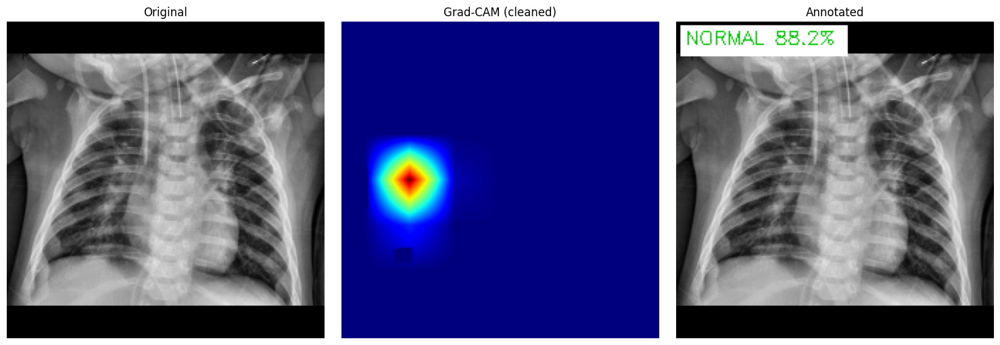

Prediction  : NORMAL
Confidence  : 88.21%


In [ ]:
sample_dir = "/content/data/chest_xray/test/PNEUMONIA"
sample_img_name = os.listdir(sample_dir)[0]  # wahi pehli image (bilateral wala case)
sample_img_path = os.path.join(sample_dir, sample_img_name)

results = analyze_xray(sample_img_path, model)

for r in results:
    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title("Original"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM (cleaned)"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()

    print("="*60)
    print(f"Prediction  : {rep['prediction']}")
    print(f"Confidence  : {rep['confidence']}%")
    if rep['prediction'] == "PNEUMONIA":
        print(f"Laterality  : {rep['laterality']}")
        print(f"  Right: {rep['right_lung_pct']}% | Left: {rep['left_lung_pct']}%")
        print(f"Affected Area: {rep['affected_area_pct']}%")
        print(f"Severity    : {rep['severity']}")
        print(f"Regions detected: {len(rep['regions'])}")
        for reg in rep['regions']:
            print(f"  - {reg['side']}: {reg['area_pct']}%")
    print("="*60)

In [ ]:
# Pehle dekhte hain kaunsi files available hain (sorted, taake consistent ho)
sample_dir = "/content/data/chest_xray/test/PNEUMONIA"
all_files_sorted = sorted(os.listdir(sample_dir))
print("First 5 files (sorted):", all_files_sorted[:5])

First 5 files (sorted): ['person100_bacteria_475.jpeg', 'person100_bacteria_477.jpeg', 'person100_bacteria_478.jpeg', 'person100_bacteria_479.jpeg', 'person100_bacteria_480.jpeg']


Testing: person100_bacteria_475.jpeg


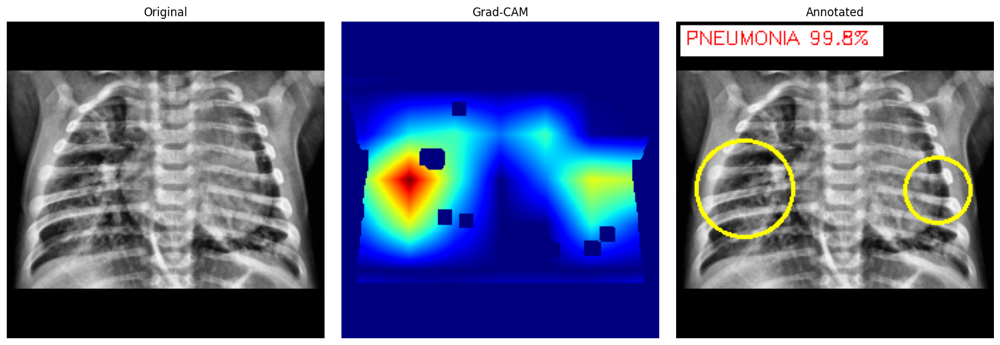

Prediction  : PNEUMONIA
Confidence  : 99.77%
Laterality  : Predominantly Right Lung (minor left involvement)
  Right: 73.8% | Left: 26.2%
Affected Area: 7.59%
Severity    : Mild
Regions detected: 2
  - Patient's RIGHT Lung: 5.92%
  - Patient's LEFT Lung: 1.87%


In [ ]:
sample_img_name = all_files_sorted[0]  # ab hamesha yehi image aayegi (alphabetically sorted)
sample_img_path = os.path.join(sample_dir, sample_img_name)
print(f"Testing: {sample_img_name}")

results = analyze_xray(sample_img_path, model)

for r in results:
    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title("Original"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()

    print("="*60)
    print(f"Prediction  : {rep['prediction']}")
    print(f"Confidence  : {rep['confidence']}%")
    if rep['prediction'] == "PNEUMONIA":
        print(f"Laterality  : {rep['laterality']}")
        print(f"  Right: {rep['right_lung_pct']}% | Left: {rep['left_lung_pct']}%")
        print(f"Affected Area: {rep['affected_area_pct']}%")
        print(f"Severity    : {rep['severity']}")
        print(f"Regions detected: {len(rep['regions'])}")
        for reg in rep['regions']:
            print(f"  - {reg['side']}: {reg['area_pct']}%")
    print("="*60)

In [ ]:
def detect_laterality(heatmap, hot_percentile=85, dominant_threshold=0.70, strong_threshold=0.80):
    h, w = heatmap.shape
    nonzero_vals = heatmap[heatmap > 0]
    threshold_val = np.percentile(nonzero_vals, hot_percentile) if len(nonzero_vals) > 0 else 0
    hot_mask = (heatmap >= threshold_val).astype(np.uint8)
    hot_mask[heatmap == 0] = 0
    mid = w // 2
    left_half_hot = np.sum(hot_mask[:, :mid])
    right_half_hot = np.sum(hot_mask[:, mid:])
    total_hot = left_half_hot + right_half_hot

    if total_hot == 0:
        return {"laterality": "N/A", "patient_right_involvement_pct": 0.0, "patient_left_involvement_pct": 0.0}

    image_left_pct = left_half_hot / total_hot
    image_right_pct = right_half_hot / total_hot

    if image_left_pct >= strong_threshold:
        laterality = "Unilateral - Patient's RIGHT Lung"
    elif image_right_pct >= strong_threshold:
        laterality = "Unilateral - Patient's LEFT Lung"
    elif image_left_pct >= dominant_threshold:
        laterality = "Predominantly Right Lung (minor left involvement)"
    elif image_right_pct >= dominant_threshold:
        laterality = "Predominantly Left Lung (minor right involvement)"
    else:
        laterality = "Bilateral (Both Lungs)"

    return {
        "laterality": laterality,
        "patient_right_involvement_pct": round(image_left_pct * 100, 1),
        "patient_left_involvement_pct": round(image_right_pct * 100, 1)
    }

print("✅ Refined 3-tier laterality function ready")

✅ Refined 3-tier laterality function ready


In [ ]:
# Setup file mein laterality function update karein
setup_code_updated = open(f'{project_folder}/fyp_setup.py').read()

old_function_marker = "def detect_laterality(heatmap, hot_percentile=85, dominant_threshold=0.70):"
new_function = '''def detect_laterality(heatmap, hot_percentile=85, dominant_threshold=0.70, strong_threshold=0.80):
    h, w = heatmap.shape
    nonzero_vals = heatmap[heatmap > 0]
    threshold_val = np.percentile(nonzero_vals, hot_percentile) if len(nonzero_vals) > 0 else 0
    hot_mask = (heatmap >= threshold_val).astype(np.uint8)
    hot_mask[heatmap == 0] = 0
    mid = w // 2
    left_half_hot = np.sum(hot_mask[:, :mid])
    right_half_hot = np.sum(hot_mask[:, mid:])
    total_hot = left_half_hot + right_half_hot
    if total_hot == 0:
        return {"laterality": "N/A", "patient_right_involvement_pct": 0.0, "patient_left_involvement_pct": 0.0}
    image_left_pct = left_half_hot / total_hot
    image_right_pct = right_half_hot / total_hot
    if image_left_pct >= strong_threshold:
        laterality = "Unilateral - Patient's RIGHT Lung"
    elif image_right_pct >= strong_threshold:
        laterality = "Unilateral - Patient's LEFT Lung"
    elif image_left_pct >= dominant_threshold:
        laterality = "Predominantly Right Lung (minor left involvement)"
    elif image_right_pct >= dominant_threshold:
        laterality = "Predominantly Left Lung (minor right involvement)"
    else:
        laterality = "Bilateral (Both Lungs)"
    return {
        "laterality": laterality,
        "patient_right_involvement_pct": round(image_left_pct * 100, 1),
        "patient_left_involvement_pct": round(image_right_pct * 100, 1)
    }'''

# Purani function ko dhoond kar naye se replace karein
import re
pattern = r"def detect_laterality\(heatmap.*?return \{[^}]*\}"
setup_code_updated = re.sub(pattern, new_function, setup_code_updated, flags=re.DOTALL)

with open(f'{project_folder}/fyp_setup.py', 'w') as f:
    f.write(setup_code_updated)

print("✅ Setup file updated with refined laterality function")

✅ Setup file updated with refined laterality function


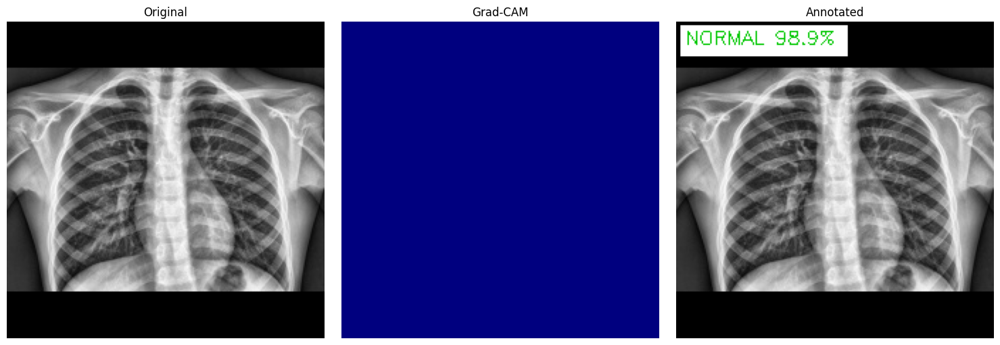

Prediction: NORMAL (98.86%)


In [ ]:
normal_dir = "/content/data/chest_xray/test/NORMAL"
normal_files_sorted = sorted(os.listdir(normal_dir))
sample_img_path = os.path.join(normal_dir, normal_files_sorted[0])

results = analyze_xray(sample_img_path, model)

for r in results:
    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title("Original"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()

    print(f"Prediction: {rep['prediction']} ({rep['confidence']}%)")

In [ ]:
print("\n--- OOD Test ---")
results_ood = analyze_xray('/content/test_synthetic_photo.jpg', model)
for r in results_ood:
    if "error" in r:
        print("✅", r["error"])

print("\n--- Dual Panel Test ---")
results_dual = analyze_xray('/content/test_dual_panel.jpg', model)
for r in results_dual:
    rep = r["report"]
    print(f"Panel {rep['panel_number']}: {rep['prediction']} ({rep['confidence']}%)")


--- OOD Test ---
✅ Could not read image file

--- Dual Panel Test ---


KeyError: 'report'

In [ ]:
# Synthetic OOD test image dobara banayein
np.random.seed(42)
synthetic_photo = np.zeros((300, 300, 3), dtype=np.uint8)
synthetic_photo[:100, :, 0] = 200
synthetic_photo[:100, :, 1] = 50
synthetic_photo[:100, :, 2] = 50
synthetic_photo[100:200, :, 0] = 30
synthetic_photo[100:200, :, 1] = 180
synthetic_photo[100:200, :, 2] = 40
synthetic_photo[200:, :, 0] = 40
synthetic_photo[200:, :, 1] = 60
synthetic_photo[200:, :, 2] = 200
noise = np.random.randint(0, 40, synthetic_photo.shape, dtype=np.uint8)
synthetic_photo = cv2.add(synthetic_photo, noise)
cv2.imwrite('/content/test_synthetic_photo.jpg', synthetic_photo)

# Dual-panel test image dobara banayein
img1_path = os.path.join("/content/data/chest_xray/test/PNEUMONIA", sorted(os.listdir("/content/data/chest_xray/test/PNEUMONIA"))[0])
img2_path = os.path.join("/content/data/chest_xray/test/NORMAL", sorted(os.listdir("/content/data/chest_xray/test/NORMAL"))[0])
img1 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread(img2_path, cv2.IMREAD_GRAYSCALE)
common_h = 400
img1_r = cv2.resize(img1, (int(img1.shape[1]*common_h/img1.shape[0]), common_h))
img2_r = cv2.resize(img2, (int(img2.shape[1]*common_h/img2.shape[0]), common_h))
separator = np.zeros((common_h, 15), dtype=np.uint8)
dual_panel_img = np.hstack([img1_r, separator, img2_r])
cv2.imwrite('/content/test_dual_panel.jpg', dual_panel_img)

print("✅ Test images recreated")

✅ Test images recreated


In [ ]:
print("\n--- OOD Test ---")
results_ood = analyze_xray('/content/test_synthetic_photo.jpg', model)
for r in results_ood:
    if "error" in r:
        print("✅", r["error"])

print("\n--- Dual Panel Test ---")
results_dual = analyze_xray('/content/test_dual_panel.jpg', model)
for r in results_dual:
    rep = r["report"]
    print(f"Panel {rep['panel_number']}: {rep['prediction']} ({rep['confidence']}%)")


--- OOD Test ---
✅ REJECTED — non-medical/OOD image detected

--- Dual Panel Test ---
Panel 1: PNEUMONIA (99.74%)
Panel 2: NORMAL (99.4%)


In [ ]:
!ls -lh /content/drive/MyDrive/FYP_Pneumonia_XAI/

total 2.4G
-rw------- 1 root root  32M Aug 28 06:35 best_model_finetuned.keras
-rw------- 1 root root  32M Aug 28 05:43 best_model_phase1.keras
-rw------- 1 root root 2.3G Aug 28 05:03 chest-xray-pneumonia.zip
-rw------- 1 root root  49K Aug 28 06:55 confusion_matrix_comparison.png
-rw------- 1 root root  15K Aug 29 09:57 fyp_setup.py
-rw------- 1 root root 243K Aug 28 07:43 gradcam_annotated_sample.png
-rw------- 1 root root 4.4K Aug 29 05:05 gradcam_multicircle_sample.png
-rw------- 1 root root 219K Aug 28 07:26 gradcam_sample.png
-rw------- 1 root root  265 Aug 28 06:55 inference_config.json
-rw------- 1 root root  32M Aug 28 06:44 pneumonia_densenet121_final.keras
-rw------- 1 root root  61K Aug 28 06:56 roc_curve.png
-rw------- 1 root root 1.2K Aug 28 06:44 training_history.pkl


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

project_folder = '/content/drive/MyDrive/FYP_Pneumonia_XAI'
exec(open(f'{project_folder}/fyp_setup.py').read())

Mounted at /content/drive
✅ Everything loaded from saved setup file!


In [ ]:
!unzip -q /content/drive/MyDrive/FYP_Pneumonia_XAI/chest-xray-pneumonia.zip -d /content/data

In [ ]:
print("Model:", model is not None)
print("Threshold:", CALIBRATED_THRESHOLD)

Model: True
Threshold: 0.72


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving WhatsApp Image 2026-08-09 at 8.03.55 PM.jpeg to WhatsApp Image 2026-08-09 at 8.03.55 PM.jpeg


Uploaded: WhatsApp Image 2026-08-09 at 8.03.55 PM.jpeg


/usr/local/lib/python3.13/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


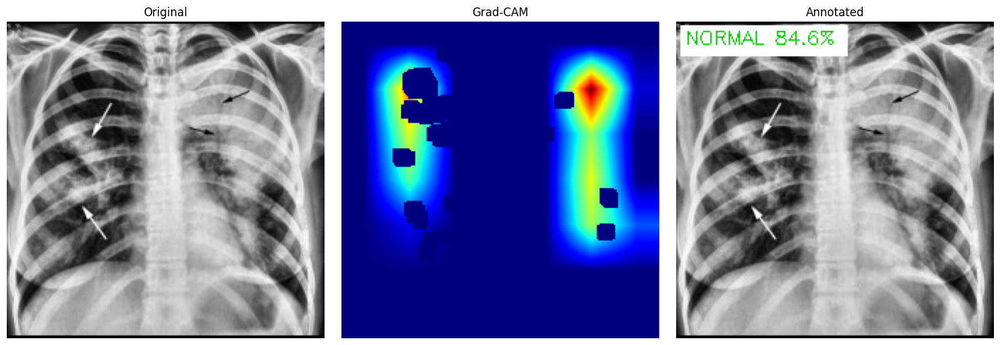

Prediction   : NORMAL
Confidence   : 84.61%


In [ ]:
uploaded_filename = list(uploaded.keys())[0]
print(f"Uploaded: {uploaded_filename}")

results = analyze_xray(uploaded_filename, model)

for r in results:
    if "error" in r:
        print("⚠️", r["error"])
        continue

    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title("Original"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()

    print("="*60)
    print(f"Prediction   : {rep['prediction']}")
    print(f"Confidence   : {rep['confidence']}%")
    if rep['prediction'] == "PNEUMONIA":
        print(f"Laterality   : {rep['laterality']}")
        print(f"  Right: {rep['right_lung_pct']}% | Left: {rep['left_lung_pct']}%")
        print(f"Affected Area: {rep['affected_area_pct']}%")
        print(f"Severity     : {rep['severity']}")
        print(f"Regions detected: {len(rep['regions'])}")
    print("="*60)

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving nature.jpg to nature.jpg


Uploaded: nature.jpg


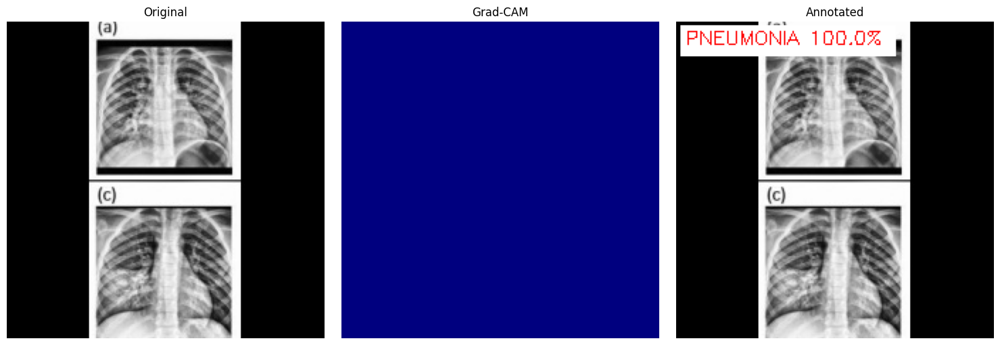

Prediction   : PNEUMONIA
Confidence   : 100.0%
Laterality   : N/A
Affected Area: 0.0%
Severity     : Mild


In [ ]:
uploaded_filename = list(uploaded.keys())[0]
print(f"Uploaded: {uploaded_filename}")

results = analyze_xray(uploaded_filename, model)

for r in results:
    if "error" in r:
        print("⚠️", r["error"])
        continue

    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title("Original"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()

    print("="*60)
    print(f"Prediction   : {rep['prediction']}")
    print(f"Confidence   : {rep['confidence']}%")
    if rep['prediction'] == "PNEUMONIA":
        print(f"Laterality   : {rep['laterality']}")
        print(f"Affected Area: {rep['affected_area_pct']}%")
        print(f"Severity     : {rep['severity']}")
    print("="*60)

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving combine.jpg to combine.jpg


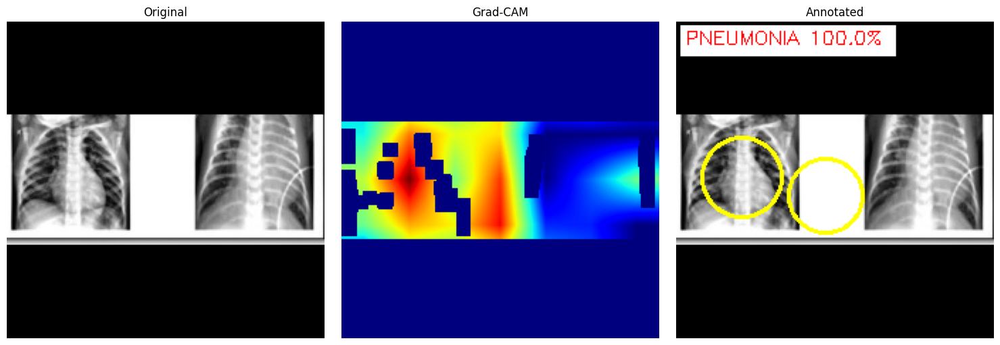

Prediction: PNEUMONIA (100.0%)
Laterality: Unilateral - Patient's RIGHT Lung, Severity: Mild


In [ ]:
uploaded_filename = list(uploaded.keys())[0]
results = analyze_xray(uploaded_filename, model)

for r in results:
    if "error" in r:
        print("⚠️", r["error"])
        continue
    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title("Original"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()
    print(f"Prediction: {rep['prediction']} ({rep['confidence']}%)")
    if rep['prediction'] == "PNEUMONIA":
        print(f"Laterality: {rep.get('laterality','N/A')}, Severity: {rep.get('severity','N/A')}")

In [ ]:
def get_content_mask(gray_img, erode_px=10):
    # White (bright, >240) aur black (dark, <15) dono ko "non-content/gap" treat karein
    content_mask = ((gray_img > 15) & (gray_img < 245)).astype(np.uint8)
    kernel = np.ones((erode_px, erode_px), np.uint8)
    content_mask_eroded = cv2.erode(content_mask, kernel, iterations=1)
    return content_mask_eroded

print("✅ Content mask updated — ab white gaps bhi exclude honge")

✅ Content mask updated — ab white gaps bhi exclude honge


In [ ]:
def is_ood_image_v2(image_bgr, saturation_threshold=25):
    """
    Improved OOD detection: pseudocolor X-rays ko differentiate karta hai
    genuine non-medical photos se, structural symmetry check karke.
    Returns: (is_ood, is_pseudocolor, saturation, symmetry_score)
    """
    hsv = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2HSV)
    mean_saturation = np.mean(hsv[:,:,1])

    # Agar saturation kam hai, seedha grayscale X-ray hai — OOD nahi
    if mean_saturation <= saturation_threshold:
        return False, False, mean_saturation, None

    # Saturation zyada hai — ab check karein ye pseudocolor X-ray hai ya random photo
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
    h, w = gray.shape

    # Symmetry Check: X-rays (chahe pseudocolor bhi hon) left-right mein roughly symmetric hote hain
    # (lungs dono taraf, spine beech mein) - random photos aksar symmetric nahi hote
    left_half = gray[:, :w//2]
    right_half = cv2.flip(gray[:, w//2:], 1)

    # Same size banayein comparison ke liye
    min_w = min(left_half.shape[1], right_half.shape[1])
    left_half = cv2.resize(left_half, (min_w, h))
    right_half = cv2.resize(right_half, (min_w, h))

    # Structural similarity (simple correlation-based)
    diff = np.abs(left_half.astype(np.float32) - right_half.astype(np.float32))
    symmetry_score = 1 - (np.mean(diff) / 255.0)  # 1 = perfectly symmetric, 0 = not at all

    # Pseudocolor X-ray: high saturation BUT high symmetry (>0.6 threshold)
    is_pseudocolor = symmetry_score > 0.6

    if is_pseudocolor:
        return False, True, mean_saturation, symmetry_score  # NOT OOD, mark as pseudocolor
    else:
        return True, False, mean_saturation, symmetry_score  # Genuine OOD (random photo)

print("✅ Improved OOD + pseudocolor detection ready")

✅ Improved OOD + pseudocolor detection ready


In [ ]:
def preprocess_pipeline_v2(image_path, target_size=224, apply_split=True):
    """
    Updated pipeline: pseudocolor X-rays ko grayscale mein normalize karta hai,
    sirf genuine non-medical images ko reject karta hai.
    """
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        raise ValueError(f"Could not read image: {image_path}")

    ood_flag, is_pseudocolor, sat, symmetry = is_ood_image_v2(img_bgr)

    if ood_flag:
        return {"ood": True, "panels": [], "saturation": sat, "pseudocolor": False}

    # Grayscale conversion — chahe normal X-ray ho ya pseudocolor, dono ke liye same
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    panels = detect_and_split_panels(gray) if apply_split else [gray]

    processed_panels = []
    for p in panels:
        p = strip_artifacts(p)
        p = apply_clahe(p)
        p = letterbox_resize(p, target_size)
        processed_panels.append(p)

    return {
        "ood": False,
        "panels": processed_panels,
        "saturation": sat,
        "pseudocolor": is_pseudocolor
    }

print("✅ Updated preprocessing pipeline (pseudocolor-aware) ready")

✅ Updated preprocessing pipeline (pseudocolor-aware) ready


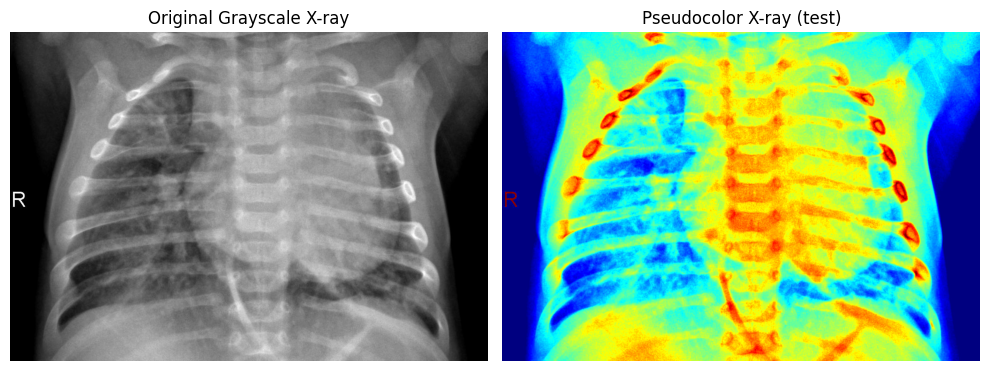


OOD Detected: False
Identified as Pseudocolor: True
Panels: 1
✅ SUCCESS — Pseudocolor X-ray correctly NOT rejected, converted to grayscale


In [ ]:
sample_path = os.path.join("/content/data/chest_xray/test/PNEUMONIA", sorted(os.listdir("/content/data/chest_xray/test/PNEUMONIA"))[0])
gray_xray = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)

# Pseudocolor version banayein (jaise DICOM "hot" colormap)
pseudocolor_xray = cv2.applyColorMap(gray_xray, cv2.COLORMAP_JET)
cv2.imwrite('/content/test_pseudocolor_xray.jpg', pseudocolor_xray)

fig, axes = plt.subplots(1, 2, figsize=(10,5))
axes[0].imshow(gray_xray, cmap='gray'); axes[0].set_title("Original Grayscale X-ray"); axes[0].axis('off')
axes[1].imshow(cv2.cvtColor(pseudocolor_xray, cv2.COLOR_BGR2RGB)); axes[1].set_title("Pseudocolor X-ray (test)"); axes[1].axis('off')
plt.tight_layout()
plt.show()

# Ab test karein
result = preprocess_pipeline_v2('/content/test_pseudocolor_xray.jpg')
print(f"\nOOD Detected: {result['ood']}")
print(f"Identified as Pseudocolor: {result['pseudocolor']}")
print(f"Panels: {len(result['panels'])}")

if not result['ood']:
    print("✅ SUCCESS — Pseudocolor X-ray correctly NOT rejected, converted to grayscale")

In [ ]:
!unzip -q /content/drive/MyDrive/FYP_Pneumonia_XAI/chest-xray-pneumonia.zip -d /content/data
print("✅ Dataset extracted")

✅ Dataset extracted


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

project_folder = '/content/drive/MyDrive/FYP_Pneumonia_XAI'
exec(open(f'{project_folder}/fyp_setup.py').read())

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Everything loaded from saved setup file!


In [ ]:
result_ood_check = preprocess_pipeline_v2('/content/test_synthetic_photo.jpg')
print(f"OOD Detected: {result_ood_check['ood']}")

if result_ood_check['ood']:
    print("✅ SUCCESS — Random photo still correctly rejected")
else:
    print("❌ PROBLEM — Random photo wrongly accepted now!")

ValueError: Could not read image: /content/test_synthetic_photo.jpg

In [ ]:
np.random.seed(42)
synthetic_photo = np.zeros((300, 300, 3), dtype=np.uint8)
synthetic_photo[:100, :, 0] = 200
synthetic_photo[:100, :, 1] = 50
synthetic_photo[:100, :, 2] = 50
synthetic_photo[100:200, :, 0] = 30
synthetic_photo[100:200, :, 1] = 180
synthetic_photo[100:200, :, 2] = 40
synthetic_photo[200:, :, 0] = 40
synthetic_photo[200:, :, 1] = 60
synthetic_photo[200:, :, 2] = 200
noise = np.random.randint(0, 40, synthetic_photo.shape, dtype=np.uint8)
synthetic_photo = cv2.add(synthetic_photo, noise)
cv2.imwrite('/content/test_synthetic_photo.jpg', synthetic_photo)
print("✅ Synthetic test image recreated")

✅ Synthetic test image recreated


In [ ]:
result_ood_check = preprocess_pipeline_v2('/content/test_synthetic_photo.jpg')
print(f"OOD Detected: {result_ood_check['ood']}")

if result_ood_check['ood']:
    print("✅ SUCCESS — Random photo still correctly rejected")
else:
    print("❌ PROBLEM — Random photo wrongly accepted now!")

OOD Detected: False
❌ PROBLEM — Random photo wrongly accepted now!


In [ ]:
def is_ood_image_v2(image_bgr, saturation_threshold=25, texture_threshold=15):
    """
    Improved OOD detection: pseudocolor X-rays ko differentiate karta hai
    genuine non-medical photos se — symmetry AND texture/detail dono check karke.
    """
    hsv = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2HSV)
    mean_saturation = np.mean(hsv[:,:,1])

    if mean_saturation <= saturation_threshold:
        return False, False, mean_saturation, None

    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
    h, w = gray.shape

    # Check 1: Symmetry (X-rays left-right roughly symmetric hote hain)
    left_half = gray[:, :w//2]
    right_half = cv2.flip(gray[:, w//2:], 1)
    min_w = min(left_half.shape[1], right_half.shape[1])
    left_half = cv2.resize(left_half, (min_w, h))
    right_half = cv2.resize(right_half, (min_w, h))
    diff = np.abs(left_half.astype(np.float32) - right_half.astype(np.float32))
    symmetry_score = 1 - (np.mean(diff) / 255.0)

    # Check 2: Texture/Detail — X-rays mein fine detail hoti hai (ribs, bones)
    # Laplacian variance high detail/edges detect karta hai; flat color blocks mein ye kam hoga
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)
    texture_score = laplacian.var()

    # Pseudocolor X-ray: high symmetry AND high texture/detail dono chahiye
    is_pseudocolor = (symmetry_score > 0.6) and (texture_score > texture_threshold)

    if is_pseudocolor:
        return False, True, mean_saturation, symmetry_score
    else:
        return True, False, mean_saturation, symmetry_score

print("✅ Improved OOD detection (symmetry + texture) ready")

✅ Improved OOD detection (symmetry + texture) ready


In [ ]:
# Test 1: Pseudocolor X-ray (asal X-ray se banaya) — accept hona chahiye
result1 = preprocess_pipeline_v2('/content/test_pseudocolor_xray.jpg')
print(f"Pseudocolor X-ray -> OOD: {result1['ood']}, Pseudocolor: {result1.get('pseudocolor')}")

# Test 2: Random synthetic photo (flat color blocks) — reject hona chahiye
result2 = preprocess_pipeline_v2('/content/test_synthetic_photo.jpg')
print(f"Random Photo -> OOD: {result2['ood']}")

print()
if not result1['ood'] and result2['ood']:
    print("✅ BOTH CORRECT — Pseudocolor accepted, random photo rejected")
else:
    print("⚠️ Still an issue — check individual results above")

Pseudocolor X-ray -> OOD: False, Pseudocolor: True
Random Photo -> OOD: False

⚠️ Still an issue — check individual results above


In [ ]:
def debug_ood_scores(image_path, saturation_threshold=25):
    img_bgr = cv2.imread(image_path)
    hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
    mean_saturation = np.mean(hsv[:,:,1])

    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    h, w = gray.shape
    left_half = gray[:, :w//2]
    right_half = cv2.flip(gray[:, w//2:], 1)
    min_w = min(left_half.shape[1], right_half.shape[1])
    left_half = cv2.resize(left_half, (min_w, h))
    right_half = cv2.resize(right_half, (min_w, h))
    diff = np.abs(left_half.astype(np.float32) - right_half.astype(np.float32))
    symmetry_score = 1 - (np.mean(diff) / 255.0)

    laplacian = cv2.Laplacian(gray, cv2.CV_64F)
    texture_score = laplacian.var()

    print(f"File: {image_path}")
    print(f"  Saturation: {mean_saturation:.2f}")
    print(f"  Symmetry: {symmetry_score:.3f}")
    print(f"  Texture (Laplacian var): {texture_score:.2f}")
    print()

debug_ood_scores('/content/test_pseudocolor_xray.jpg')
debug_ood_scores('/content/test_synthetic_photo.jpg')

File: /content/test_pseudocolor_xray.jpg
  Saturation: 222.05
  Symmetry: 0.874
  Texture (Laplacian var): 76.64

File: /content/test_synthetic_photo.jpg
  Saturation: 184.80
  Symmetry: 0.964
  Texture (Laplacian var): 1350.40



In [ ]:
def is_ood_image_v2(image_bgr, saturation_threshold=25, texture_min=15, texture_max=500):
    hsv = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2HSV)
    mean_saturation = np.mean(hsv[:,:,1])

    if mean_saturation <= saturation_threshold:
        return False, False, mean_saturation, None

    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
    h, w = gray.shape

    left_half = gray[:, :w//2]
    right_half = cv2.flip(gray[:, w//2:], 1)
    min_w = min(left_half.shape[1], right_half.shape[1])
    left_half = cv2.resize(left_half, (min_w, h))
    right_half = cv2.resize(right_half, (min_w, h))
    diff = np.abs(left_half.astype(np.float32) - right_half.astype(np.float32))
    symmetry_score = 1 - (np.mean(diff) / 255.0)

    laplacian = cv2.Laplacian(gray, cv2.CV_64F)
    texture_score = laplacian.var()

    # Pseudocolor X-ray: high symmetry AND texture ek "reasonable/structured" range mein ho
    # (bohot kam = flat/blank, bohot zyada = random noise/chaos)
    is_pseudocolor = (symmetry_score > 0.75) and (texture_min <= texture_score <= texture_max)

    if is_pseudocolor:
        return False, True, mean_saturation, symmetry_score
    else:
        return True, False, mean_saturation, symmetry_score

print("✅ Refined OOD detection (texture range-based) ready")

✅ Refined OOD detection (texture range-based) ready


In [ ]:
result1 = preprocess_pipeline_v2('/content/test_pseudocolor_xray.jpg')
print(f"Pseudocolor X-ray -> OOD: {result1['ood']}, Pseudocolor: {result1.get('pseudocolor')}")

result2 = preprocess_pipeline_v2('/content/test_synthetic_photo.jpg')
print(f"Random Photo -> OOD: {result2['ood']}")

print()
if not result1['ood'] and result2['ood']:
    print("✅ BOTH CORRECT")
else:
    print("⚠️ Still an issue")

Pseudocolor X-ray -> OOD: False, Pseudocolor: True
Random Photo -> OOD: True

✅ BOTH CORRECT


In [ ]:
import random

test_dirs = ["/content/data/chest_xray/test/NORMAL", "/content/data/chest_xray/test/PNEUMONIA"]
print("SANITY CHECK: Real X-rays should still NOT be flagged as OOD")
print("="*60)

all_pass = True
for d in test_dirs:
    files = random.sample(os.listdir(d), 3)
    for f in files:
        path = os.path.join(d, f)
        img_bgr = cv2.imread(path)
        ood_flag, is_pc, sat, sym = is_ood_image_v2(img_bgr)
        status = "❌ WRONGLY REJECTED" if ood_flag else "✅ Correctly accepted"
        if ood_flag:
            all_pass = False
        print(f"{f[:30]:30s} | Sat: {sat:6.2f} | {status}")

print("="*60)
print("ALL PASSED ✅" if all_pass else "SOME FAILED ❌")

SANITY CHECK: Real X-rays should still NOT be flagged as OOD
NORMAL2-IM-0274-0001.jpeg      | Sat:   0.00 | ✅ Correctly accepted
NORMAL2-IM-0139-0001.jpeg      | Sat:   0.00 | ✅ Correctly accepted
NORMAL2-IM-0150-0001.jpeg      | Sat:   0.00 | ✅ Correctly accepted
person1659_virus_2867.jpeg     | Sat:   0.00 | ✅ Correctly accepted
person113_bacteria_540.jpeg    | Sat:   0.00 | ✅ Correctly accepted
person8_virus_28.jpeg          | Sat:   0.00 | ✅ Correctly accepted
ALL PASSED ✅


In [ ]:
def analyze_xray(image_path, model, threshold=0.72, img_size=224):
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        return [{"error": "Could not read image file"}]

    ood_flag, is_pseudocolor, sat, sym = is_ood_image_v2(img_bgr)
    if ood_flag:
        return [{"error": "REJECTED — non-medical/OOD image detected",
                  "saturation": round(float(sat),2)}]

    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    panels_raw = detect_and_split_panels(gray)

    results = []
    for idx, panel in enumerate(panels_raw, 1):
        panel_clean = strip_artifacts(panel)
        panel_clahe = apply_clahe(panel_clean)
        panel_final = letterbox_resize(panel_clahe, img_size)
        temp_path = f'/content/temp_panel_{idx}.jpg'
        cv2.imwrite(temp_path, panel_final)

        original, heatmap, annotated_img, report = full_diagnosis_report(temp_path, model, threshold)
        report["panel_number"] = idx
        report["total_panels_detected"] = len(panels_raw)
        report["was_pseudocolor"] = is_pseudocolor
        results.append({"report": report, "original": original, "heatmap": heatmap, "annotated": annotated_img})

    return results

print("✅ analyze_xray updated with pseudocolor-aware OOD detection")

✅ analyze_xray updated with pseudocolor-aware OOD detection


In [ ]:
setup_code = open(f'{project_folder}/fyp_setup.py').read()

# Naye functions add karein (append at the end, purane is_ood_image ko override karte hue)
additional_code = '''

# ============ PSEUDOCOLOR-AWARE OOD DETECTION (v2) ============
def is_ood_image_v2(image_bgr, saturation_threshold=25, texture_min=15, texture_max=500):
    hsv = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2HSV)
    mean_saturation = np.mean(hsv[:,:,1])
    if mean_saturation <= saturation_threshold:
        return False, False, mean_saturation, None
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
    h, w = gray.shape
    left_half = gray[:, :w//2]
    right_half = cv2.flip(gray[:, w//2:], 1)
    min_w = min(left_half.shape[1], right_half.shape[1])
    left_half = cv2.resize(left_half, (min_w, h))
    right_half = cv2.resize(right_half, (min_w, h))
    diff = np.abs(left_half.astype(np.float32) - right_half.astype(np.float32))
    symmetry_score = 1 - (np.mean(diff) / 255.0)
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)
    texture_score = laplacian.var()
    is_pseudocolor = (symmetry_score > 0.75) and (texture_min <= texture_score <= texture_max)
    if is_pseudocolor:
        return False, True, mean_saturation, symmetry_score
    else:
        return True, False, mean_saturation, symmetry_score

def analyze_xray(image_path, model, threshold=0.72, img_size=224):
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        return [{"error": "Could not read image file"}]
    ood_flag, is_pseudocolor, sat, sym = is_ood_image_v2(img_bgr)
    if ood_flag:
        return [{"error": "REJECTED — non-medical/OOD image detected",
                  "saturation": round(float(sat),2)}]
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    panels_raw = detect_and_split_panels(gray)
    results = []
    for idx, panel in enumerate(panels_raw, 1):
        panel_clean = strip_artifacts(panel)
        panel_clahe = apply_clahe(panel_clean)
        panel_final = letterbox_resize(panel_clahe, img_size)
        temp_path = f'/content/temp_panel_{idx}.jpg'
        cv2.imwrite(temp_path, panel_final)
        original, heatmap, annotated_img, report = full_diagnosis_report(temp_path, model, threshold)
        report["panel_number"] = idx
        report["total_panels_detected"] = len(panels_raw)
        report["was_pseudocolor"] = is_pseudocolor
        results.append({"report": report, "original": original, "heatmap": heatmap, "annotated": annotated_img})
    return results

print("Pseudocolor-aware OOD detection loaded (v2)")
'''

setup_code_updated = setup_code + additional_code

with open(f'{project_folder}/fyp_setup.py', 'w') as f:
    f.write(setup_code_updated)

print("✅ Setup file permanently updated with pseudocolor detection")

✅ Setup file permanently updated with pseudocolor detection


In [ ]:
def calculate_severity_rale(regions_info, total_pixels, laterality):
    """
    RALE-inspired severity scoring: har lung (regions) ka alag score nikalta hai (0-4),
    phir unko combine karke overall severity deta hai.
    """
    # Har region ka RALE-style score (0-4) nikalein based on uska % area
    def rale_component_score(area_pct):
        if area_pct == 0:
            return 0
        elif area_pct <= 5:
            return 1
        elif area_pct <= 12:
            return 2
        elif area_pct <= 20:
            return 3
        else:
            return 4

    right_regions = [r for r in regions_info if "RIGHT" in r['side']]
    left_regions = [r for r in regions_info if "LEFT" in r['side']]

    right_pct = sum(r['area_pct'] for r in right_regions)
    left_pct = sum(r['area_pct'] for r in left_regions)

    right_score = rale_component_score(right_pct)
    left_score = rale_component_score(left_pct)

    total_rale_score = right_score + left_score  # 0 to 8 scale

    # Total score ko severity label mein convert karein
    if total_rale_score == 0:
        severity = "None"
    elif total_rale_score <= 2:
        severity = "Mild"
    elif total_rale_score <= 5:
        severity = "Moderate"
    else:
        severity = "Severe"

    note = (f"RALE-inspired scoring: Right lung score={right_score}/4, "
            f"Left lung score={left_score}/4, Total={total_rale_score}/8. "
            f"Bilateral involvement contributes cumulatively to total severity score.")

    return severity, total_rale_score, right_score, left_score, note

print("✅ RALE-aligned severity function ready")

✅ RALE-aligned severity function ready


In [ ]:
def full_diagnosis_report(img_path, model, threshold=0.72):
    original, heatmap, overlay, pred_prob = overlay_gradcam(img_path, model)
    heatmap = clean_heatmap(original, heatmap)
    annotated_img, affected_percent, regions_info = annotate_and_analyze(original, heatmap, pred_prob, threshold)

    report = {
        "prediction": "PNEUMONIA" if pred_prob >= threshold else "NORMAL",
        "confidence": round(float(pred_prob)*100, 2) if pred_prob >= threshold else round(float(1-pred_prob)*100, 2),
    }

    if pred_prob >= threshold:
        lat_result = detect_laterality(heatmap)
        total_pixels = heatmap.shape[0] * heatmap.shape[1]
        severity, rale_total, rale_right, rale_left, severity_note = calculate_severity_rale(regions_info, total_pixels, lat_result['laterality'])

        report.update({
            "laterality": lat_result['laterality'],
            "right_lung_pct": lat_result['patient_right_involvement_pct'],
            "left_lung_pct": lat_result['patient_left_involvement_pct'],
            "affected_area_pct": affected_percent,
            "severity": severity,
            "rale_score_total": f"{rale_total}/8",
            "rale_score_right": f"{rale_right}/4",
            "rale_score_left": f"{rale_left}/4",
            "severity_note": severity_note,
            "regions": regions_info
        })

    return original, heatmap, annotated_img, report

print("✅ Full diagnosis report updated with RALE scoring")

✅ Full diagnosis report updated with RALE scoring


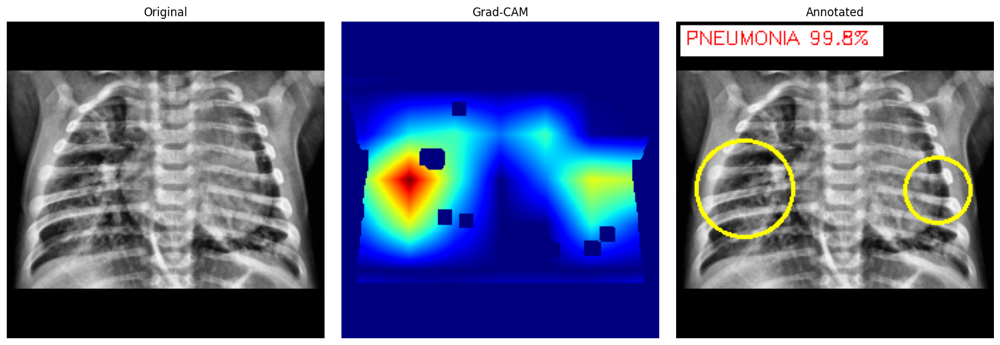

Prediction    : PNEUMONIA (99.77%)
Laterality    : Predominantly Right Lung (minor left involvement)
RALE Score    : Total 3/8 (Right: 2/4, Left: 1/4)
Severity      : Moderate
Note          : RALE-inspired scoring: Right lung score=2/4, Left lung score=1/4, Total=3/8. Bilateral involvement contributes cumulatively to total severity score.


In [ ]:
sample_dir = "/content/data/chest_xray/test/PNEUMONIA"
sample_img_name = sorted(os.listdir(sample_dir))[0]
sample_img_path = os.path.join(sample_dir, sample_img_name)

results = analyze_xray(sample_img_path, model)

for r in results:
    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title("Original"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()

    print("="*65)
    print(f"Prediction    : {rep['prediction']} ({rep['confidence']}%)")
    if rep['prediction'] == "PNEUMONIA":
        print(f"Laterality    : {rep['laterality']}")
        print(f"RALE Score    : Total {rep['rale_score_total']} (Right: {rep['rale_score_right']}, Left: {rep['rale_score_left']})")
        print(f"Severity      : {rep['severity']}")
        print(f"Note          : {rep['severity_note']}")
    print("="*65)

In [ ]:
setup_code = open(f'{project_folder}/fyp_setup.py').read()

additional_code_rale = '''

# ============ RALE-ALIGNED SEVERITY SCORING ============
def calculate_severity_rale(regions_info, total_pixels, laterality):
    def rale_component_score(area_pct):
        if area_pct == 0:
            return 0
        elif area_pct <= 5:
            return 1
        elif area_pct <= 12:
            return 2
        elif area_pct <= 20:
            return 3
        else:
            return 4
    right_regions = [r for r in regions_info if "RIGHT" in r['side']]
    left_regions = [r for r in regions_info if "LEFT" in r['side']]
    right_pct = sum(r['area_pct'] for r in right_regions)
    left_pct = sum(r['area_pct'] for r in left_regions)
    right_score = rale_component_score(right_pct)
    left_score = rale_component_score(left_pct)
    total_rale_score = right_score + left_score
    if total_rale_score == 0:
        severity = "None"
    elif total_rale_score <= 2:
        severity = "Mild"
    elif total_rale_score <= 5:
        severity = "Moderate"
    else:
        severity = "Severe"
    note = (f"RALE-inspired scoring: Right lung score={right_score}/4, "
            f"Left lung score={left_score}/4, Total={total_rale_score}/8. "
            f"Bilateral involvement contributes cumulatively to total severity score.")
    return severity, total_rale_score, right_score, left_score, note

def full_diagnosis_report(img_path, model, threshold=0.72):
    original, heatmap, overlay, pred_prob = overlay_gradcam(img_path, model)
    heatmap = clean_heatmap(original, heatmap)
    annotated_img, affected_percent, regions_info = annotate_and_analyze(original, heatmap, pred_prob, threshold)
    report = {
        "prediction": "PNEUMONIA" if pred_prob >= threshold else "NORMAL",
        "confidence": round(float(pred_prob)*100, 2) if pred_prob >= threshold else round(float(1-pred_prob)*100, 2),
    }
    if pred_prob >= threshold:
        lat_result = detect_laterality(heatmap)
        total_pixels = heatmap.shape[0] * heatmap.shape[1]
        severity, rale_total, rale_right, rale_left, severity_note = calculate_severity_rale(regions_info, total_pixels, lat_result['laterality'])
        report.update({
            "laterality": lat_result['laterality'],
            "right_lung_pct": lat_result['patient_right_involvement_pct'],
            "left_lung_pct": lat_result['patient_left_involvement_pct'],
            "affected_area_pct": affected_percent,
            "severity": severity,
            "rale_score_total": f"{rale_total}/8",
            "rale_score_right": f"{rale_right}/4",
            "rale_score_left": f"{rale_left}/4",
            "severity_note": severity_note,
            "regions": regions_info
        })
    return original, heatmap, annotated_img, report

print("RALE-aligned severity scoring loaded")
'''

setup_code_updated = setup_code + additional_code_rale

with open(f'{project_folder}/fyp_setup.py', 'w') as f:
    f.write(setup_code_updated)

print("✅ Setup file permanently updated with RALE scoring")

✅ Setup file permanently updated with RALE scoring


In [ ]:
!tail -30 /content/drive/MyDrive/FYP_Pneumonia_XAI/fyp_setup.py

            f"Bilateral involvement contributes cumulatively to total severity score.")
    return severity, total_rale_score, right_score, left_score, note

def full_diagnosis_report(img_path, model, threshold=0.72):
    original, heatmap, overlay, pred_prob = overlay_gradcam(img_path, model)
    heatmap = clean_heatmap(original, heatmap)
    annotated_img, affected_percent, regions_info = annotate_and_analyze(original, heatmap, pred_prob, threshold)
    report = {
        "prediction": "PNEUMONIA" if pred_prob >= threshold else "NORMAL",
        "confidence": round(float(pred_prob)*100, 2) if pred_prob >= threshold else round(float(1-pred_prob)*100, 2),
    }
    if pred_prob >= threshold:
        lat_result = detect_laterality(heatmap)
        total_pixels = heatmap.shape[0] * heatmap.shape[1]
        severity, rale_total, rale_right, rale_left, severity_note = calculate_severity_rale(regions_info, total_pixels, lat_result['laterality'])
        report.update({
            "laterali

True Label: NORMAL


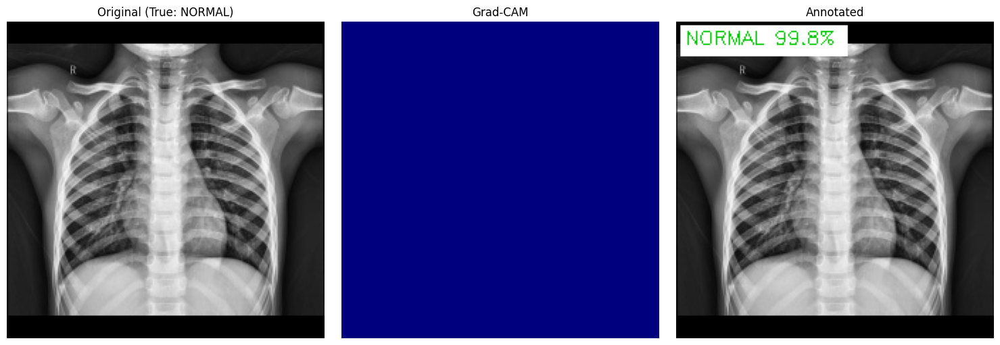

Prediction  : NORMAL (99.84%)


In [ ]:
import random

normal_dir = "/content/data/chest_xray/test/NORMAL"
pneumonia_dir = "/content/data/chest_xray/test/PNEUMONIA"
chosen_class = random.choice(["NORMAL", "PNEUMONIA"])
sample_dir = normal_dir if chosen_class == "NORMAL" else pneumonia_dir

sample_img_path = os.path.join(sample_dir, random.choice(os.listdir(sample_dir)))
print(f"True Label: {chosen_class}")

results = analyze_xray(sample_img_path, model)

for r in results:
    if "error" in r:
        print("⚠️", r["error"])
        continue
    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title(f"Original (True: {chosen_class})"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()

    print("="*65)
    print(f"Prediction  : {rep['prediction']} ({rep['confidence']}%)")
    if rep['prediction'] == "PNEUMONIA":
        print(f"Laterality  : {rep['laterality']}")
        print(f"RALE Score  : {rep['rale_score_total']} (R:{rep['rale_score_right']}, L:{rep['rale_score_left']})")
        print(f"Severity    : {rep['severity']}")
        print(f"Pseudocolor?: {rep.get('was_pseudocolor', False)}")
    print("="*65)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

project_folder = '/content/drive/MyDrive/FYP_Pneumonia_XAI'
exec(open(f'{project_folder}/fyp_setup.py').read())

ValueError: mount failed

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
project_folder = '/content/drive/MyDrive/FYP_Pneumonia_XAI'
exec(open(f'{project_folder}/fyp_setup.py').read())

✅ Everything loaded from saved setup file!
Pseudocolor-aware OOD detection loaded (v2)
RALE-aligned severity scoring loaded


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving mage.jpg to mage.jpg


Uploaded: mage.jpg


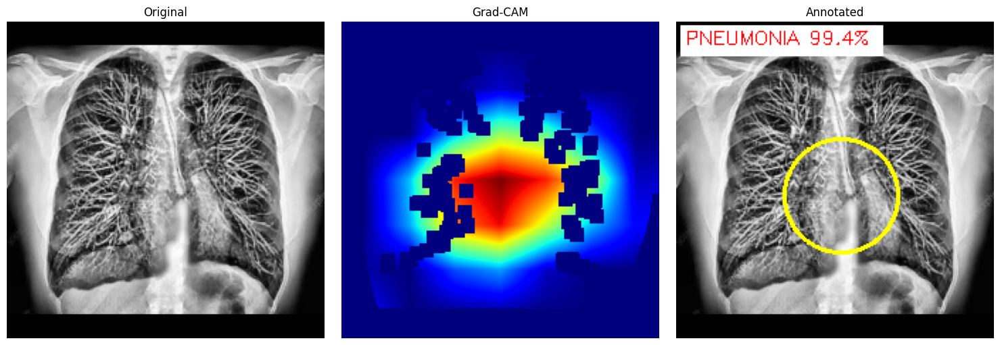

Prediction   : PNEUMONIA
Confidence   : 99.43%
Laterality   : Bilateral (Both Lungs)
RALE Score   : 2/8 (R:0/4, L:2/4)
Severity     : Mild
Pseudocolor? : True


In [ ]:
uploaded_filename = list(uploaded.keys())[0]
print(f"Uploaded: {uploaded_filename}")

results = analyze_xray(uploaded_filename, model)

for r in results:
    if "error" in r:
        print("⚠️", r["error"])
        continue

    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title("Original"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()

    print("="*65)
    print(f"Prediction   : {rep['prediction']}")
    print(f"Confidence   : {rep['confidence']}%")
    if rep['prediction'] == "PNEUMONIA":
        print(f"Laterality   : {rep['laterality']}")
        print(f"RALE Score   : {rep.get('rale_score_total','N/A')} (R:{rep.get('rale_score_right','N/A')}, L:{rep.get('rale_score_left','N/A')})")
        print(f"Severity     : {rep['severity']}")
        print(f"Pseudocolor? : {rep.get('was_pseudocolor', False)}")
    print("="*65)

In [ ]:
img_bgr = cv2.imread(uploaded_filename)
ood_flag, is_pc, sat, sym = is_ood_image_v2(img_bgr)

print(f"OOD Detected: {ood_flag}")
print(f"Saturation: {sat:.2f}")
print(f"Symmetry Score: {sym}")

gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
laplacian = cv2.Laplacian(gray, cv2.CV_64F)
texture_score = laplacian.var()
print(f"Texture Score: {texture_score:.2f}")
print(f"(Needs: symmetry > 0.75 AND texture between 15-500)")

OOD Detected: True
Saturation: 124.20
Symmetry Score: 0.8817685842514038
Texture Score: 585.40
(Needs: symmetry > 0.75 AND texture between 15-500)


In [ ]:
def is_ood_image_v2(image_bgr, saturation_threshold=25, texture_min=15, texture_max=700):
    hsv = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2HSV)
    mean_saturation = np.mean(hsv[:,:,1])
    if mean_saturation <= saturation_threshold:
        return False, False, mean_saturation, None
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
    h, w = gray.shape
    left_half = gray[:, :w//2]
    right_half = cv2.flip(gray[:, w//2:], 1)
    min_w = min(left_half.shape[1], right_half.shape[1])
    left_half = cv2.resize(left_half, (min_w, h))
    right_half = cv2.resize(right_half, (min_w, h))
    diff = np.abs(left_half.astype(np.float32) - right_half.astype(np.float32))
    symmetry_score = 1 - (np.mean(diff) / 255.0)
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)
    texture_score = laplacian.var()
    is_pseudocolor = (symmetry_score > 0.75) and (texture_min <= texture_score <= texture_max)
    if is_pseudocolor:
        return False, True, mean_saturation, symmetry_score
    else:
        return True, False, mean_saturation, symmetry_score

print("✅ Texture threshold relaxed (500 → 700)")

✅ Texture threshold relaxed (500 → 700)


/usr/local/lib/python3.13/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


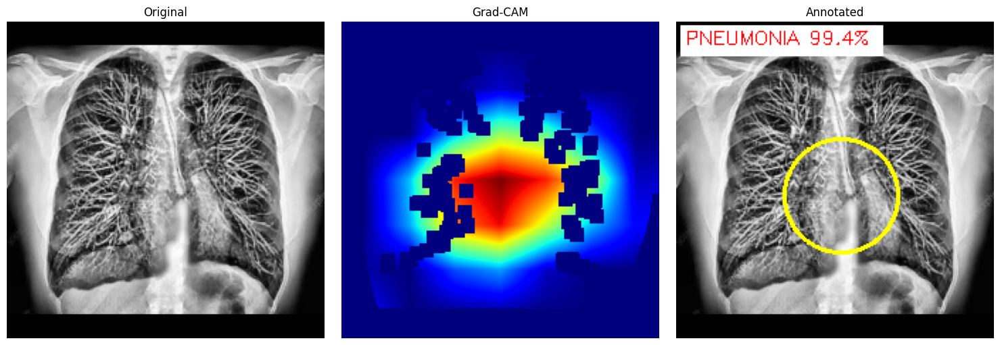

Prediction: PNEUMONIA (99.43%)
Laterality: Bilateral (Both Lungs)
Severity: Mild


In [ ]:
results = analyze_xray(uploaded_filename, model)

for r in results:
    if "error" in r:
        print("⚠️", r["error"])
        continue

    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title("Original"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()

    print(f"Prediction: {rep['prediction']} ({rep['confidence']}%)")
    if rep['prediction'] == "PNEUMONIA":
        print(f"Laterality: {rep.get('laterality')}")
        print(f"Severity: {rep.get('severity')}")

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Screenshot 2026-08-21 194836.png to Screenshot 2026-08-21 194836.png


Uploaded: Screenshot 2026-08-21 194836.png


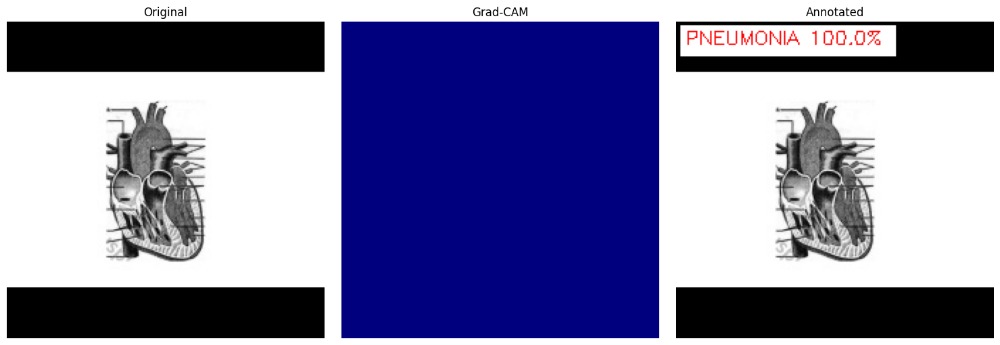

Prediction   : PNEUMONIA
Confidence   : 100.0%
Laterality   : N/A
RALE Score   : 0/8 (R:0/4, L:0/4)
Severity     : None
Pseudocolor? : False


In [ ]:
uploaded_filename = list(uploaded.keys())[0]
print(f"Uploaded: {uploaded_filename}")

results = analyze_xray(uploaded_filename, model)

for r in results:
    if "error" in r:
        print("⚠️", r["error"])
        continue

    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title("Original"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()

    print("="*65)
    print(f"Prediction   : {rep['prediction']}")
    print(f"Confidence   : {rep['confidence']}%")
    if rep['prediction'] == "PNEUMONIA":
        print(f"Laterality   : {rep['laterality']}")
        print(f"RALE Score   : {rep.get('rale_score_total','N/A')} (R:{rep.get('rale_score_right','N/A')}, L:{rep.get('rale_score_left','N/A')})")
        print(f"Severity     : {rep['severity']}")
        print(f"Pseudocolor? : {rep.get('was_pseudocolor', False)}")
    print("="*65)

In [ ]:
def is_xray_like_texture(gray_img, bimodal_threshold=0.55, white_bg_threshold=0.35):
    """
    Check karta hai ke image X-ray jaisi hai ya line-drawing/diagram jaisi.
    X-rays: smooth gradients, kam white-background, kam bimodal (pure black/white) pixels
    Drawings: zyada bimodal (pure black/white), zyada white background
    """
    # Histogram nikalein
    hist = cv2.calcHist([gray_img], [0], None, [256], [0, 256])
    hist = hist.flatten() / hist.sum()  # normalize

    # Bimodal check: kitna % pixels bilkul black (0-20) ya bilkul white (235-255) hain
    near_black = np.sum(hist[0:20])
    near_white = np.sum(hist[235:256])
    bimodal_ratio = near_black + near_white

    # White background check: kitna % image "bilkul white/blank" hai
    white_bg_ratio = np.sum(hist[240:256])

    is_drawing_like = (bimodal_ratio > bimodal_threshold) or (white_bg_ratio > white_bg_threshold)

    return not is_drawing_like, bimodal_ratio, white_bg_ratio

print("✅ X-ray texture validator ready")

✅ X-ray texture validator ready


In [ ]:
def is_ood_image_v2(image_bgr, saturation_threshold=25, texture_min=15, texture_max=700):
    hsv = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2HSV)
    mean_saturation = np.mean(hsv[:,:,1])
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)

    # CASE 1: Low saturation (grayscale-looking image)
    if mean_saturation <= saturation_threshold:
        # NAYA CHECK: Kya ye asal mein X-ray jaisi texture hai, ya drawing/diagram?
        is_xray_texture, bimodal, white_bg = is_xray_like_texture(gray)
        if not is_xray_texture:
            # Grayscale hai lekin X-ray jaisi texture nahi — reject karein
            return True, False, mean_saturation, None
        return False, False, mean_saturation, None

    # CASE 2: High saturation — pehle jaisa pseudocolor check
    h, w = gray.shape
    left_half = gray[:, :w//2]
    right_half = cv2.flip(gray[:, w//2:], 1)
    min_w = min(left_half.shape[1], right_half.shape[1])
    left_half = cv2.resize(left_half, (min_w, h))
    right_half = cv2.resize(right_half, (min_w, h))
    diff = np.abs(left_half.astype(np.float32) - right_half.astype(np.float32))
    symmetry_score = 1 - (np.mean(diff) / 255.0)
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)
    texture_score = laplacian.var()
    is_pseudocolor = (symmetry_score > 0.75) and (texture_min <= texture_score <= texture_max)

    if is_pseudocolor:
        return False, True, mean_saturation, symmetry_score
    else:
        return True, False, mean_saturation, symmetry_score

print("✅ OOD detection updated — now also rejects grayscale non-X-ray images (drawings/diagrams)")

✅ OOD detection updated — now also rejects grayscale non-X-ray images (drawings/diagrams)


In [ ]:
# Test 1: Heart drawing (jo abhi galat accept hui thi) — reject honi chahiye
print("--- Heart Drawing Test ---")
img1 = cv2.imread(uploaded_filename)  # ye wahi drawing wali file hai agar variable abhi bhi hai
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
is_xray, bimodal, white_bg = is_xray_like_texture(gray1)
print(f"Is X-ray-like texture: {is_xray} | Bimodal ratio: {bimodal:.3f} | White-bg ratio: {white_bg:.3f}")
ood_flag, is_pc, sat, sym = is_ood_image_v2(img1)
print(f"OOD Detected: {ood_flag}  (Expected: True)")

print("\n--- Real X-ray Sanity Check ---")
sample_path = os.path.join("/content/data/chest_xray/test/PNEUMONIA", sorted(os.listdir("/content/data/chest_xray/test/PNEUMONIA"))[0])
img2 = cv2.imread(sample_path)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
is_xray2, bimodal2, white_bg2 = is_xray_like_texture(gray2)
print(f"Is X-ray-like texture: {is_xray2} | Bimodal ratio: {bimodal2:.3f} | White-bg ratio: {white_bg2:.3f}")
ood_flag2, is_pc2, sat2, sym2 = is_ood_image_v2(img2)
print(f"OOD Detected: {ood_flag2}  (Expected: False)")

--- Heart Drawing Test ---
Is X-ray-like texture: False | Bimodal ratio: 0.881 | White-bg ratio: 0.862
OOD Detected: True  (Expected: True)

--- Real X-ray Sanity Check ---
Is X-ray-like texture: True | Bimodal ratio: 0.123 | White-bg ratio: 0.001
OOD Detected: False  (Expected: False)


In [ ]:
!unzip -q /content/drive/MyDrive/FYP_Pneumonia_XAI/chest-xray-pneumonia.zip -d /content/data
print("✅ Dataset extracted")

✅ Dataset extracted


In [ ]:
print("--- Real X-ray Sanity Check ---")
sample_path = os.path.join("/content/data/chest_xray/test/PNEUMONIA", sorted(os.listdir("/content/data/chest_xray/test/PNEUMONIA"))[0])
img2 = cv2.imread(sample_path)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
is_xray2, bimodal2, white_bg2 = is_xray_like_texture(gray2)
print(f"Is X-ray-like texture: {is_xray2} | Bimodal ratio: {bimodal2:.3f} | White-bg ratio: {white_bg2:.3f}")
ood_flag2, is_pc2, sat2, sym2 = is_ood_image_v2(img2)
print(f"OOD Detected: {ood_flag2}  (Expected: False)")

--- Real X-ray Sanity Check ---
Is X-ray-like texture: True | Bimodal ratio: 0.123 | White-bg ratio: 0.001
OOD Detected: False  (Expected: False)


In [ ]:
import random

test_dirs = ["/content/data/chest_xray/test/NORMAL", "/content/data/chest_xray/test/PNEUMONIA"]
print("SANITY CHECK: Real X-rays should still NOT be flagged as OOD")
print("="*60)

all_pass = True
for d in test_dirs:
    files = random.sample(os.listdir(d), 5)
    for f in files:
        path = os.path.join(d, f)
        img_bgr = cv2.imread(path)
        ood_flag, is_pc, sat, sym = is_ood_image_v2(img_bgr)
        status = "❌ WRONGLY REJECTED" if ood_flag else "✅ Correctly accepted"
        if ood_flag:
            all_pass = False
        print(f"{f[:30]:30s} | {status}")

print("="*60)
print("ALL PASSED ✅" if all_pass else "SOME FAILED ❌ — need threshold adjustment")

# Pseudocolor check bhi dobara confirm karein
print("\n--- Pseudocolor Regression Check ---")
sample_xray = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)
pseudocolor_test = cv2.applyColorMap(sample_xray, cv2.COLORMAP_JET)
cv2.imwrite('/content/test_pc_regression.jpg', pseudocolor_test)
img_pc = cv2.imread('/content/test_pc_regression.jpg')
ood_pc, is_pc_flag, sat_pc, sym_pc = is_ood_image_v2(img_pc)
print(f"Pseudocolor X-ray -> OOD: {ood_pc}, Pseudocolor: {is_pc_flag}  (Expected: OOD=False, Pseudocolor=True)")

SANITY CHECK: Real X-rays should still NOT be flagged as OOD
NORMAL2-IM-0217-0001.jpeg      | ✅ Correctly accepted
NORMAL2-IM-0360-0001.jpeg      | ✅ Correctly accepted
IM-0102-0001.jpeg              | ✅ Correctly accepted
IM-0045-0001.jpeg              | ✅ Correctly accepted
NORMAL2-IM-0252-0001.jpeg      | ✅ Correctly accepted
person125_bacteria_595.jpeg    | ✅ Correctly accepted
person42_virus_89.jpeg         | ✅ Correctly accepted
person123_bacteria_587.jpeg    | ✅ Correctly accepted
person111_bacteria_535.jpeg    | ✅ Correctly accepted
person109_bacteria_522.jpeg    | ✅ Correctly accepted
ALL PASSED ✅

--- Pseudocolor Regression Check ---
Pseudocolor X-ray -> OOD: False, Pseudocolor: True  (Expected: OOD=False, Pseudocolor=True)


In [ ]:
setup_code = open(f'{project_folder}/fyp_setup.py').read()

additional_code_ood_v3 = '''

# ============ IMPROVED OOD DETECTION v3 (rejects non-X-ray grayscale images too) ============
def is_xray_like_texture(gray_img, bimodal_threshold=0.55, white_bg_threshold=0.35):
    hist = cv2.calcHist([gray_img], [0], None, [256], [0, 256])
    hist = hist.flatten() / hist.sum()
    near_black = np.sum(hist[0:20])
    near_white = np.sum(hist[235:256])
    bimodal_ratio = near_black + near_white
    white_bg_ratio = np.sum(hist[240:256])
    is_drawing_like = (bimodal_ratio > bimodal_threshold) or (white_bg_ratio > white_bg_threshold)
    return not is_drawing_like, bimodal_ratio, white_bg_ratio

def is_ood_image_v2(image_bgr, saturation_threshold=25, texture_min=15, texture_max=700):
    hsv = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2HSV)
    mean_saturation = np.mean(hsv[:,:,1])
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)

    if mean_saturation <= saturation_threshold:
        is_xray_texture, bimodal, white_bg = is_xray_like_texture(gray)
        if not is_xray_texture:
            return True, False, mean_saturation, None
        return False, False, mean_saturation, None

    h, w = gray.shape
    left_half = gray[:, :w//2]
    right_half = cv2.flip(gray[:, w//2:], 1)
    min_w = min(left_half.shape[1], right_half.shape[1])
    left_half = cv2.resize(left_half, (min_w, h))
    right_half = cv2.resize(right_half, (min_w, h))
    diff = np.abs(left_half.astype(np.float32) - right_half.astype(np.float32))
    symmetry_score = 1 - (np.mean(diff) / 255.0)
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)
    texture_score = laplacian.var()
    is_pseudocolor = (symmetry_score > 0.75) and (texture_min <= texture_score <= texture_max)
    if is_pseudocolor:
        return False, True, mean_saturation, symmetry_score
    else:
        return True, False, mean_saturation, symmetry_score

print("Improved OOD detection v3 loaded (rejects non-Xray grayscale images like drawings/diagrams)")
'''

setup_code_updated = setup_code + additional_code_ood_v3

with open(f'{project_folder}/fyp_setup.py', 'w') as f:
    f.write(setup_code_updated)

print("✅ Setup file permanently updated with improved OOD detection (v3)")

✅ Setup file permanently updated with improved OOD detection (v3)


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving normal.png to normal.png


Image shape: (448, 795, 3)


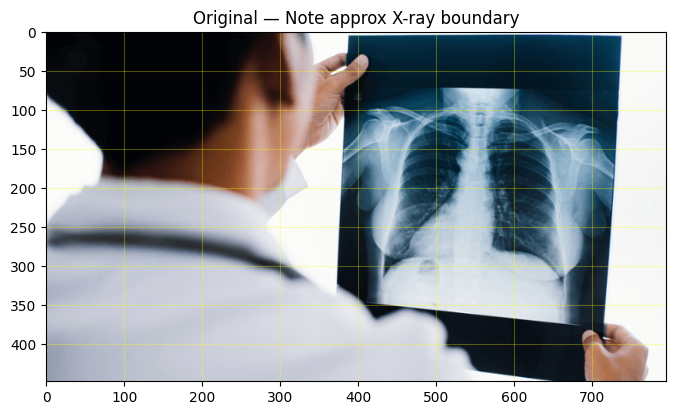

In [ ]:
img = cv2.imread('normal.png')
print(f"Image shape: {img.shape}")  # (height, width, channels)

# Poori image dikhayein taake crop coordinates decide kar sakein
plt.figure(figsize=(8,8))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Original — Note approx X-ray boundary")
plt.grid(True, color='yellow', alpha=0.3)
plt.show()

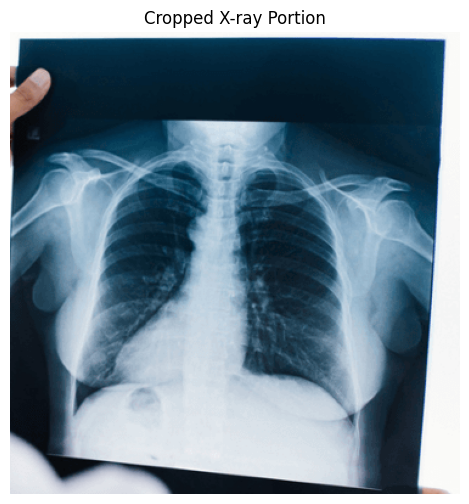

In [ ]:
# Andaza: X-ray roughly right-side, x=380 se end tak, y=0 se 380 tak
# (Exact numbers upar wali grid image dekh kar adjust karenge)
cropped_xray = img[0:380, 380:750]

cv2.imwrite('/content/cropped_xray_test.jpg', cropped_xray)

plt.figure(figsize=(6,6))
plt.imshow(cv2.cvtColor(cropped_xray, cv2.COLOR_BGR2RGB))
plt.title("Cropped X-ray Portion")
plt.axis('off')
plt.show()

In [ ]:
results = analyze_xray('/content/cropped_xray_test.jpg', model)

for r in results:
    if "error" in r:
        print("⚠️", r["error"])
        continue

    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title("Original"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()

    print("="*65)
    print(f"Prediction   : {rep['prediction']}")
    print(f"Confidence   : {rep['confidence']}%")
    if rep['prediction'] == "PNEUMONIA":
        print(f"Laterality   : {rep['laterality']}")
        print(f"Severity     : {rep['severity']}")
        print(f"Pseudocolor? : {rep.get('was_pseudocolor', False)}")
    print("="*65)

⚠️ REJECTED — non-medical/OOD image detected


In [ ]:
img_bgr = cv2.imread('/content/cropped_xray_test.jpg')
hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
mean_saturation = np.mean(hsv[:,:,1])
print(f"Saturation: {mean_saturation:.2f}")

gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

if mean_saturation <= 25:
    is_xray, bimodal, white_bg = is_xray_like_texture(gray)
    print(f"Path: Grayscale check")
    print(f"Is X-ray-like: {is_xray} | Bimodal: {bimodal:.3f} | White-bg: {white_bg:.3f}")
else:
    h, w = gray.shape
    left_half = gray[:, :w//2]
    right_half = cv2.flip(gray[:, w//2:], 1)
    min_w = min(left_half.shape[1], right_half.shape[1])
    left_half = cv2.resize(left_half, (min_w, h))
    right_half = cv2.resize(right_half, (min_w, h))
    diff = np.abs(left_half.astype(np.float32) - right_half.astype(np.float32))
    symmetry_score = 1 - (np.mean(diff) / 255.0)
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)
    texture_score = laplacian.var()
    print(f"Path: Pseudocolor check")
    print(f"Symmetry: {symmetry_score:.3f} (need >0.75)")
    print(f"Texture: {texture_score:.2f} (need 15-700)")

Saturation: 121.45
Path: Pseudocolor check
Symmetry: 0.739 (need >0.75)
Texture: 318.67 (need 15-700)


In [ ]:
def is_ood_image_v2(image_bgr, saturation_threshold=25, texture_min=15, texture_max=700, symmetry_threshold=0.68):
    hsv = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2HSV)
    mean_saturation = np.mean(hsv[:,:,1])
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)

    if mean_saturation <= saturation_threshold:
        is_xray_texture, bimodal, white_bg = is_xray_like_texture(gray)
        if not is_xray_texture:
            return True, False, mean_saturation, None
        return False, False, mean_saturation, None

    h, w = gray.shape
    left_half = gray[:, :w//2]
    right_half = cv2.flip(gray[:, w//2:], 1)
    min_w = min(left_half.shape[1], right_half.shape[1])
    left_half = cv2.resize(left_half, (min_w, h))
    right_half = cv2.resize(right_half, (min_w, h))
    diff = np.abs(left_half.astype(np.float32) - right_half.astype(np.float32))
    symmetry_score = 1 - (np.mean(diff) / 255.0)
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)
    texture_score = laplacian.var()
    is_pseudocolor = (symmetry_score > symmetry_threshold) and (texture_min <= texture_score <= texture_max)
    if is_pseudocolor:
        return False, True, mean_saturation, symmetry_score
    else:
        return True, False, mean_saturation, symmetry_score

print("✅ Symmetry threshold relaxed (0.75 → 0.68)")

✅ Symmetry threshold relaxed (0.75 → 0.68)


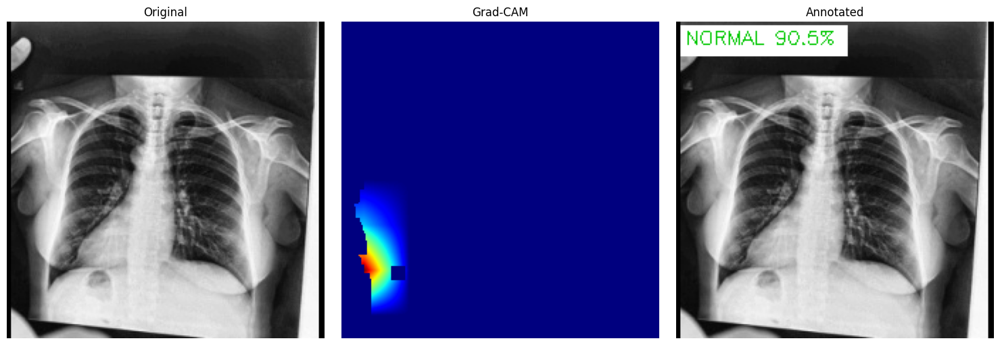

Prediction: NORMAL (90.45%)


In [ ]:
results = analyze_xray('/content/cropped_xray_test.jpg', model)

for r in results:
    if "error" in r:
        print("⚠️", r["error"])
        continue

    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title("Original"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()

    print(f"Prediction: {rep['prediction']} ({rep['confidence']}%)")
    if rep['prediction'] == "PNEUMONIA":
        print(f"Laterality: {rep.get('laterality')}, Severity: {rep.get('severity')}")

In [ ]:
np.random.seed(42)
synthetic_photo = np.zeros((300, 300, 3), dtype=np.uint8)
synthetic_photo[:100, :, 0] = 200
synthetic_photo[:100, :, 1] = 50
synthetic_photo[:100, :, 2] = 50
synthetic_photo[100:200, :, 0] = 30
synthetic_photo[100:200, :, 1] = 180
synthetic_photo[100:200, :, 2] = 40
synthetic_photo[200:, :, 0] = 40
synthetic_photo[200:, :, 1] = 60
synthetic_photo[200:, :, 2] = 200
noise = np.random.randint(0, 40, synthetic_photo.shape, dtype=np.uint8)
synthetic_photo = cv2.add(synthetic_photo, noise)
cv2.imwrite('/content/test_synthetic_photo.jpg', synthetic_photo)
print("✅ Recreated")

✅ Recreated


In [ ]:
img_photo = cv2.imread('/content/test_synthetic_photo.jpg')
ood_check, _, _, _ = is_ood_image_v2(img_photo)
print(f"OOD Detected: {ood_check} (Expected: True)")

OOD Detected: True (Expected: True)


In [ ]:
img_photo = cv2.imread('/content/test_synthetic_photo.jpg')
ood_check, _, _, _ = is_ood_image_v2(img_photo)
print(f"Random Photo OOD Detected: {ood_check} (Expected: True)")

Random Photo OOD Detected: True (Expected: True)


In [ ]:
setup_code = open(f'{project_folder}/fyp_setup.py').read()

additional_code_ood_v4 = '''

# ============ FINAL OOD DETECTION v4 (realistic symmetry threshold) ============
def is_ood_image_v2(image_bgr, saturation_threshold=25, texture_min=15, texture_max=700, symmetry_threshold=0.68):
    hsv = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2HSV)
    mean_saturation = np.mean(hsv[:,:,1])
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)

    if mean_saturation <= saturation_threshold:
        is_xray_texture, bimodal, white_bg = is_xray_like_texture(gray)
        if not is_xray_texture:
            return True, False, mean_saturation, None
        return False, False, mean_saturation, None

    h, w = gray.shape
    left_half = gray[:, :w//2]
    right_half = cv2.flip(gray[:, w//2:], 1)
    min_w = min(left_half.shape[1], right_half.shape[1])
    left_half = cv2.resize(left_half, (min_w, h))
    right_half = cv2.resize(right_half, (min_w, h))
    diff = np.abs(left_half.astype(np.float32) - right_half.astype(np.float32))
    symmetry_score = 1 - (np.mean(diff) / 255.0)
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)
    texture_score = laplacian.var()
    is_pseudocolor = (symmetry_score > symmetry_threshold) and (texture_min <= texture_score <= texture_max)
    if is_pseudocolor:
        return False, True, mean_saturation, symmetry_score
    else:
        return True, False, mean_saturation, symmetry_score

print("Final OOD detection v4 loaded (symmetry threshold relaxed to 0.68 for real-world tolerance)")
'''

setup_code_updated = setup_code + additional_code_ood_v4

with open(f'{project_folder}/fyp_setup.py', 'w') as f:
    f.write(setup_code_updated)

print("✅ Setup file permanently updated — final OOD detection saved")

✅ Setup file permanently updated — final OOD detection saved


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving images.jpg to images (1).jpg


In [ ]:
!unzip -oq /content/drive/MyDrive/FYP_Pneumonia_XAI/chest-xray-pneumonia.zip -d /content/data
print("✅ Dataset ready")

✅ Dataset ready


Uploaded: images (1).jpg


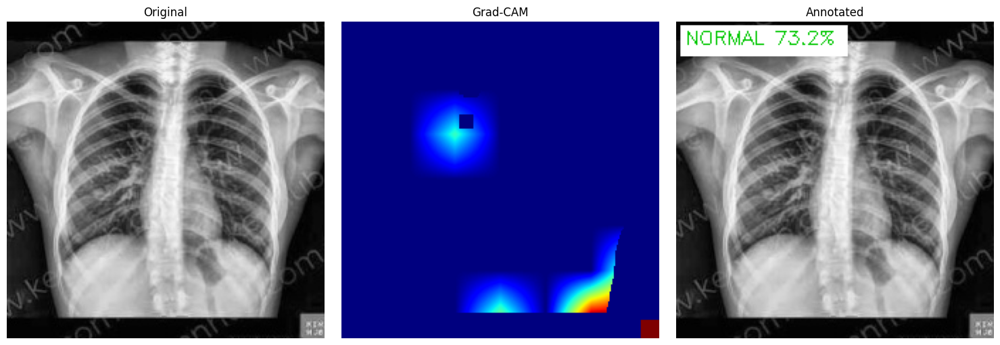

Prediction   : NORMAL
Confidence   : 73.25%


In [ ]:
uploaded_filename = list(uploaded.keys())[0]
print(f"Uploaded: {uploaded_filename}")

results = analyze_xray(uploaded_filename, model)

for r in results:
    if "error" in r:
        print("⚠️", r["error"])
        continue

    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title("Original"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()

    print("="*65)
    print(f"Prediction   : {rep['prediction']}")
    print(f"Confidence   : {rep['confidence']}%")
    if rep['prediction'] == "PNEUMONIA":
        print(f"Laterality   : {rep['laterality']}")
        print(f"Severity     : {rep['severity']}")
        print(f"Pseudocolor? : {rep.get('was_pseudocolor', False)}")
    print("="*65)

In [ ]:
from google.colab import files
uploaded = files.upload()

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving viral conbine.jpg to viral conbine.jpg


In [ ]:
uploaded_filename = list(uploaded.keys())[0]
print(f"Uploaded: {uploaded_filename}")

results = analyze_xray(uploaded_filename, model)

print(f"\nTotal panels detected: {len(results)}\n")

for r in results:
    if "error" in r:
        print("⚠️", r["error"])
        continue

    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title(f"Panel {rep['panel_number']} - Original"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()

    print("="*60)
    print(f"Panel {rep['panel_number']} of {rep['total_panels_detected']}")
    print(f"Prediction  : {rep['prediction']} ({rep['confidence']}%)")
    if rep['prediction'] == "PNEUMONIA":
        print(f"Laterality  : {rep['laterality']}")
        print(f"Severity    : {rep['severity']}")
    print("="*60)

Uploaded: viral conbine.jpg


NameError: name 'analyze_xray' is not defined

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

project_folder = '/content/drive/MyDrive/FYP_Pneumonia_XAI'
exec(open(f'{project_folder}/fyp_setup.py').read())

Mounted at /content/drive
✅ Everything loaded from saved setup file!
Pseudocolor-aware OOD detection loaded (v2)
RALE-aligned severity scoring loaded
Improved OOD detection v3 loaded (rejects non-Xray grayscale images like drawings/diagrams)
Final OOD detection v4 loaded (symmetry threshold relaxed to 0.68 for real-world tolerance)


In [ ]:
print(callable(analyze_xray))

True



Total panels detected: 1



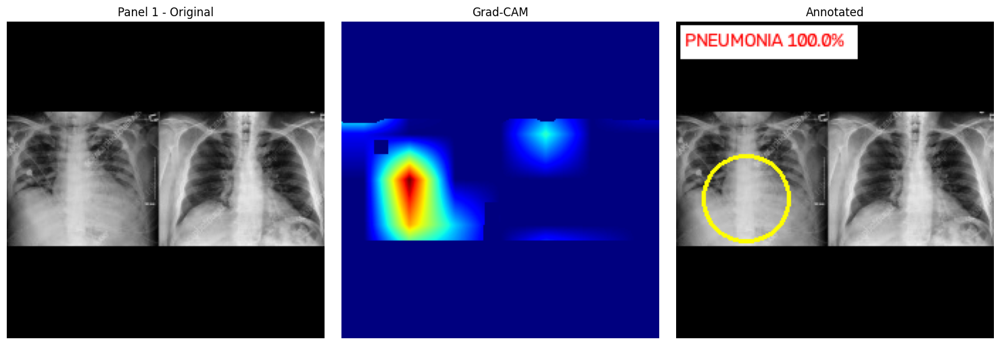

Panel 1 of 1
Prediction  : PNEUMONIA (99.97%)
Laterality  : Unilateral - Patient's RIGHT Lung
Severity    : Mild


In [ ]:
results = analyze_xray(uploaded_filename, model)
print(f"\nTotal panels detected: {len(results)}\n")

for r in results:
    if "error" in r:
        print("⚠️", r["error"])
        continue
    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title(f"Panel {rep['panel_number']} - Original"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()
    print("="*60)
    print(f"Panel {rep['panel_number']} of {rep['total_panels_detected']}")
    print(f"Prediction  : {rep['prediction']} ({rep['confidence']}%)")
    if rep['prediction'] == "PNEUMONIA":
        print(f"Laterality  : {rep['laterality']}")
        print(f"Severity    : {rep['severity']}")
    print("="*60)

In [ ]:
def detect_and_split_panels_v2(image, min_gap_width=3):
    """
    Improved panel splitting: beech mein 'kam content' wali strip dhoondta hai
    (chahe perfectly uniform na ho), na ke sirf bilkul flat separator.
    """
    h, w = image.shape[:2]
    aspect_ratio = w / h

    if aspect_ratio > 1.25:
        # Horizontal split check — column-wise content density dekhte hain
        col_std = np.std(image, axis=0)  # har column ki variation
        mid_region = col_std[int(w*0.35):int(w*0.65)]  # beech ke 30% area mein dhoondein

        if len(mid_region) > 0:
            min_std_idx = np.argmin(mid_region) + int(w*0.35)
            # Check karein ye asal mein ek "low-detail gap" hai
            if col_std[min_std_idx] < np.mean(col_std) * 0.5:
                return [image[:, :min_std_idx], image[:, min_std_idx:]]

        return [image]

    elif aspect_ratio < 0.8:
        row_std = np.std(image, axis=1)
        mid_region = row_std[int(h*0.35):int(h*0.65)]
        if len(mid_region) > 0:
            min_std_idx = np.argmin(mid_region) + int(h*0.35)
            if row_std[min_std_idx] < np.mean(row_std) * 0.5:
                return [image[:min_std_idx, :], image[min_std_idx:, :]]
        return [image]
    else:
        return [image]

print("✅ Improved panel-splitting function ready")

✅ Improved panel-splitting function ready


Panels detected: 2


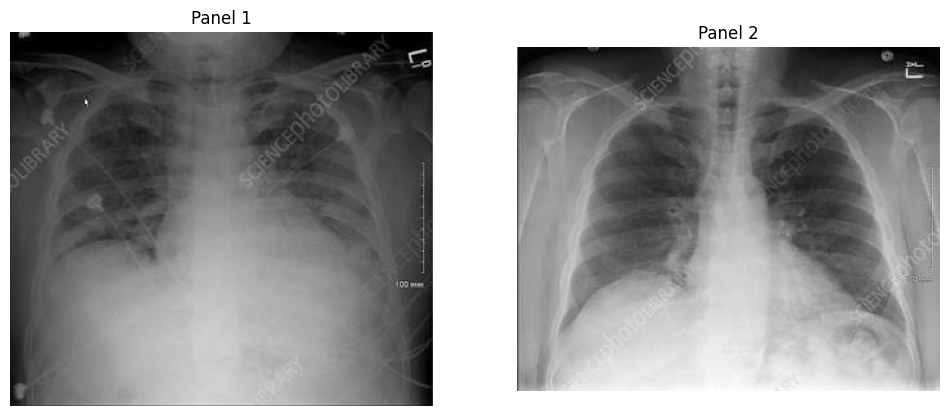

In [ ]:
img_bgr = cv2.imread(uploaded_filename)
gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
panels_test = detect_and_split_panels_v2(gray)
print(f"Panels detected: {len(panels_test)}")

fig, axes = plt.subplots(1, len(panels_test), figsize=(6*len(panels_test), 5))
if len(panels_test) == 1:
    axes = [axes]
for i, p in enumerate(panels_test):
    axes[i].imshow(p, cmap='gray')
    axes[i].set_title(f"Panel {i+1}")
    axes[i].axis('off')
plt.show()

Image size: 687 x 291, Aspect ratio: 2.36


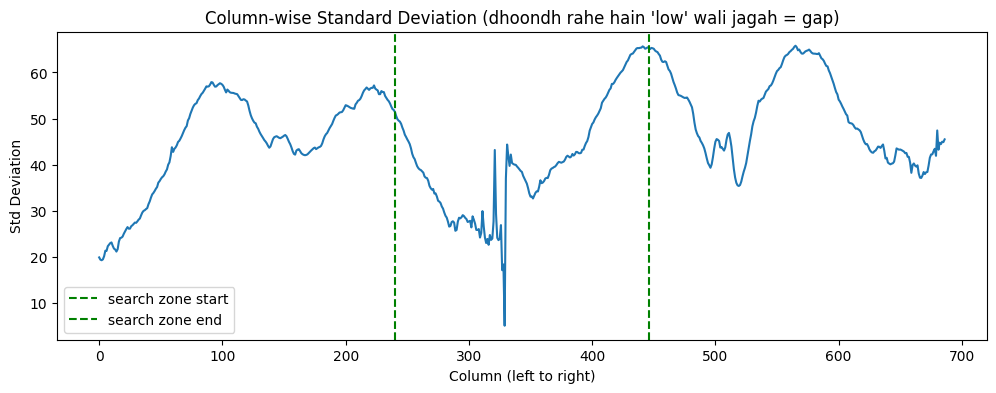

Mean std: 45.77
Min std in middle zone: 5.07


In [ ]:
img_bgr = cv2.imread(uploaded_filename)
gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
h, w = gray.shape
print(f"Image size: {w} x {h}, Aspect ratio: {w/h:.2f}")

col_std = np.std(gray, axis=0)

plt.figure(figsize=(12,4))
plt.plot(col_std)
plt.title("Column-wise Standard Deviation (dhoondh rahe hain 'low' wali jagah = gap)")
plt.xlabel("Column (left to right)")
plt.ylabel("Std Deviation")
plt.axvline(int(w*0.35), color='green', linestyle='--', label='search zone start')
plt.axvline(int(w*0.65), color='green', linestyle='--', label='search zone end')
plt.legend()
plt.show()

print(f"Mean std: {np.mean(col_std):.2f}")
print(f"Min std in middle zone: {np.min(col_std[int(w*0.35):int(w*0.65)]):.2f}")

In [ ]:
def analyze_xray(image_path, model, threshold=0.72, img_size=224):
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        return [{"error": "Could not read image file"}]

    ood_flag, is_pseudocolor, sat, sym = is_ood_image_v2(img_bgr)
    if ood_flag:
        return [{"error": "REJECTED — non-medical/OOD image detected",
                  "saturation": round(float(sat),2)}]

    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    panels_raw = detect_and_split_panels_v2(gray)   # <-- NAYA function yahan use ho raha hai

    results = []
    for idx, panel in enumerate(panels_raw, 1):
        panel_clean = strip_artifacts(panel)
        panel_clahe = apply_clahe(panel_clean)
        panel_final = letterbox_resize(panel_clahe, img_size)
        temp_path = f'/content/temp_panel_{idx}.jpg'
        cv2.imwrite(temp_path, panel_final)

        original, heatmap, annotated_img, report = full_diagnosis_report(temp_path, model, threshold)
        report["panel_number"] = idx
        report["total_panels_detected"] = len(panels_raw)
        report["was_pseudocolor"] = is_pseudocolor
        results.append({"report": report, "original": original, "heatmap": heatmap, "annotated": annotated_img})

    return results

print("✅ analyze_xray now using improved panel splitting (v2)")

✅ analyze_xray now using improved panel splitting (v2)


Total panels detected: 2



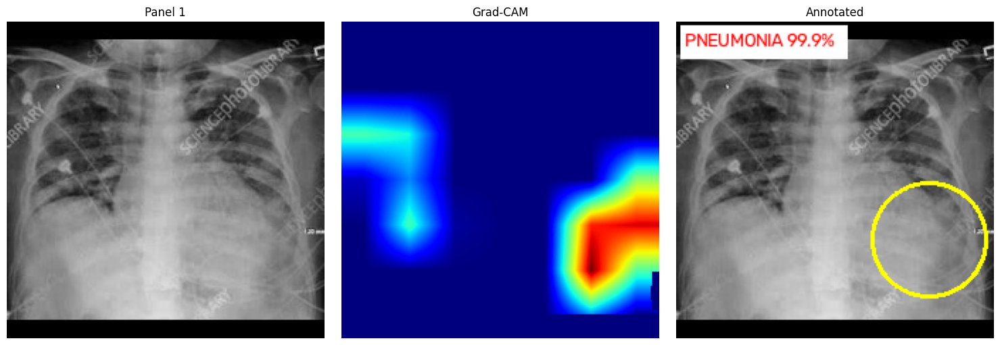

Panel 1: PNEUMONIA (99.88%)


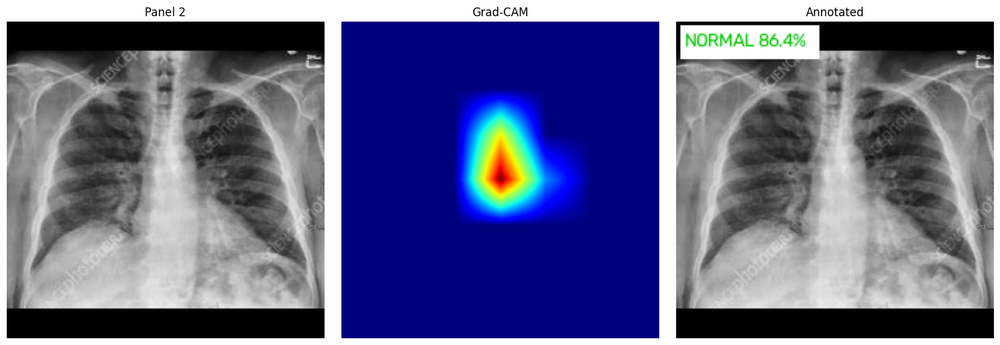

Panel 2: NORMAL (86.42%)


In [ ]:
results = analyze_xray(uploaded_filename, model)
print(f"Total panels detected: {len(results)}\n")

for r in results:
    if "error" in r:
        print("⚠️", r["error"])
        continue
    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title(f"Panel {rep['panel_number']}"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()
    print(f"Panel {rep['panel_number']}: {rep['prediction']} ({rep['confidence']}%)")

In [ ]:
# Single (non-dual) X-ray par test — 1 panel hi aana chahiye
sample_path = os.path.join("/content/data/chest_xray/test/PNEUMONIA", sorted(os.listdir("/content/data/chest_xray/test/PNEUMONIA"))[0])
results_single = analyze_xray(sample_path, model)
print(f"Single X-ray -> Panels detected: {len(results_single)} (Expected: 1)")

Single X-ray -> Panels detected: 1 (Expected: 1)


In [ ]:
!unzip -oq /content/drive/MyDrive/FYP_Pneumonia_XAI/chest-xray-pneumonia.zip -d /content/data
print("✅ Dataset ready")

✅ Dataset ready


In [ ]:
sample_path = os.path.join("/content/data/chest_xray/test/PNEUMONIA", sorted(os.listdir("/content/data/chest_xray/test/PNEUMONIA"))[0])
results_single = analyze_xray(sample_path, model)
print(f"Single X-ray -> Panels detected: {len(results_single)} (Expected: 1)")

Single X-ray -> Panels detected: 1 (Expected: 1)


In [ ]:
setup_code = open(f'{project_folder}/fyp_setup.py').read()

additional_code_panel_v2 = '''

# ============ IMPROVED PANEL SPLITTING v2 (density-based, more flexible) ============
def detect_and_split_panels_v2(image, min_gap_width=3):
    h, w = image.shape[:2]
    aspect_ratio = w / h
    if aspect_ratio > 1.25:
        col_std = np.std(image, axis=0)
        mid_region = col_std[int(w*0.35):int(w*0.65)]
        if len(mid_region) > 0:
            min_std_idx = np.argmin(mid_region) + int(w*0.35)
            if col_std[min_std_idx] < np.mean(col_std) * 0.5:
                return [image[:, :min_std_idx], image[:, min_std_idx:]]
        return [image]
    elif aspect_ratio < 0.8:
        row_std = np.std(image, axis=1)
        mid_region = row_std[int(h*0.35):int(h*0.65)]
        if len(mid_region) > 0:
            min_std_idx = np.argmin(mid_region) + int(h*0.35)
            if row_std[min_std_idx] < np.mean(row_std) * 0.5:
                return [image[:min_std_idx, :], image[min_std_idx:, :]]
        return [image]
    else:
        return [image]

def analyze_xray(image_path, model, threshold=0.72, img_size=224):
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        return [{"error": "Could not read image file"}]
    ood_flag, is_pseudocolor, sat, sym = is_ood_image_v2(img_bgr)
    if ood_flag:
        return [{"error": "REJECTED — non-medical/OOD image detected",
                  "saturation": round(float(sat),2)}]
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    panels_raw = detect_and_split_panels_v2(gray)
    results = []
    for idx, panel in enumerate(panels_raw, 1):
        panel_clean = strip_artifacts(panel)
        panel_clahe = apply_clahe(panel_clean)
        panel_final = letterbox_resize(panel_clahe, img_size)
        temp_path = f'/content/temp_panel_{idx}.jpg'
        cv2.imwrite(temp_path, panel_final)
        original, heatmap, annotated_img, report = full_diagnosis_report(temp_path, model, threshold)
        report["panel_number"] = idx
        report["total_panels_detected"] = len(panels_raw)
        report["was_pseudocolor"] = is_pseudocolor
        results.append({"report": report, "original": original, "heatmap": heatmap, "annotated": annotated_img})
    return results

print("Improved density-based panel splitting v2 loaded")
'''

setup_code_updated = setup_code + additional_code_panel_v2

with open(f'{project_folder}/fyp_setup.py', 'w') as f:
    f.write(setup_code_updated)

print("✅ Setup file permanently updated with improved panel splitting")

✅ Setup file permanently updated with improved panel splitting


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving nature.jpg to nature.jpg


Uploaded: nature.jpg
Total panels detected: 2



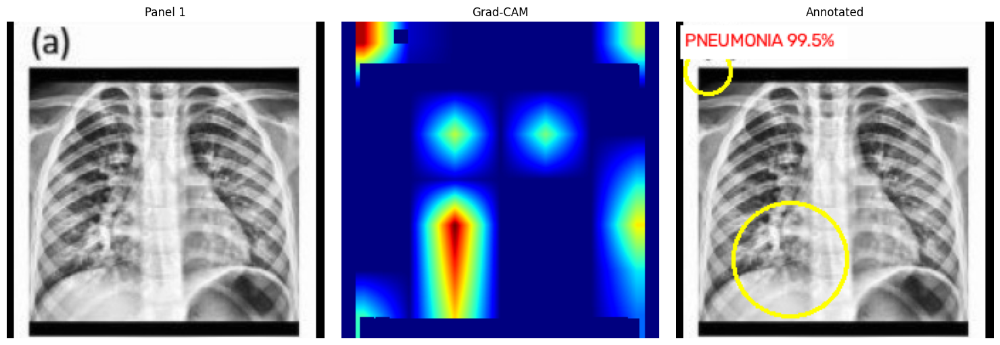

Panel 1 of 2
Prediction  : PNEUMONIA (99.49%)
Laterality  : Unilateral - Patient's RIGHT Lung
Severity    : Mild


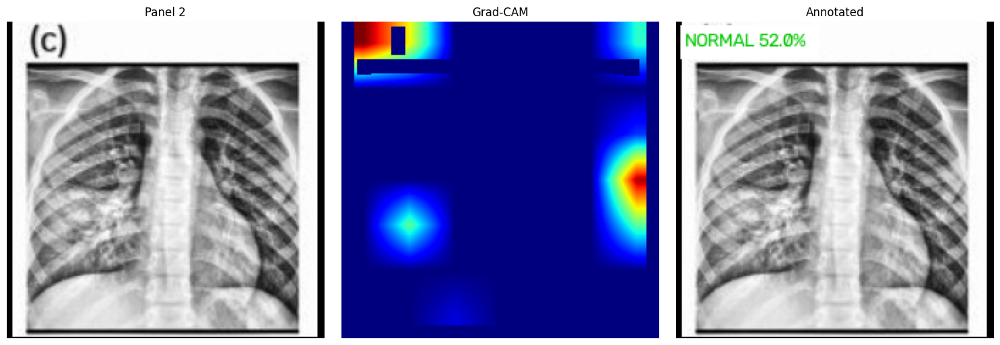

Panel 2 of 2
Prediction  : NORMAL (51.96%)


In [ ]:
uploaded_filename = list(uploaded.keys())[0]
print(f"Uploaded: {uploaded_filename}")

results = analyze_xray(uploaded_filename, model)
print(f"Total panels detected: {len(results)}\n")

for r in results:
    if "error" in r:
        print("⚠️", r["error"])
        continue

    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title(f"Panel {rep['panel_number']}"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()

    print("="*60)
    print(f"Panel {rep['panel_number']} of {rep['total_panels_detected']}")
    print(f"Prediction  : {rep['prediction']} ({rep['confidence']}%)")
    if rep['prediction'] == "PNEUMONIA":
        print(f"Laterality  : {rep['laterality']}")
        print(f"Severity    : {rep['severity']}")
    print("="*60)

In [ ]:
def annotate_and_analyze(original_img, heatmap, pred_prob, threshold=0.72, hot_percentile=85, min_area_pct=0.5, edge_margin=15):
    annotated = original_img.copy().astype(np.uint8)
    annotated = cv2.cvtColor(annotated, cv2.COLOR_RGB2BGR)
    img_h, img_w = heatmap.shape

    is_pneumonia = pred_prob >= threshold
    affected_percent = 0.0
    regions_info = []

    if is_pneumonia:
        nonzero_vals = heatmap[heatmap > 0]
        threshold_val = np.percentile(nonzero_vals, hot_percentile) if len(nonzero_vals) > 0 else 0

        hot_mask = (heatmap >= threshold_val).astype(np.uint8)
        hot_mask[heatmap == 0] = 0

        contours, _ = cv2.findContours(hot_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        total_pixels = img_h * img_w

        valid_regions = []
        for c in contours:
            area = cv2.contourArea(c)
            area_pct = (area / total_pixels) * 100
            x, y, w, h = cv2.boundingRect(c)

            # NAYA CHECK: region image ke bilkul corner/edge ko chhoo raha hai to skip karein
            touches_edge = (x <= edge_margin or y <= edge_margin or
                             (x + w) >= (img_w - edge_margin) or (y + h) >= (img_h - edge_margin))

            if area_pct >= min_area_pct and not touches_edge:
                valid_regions.append((c, area))

        if len(valid_regions) == 0 and len(contours) > 0:
            # Fallback: agar sab edge-touching hon, phir bhi sabse bada le lein (better than nothing)
            largest = max(contours, key=cv2.contourArea)
            valid_regions = [(largest, cv2.contourArea(largest))]

        valid_regions.sort(key=lambda x: x[1], reverse=True)
        valid_regions = valid_regions[:2]

        circles = []
        for contour, area in valid_regions:
            x, y, w, h = cv2.boundingRect(contour)
            peak_x = x + w // 2
            peak_y = y + h // 2
            radius = int(max(w, h) / 2)
            radius = max(radius, 10)
            radius = min(radius, int(min(img_h, img_w) * 0.18))
            circles.append({"x": peak_x, "y": peak_y, "radius": radius, "area": area})

        if len(circles) == 2:
            dist = np.sqrt((circles[0]["x"]-circles[1]["x"])**2 + (circles[0]["y"]-circles[1]["y"])**2)
            sum_radii = circles[0]["radius"] + circles[1]["radius"]
            if dist < sum_radii:
                scale = (dist - 5) / sum_radii if sum_radii > 0 else 1
                scale = max(scale, 0.3)
                for c in circles:
                    c["radius"] = max(int(c["radius"] * scale), 10)

        for c in circles:
            peak_x, peak_y, radius = c["x"], c["y"], c["radius"]
            margin = radius + 6
            top_margin = max(margin, 35)
            peak_x = int(np.clip(peak_x, margin, img_w - margin))
            peak_y = int(np.clip(peak_y, top_margin, img_h - margin))

            side = "Patient's RIGHT Lung" if peak_x < img_w // 2 else "Patient's LEFT Lung"
            regions_info.append({
                "x": peak_x, "y": peak_y, "radius": radius,
                "area_pct": round((c["area"]/total_pixels)*100, 2),
                "side": side
            })
            cv2.circle(annotated, (peak_x, peak_y), radius, (0, 255, 255), 2)

        affected_pixels = int(np.sum(hot_mask))
        affected_percent = round((affected_pixels / total_pixels) * 100, 2)

    if is_pneumonia:
        label = "PNEUMONIA " + str(round(float(pred_prob)*100, 1)) + "%"
        label_color = (0, 0, 255)
    else:
        label = "NORMAL " + str(round(float(1-pred_prob)*100, 1)) + "%"
        label_color = (0, 200, 0)

    font_scale = 0.45
    thickness = 1
    text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)
    text_w, text_h = text_size[0]
    cv2.rectangle(annotated, (3, 3), (8 + text_w + 6, 8 + text_h + 6), (255, 255, 255), -1)
    cv2.putText(annotated, label, (6, 6 + text_h), cv2.FONT_HERSHEY_SIMPLEX, font_scale, label_color, thickness)

    annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
    return annotated, affected_percent, regions_info

print("✅ Corner-touching regions now excluded from circle markers")

✅ Corner-touching regions now excluded from circle markers


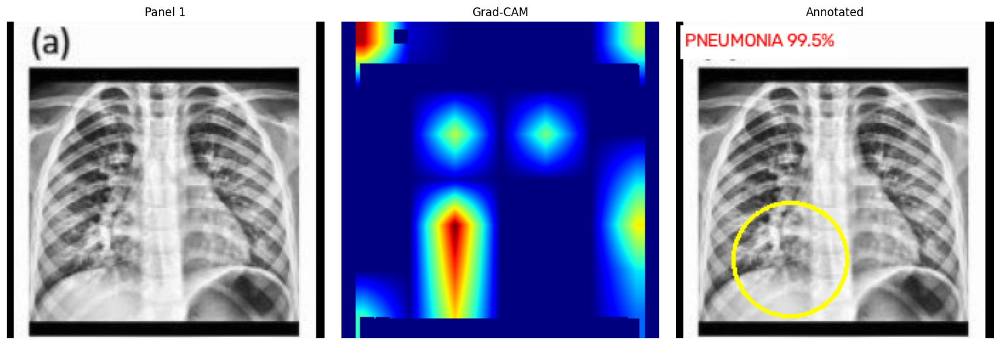

Prediction: PNEUMONIA (99.49%)


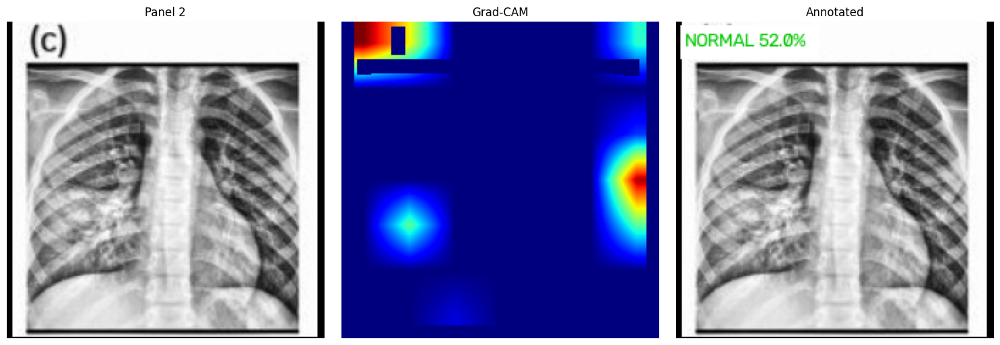

Prediction: NORMAL (51.96%)


In [ ]:
results = analyze_xray(uploaded_filename, model)

for r in results:
    if "error" in r:
        print("⚠️", r["error"])
        continue
    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title(f"Panel {rep['panel_number']}"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()
    print(f"Prediction: {rep['prediction']} ({rep['confidence']}%)")

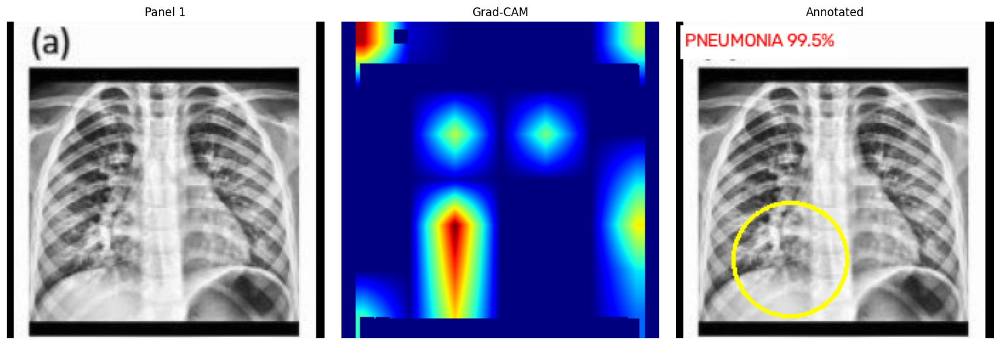

Panel 1 of 2
Prediction   : PNEUMONIA
Confidence   : 99.49%
Laterality   : Unilateral - Patient's RIGHT Lung
  Right: 81.5% | Left: 18.5%
Affected Area: 7.19%
RALE Score   : 1/8 (R:1/4, L:0/4)
Severity     : Mild
Regions      : 1
  - Patient's RIGHT Lung: 4.26%


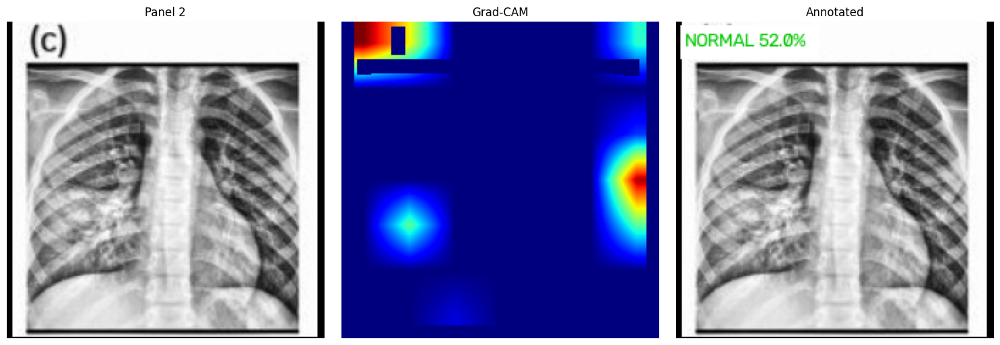

Panel 2 of 2
Prediction   : NORMAL
Confidence   : 51.96%


In [ ]:
results = analyze_xray(uploaded_filename, model)

for r in results:
    if "error" in r:
        print("⚠️", r["error"])
        continue
    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title(f"Panel {rep['panel_number']}"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()

    print("="*65)
    print(f"Panel {rep['panel_number']} of {rep['total_panels_detected']}")
    print(f"Prediction   : {rep['prediction']}")
    print(f"Confidence   : {rep['confidence']}%")
    if rep['prediction'] == "PNEUMONIA":
        print(f"Laterality   : {rep['laterality']}")
        print(f"  Right: {rep.get('right_lung_pct','N/A')}% | Left: {rep.get('left_lung_pct','N/A')}%")
        print(f"Affected Area: {rep.get('affected_area_pct','N/A')}%")
        print(f"RALE Score   : {rep.get('rale_score_total','N/A')} (R:{rep.get('rale_score_right','N/A')}, L:{rep.get('rale_score_left','N/A')})")
        print(f"Severity     : {rep['severity']}")
        print(f"Regions      : {len(rep.get('regions', []))}")
        for reg in rep.get('regions', []):
            print(f"  - {reg['side']}: {reg['area_pct']}%")
    print("="*65)

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving WhatsApp Image 2026-09-01 at 1.59.20 PM.jpeg to WhatsApp Image 2026-09-01 at 1.59.20 PM.jpeg


In [ ]:
uploaded_filename = list(uploaded.keys())[0]
img_bgr = cv2.imread(uploaded_filename)
gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
h, w = gray.shape
print(f"Size: {w}x{h}, Aspect ratio: {w/h:.2f}")

panels_check = detect_and_split_panels_v2(gray)
print(f"Panels detected: {len(panels_check)}")

Size: 1514x1204, Aspect ratio: 1.26
Panels detected: 2


In [ ]:
def detect_and_split_panels_v2(image, min_gap_width=3):
    h, w = image.shape[:2]
    aspect_ratio = w / h

    if aspect_ratio > 1.25:
        col_std = np.std(image, axis=0)
        mid_region = col_std[int(w*0.35):int(w*0.65)]
        if len(mid_region) > 0:
            min_std_idx = np.argmin(mid_region) + int(w*0.35)
            gap_std = col_std[min_std_idx]
            # STRICTER: gap ki value bhi absolute-low honi chahiye (sirf relative nahi)
            # aur gap ke around bhi kaafi columns low-variance wale hone chahiye (genuine gap, single dip nahi)
            gap_zone = col_std[max(0,min_std_idx-3):min_std_idx+4]
            if gap_std < 15 and np.mean(gap_zone) < np.mean(col_std) * 0.35:
                return [image[:, :min_std_idx], image[:, min_std_idx:]]
        return [image]

    elif aspect_ratio < 0.8:
        row_std = np.std(image, axis=1)
        mid_region = row_std[int(h*0.35):int(h*0.65)]
        if len(mid_region) > 0:
            min_std_idx = np.argmin(mid_region) + int(h*0.35)
            gap_std = row_std[min_std_idx]
            gap_zone = row_std[max(0,min_std_idx-3):min_std_idx+4]
            if gap_std < 15 and np.mean(gap_zone) < np.mean(row_std) * 0.35:
                return [image[:min_std_idx, :], image[min_std_idx:, :]]
        return [image]
    else:
        return [image]

print("✅ Stricter panel-splitting (avoids false-splitting single images)")

✅ Stricter panel-splitting (avoids false-splitting single images)


In [ ]:
# Single X-ray check
print("--- Single X-ray Test ---")
panels_single = detect_and_split_panels_v2(gray)
print(f"Panels: {len(panels_single)} (Expected: 1)")

# Dataset se ek aur single check
sample_path = os.path.join("/content/data/chest_xray/test/NORMAL", sorted(os.listdir("/content/data/chest_xray/test/NORMAL"))[0])
img2 = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)
panels_check2 = detect_and_split_panels_v2(img2)
print(f"Dataset single X-ray Panels: {len(panels_check2)} (Expected: 1)")

--- Single X-ray Test ---
Panels: 2 (Expected: 1)
Dataset single X-ray Panels: 2 (Expected: 1)


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving WhatsApp Image 2026-09-01 at 1.59.20 PM.jpeg to WhatsApp Image 2026-09-01 at 1.59.20 PM (1).jpeg


Uploaded: WhatsApp Image 2026-09-01 at 1.59.20 PM (1).jpeg
Total panels detected: 2



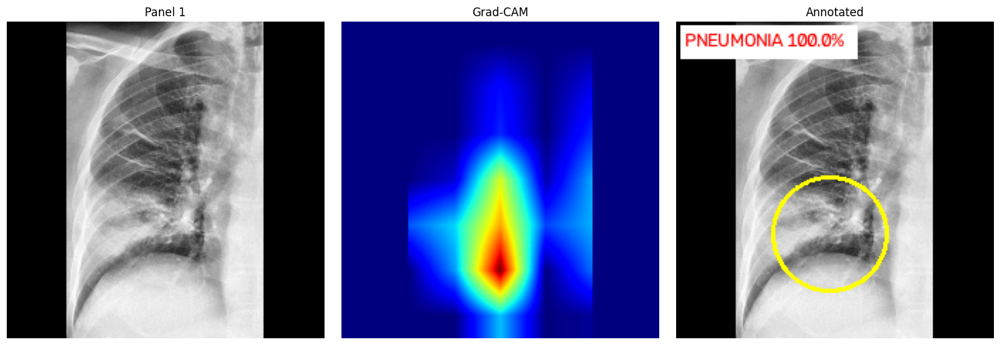

Panel 1 of 2
Prediction  : PNEUMONIA (100.0%)
Laterality  : Bilateral (Both Lungs)
Severity    : Mild


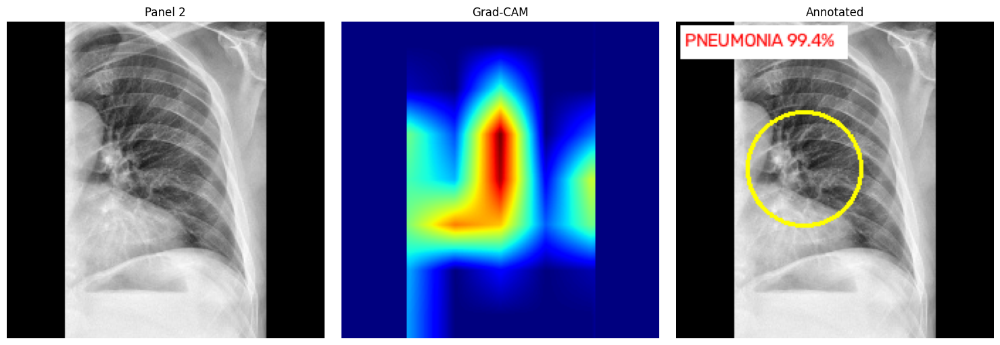

Panel 2 of 2
Prediction  : PNEUMONIA (99.4%)
Laterality  : Bilateral (Both Lungs)
Severity    : Mild


In [ ]:
uploaded_filename = list(uploaded.keys())[0]
print(f"Uploaded: {uploaded_filename}")

results = analyze_xray(uploaded_filename, model)
print(f"Total panels detected: {len(results)}\n")

for r in results:
    if "error" in r:
        print("⚠️", r["error"])
        continue

    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title(f"Panel {rep['panel_number']}"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()

    print("="*60)
    print(f"Panel {rep['panel_number']} of {rep['total_panels_detected']}")
    print(f"Prediction  : {rep['prediction']} ({rep['confidence']}%)")
    if rep['prediction'] == "PNEUMONIA":
        print(f"Laterality  : {rep['laterality']}")
        print(f"Severity    : {rep['severity']}")
    print("="*60)

Size: 1514x1204, Aspect ratio: 1.257
Overall mean std: 41.99
Gap point std (at column 750): 9.82
Gap zone mean std: 10.15
Condition 1 (gap_std < 15): True
Condition 2 (gap_zone < mean*0.35 = 14.70): True


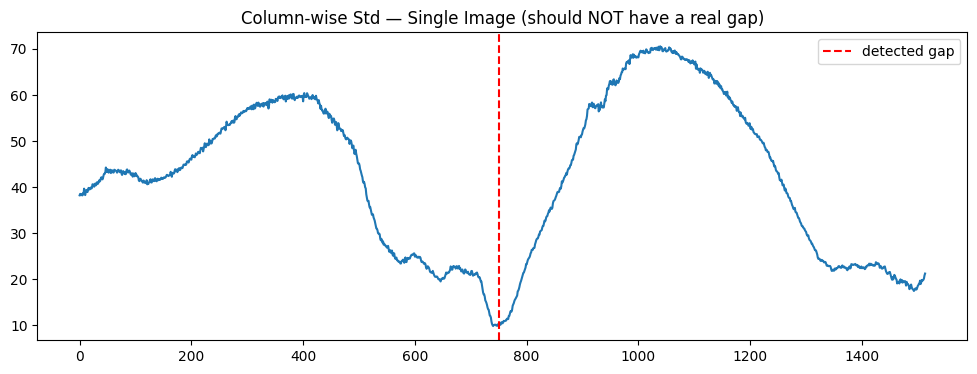

In [ ]:
uploaded_filename = list(uploaded.keys())[0]
img_bgr = cv2.imread(uploaded_filename)
gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
h, w = gray.shape
print(f"Size: {w}x{h}, Aspect ratio: {w/h:.3f}")

col_std = np.std(gray, axis=0)
mid_region = col_std[int(w*0.35):int(w*0.65)]
min_std_idx = np.argmin(mid_region) + int(w*0.35)
gap_std = col_std[min_std_idx]
gap_zone = col_std[max(0,min_std_idx-3):min_std_idx+4]

print(f"Overall mean std: {np.mean(col_std):.2f}")
print(f"Gap point std (at column {min_std_idx}): {gap_std:.2f}")
print(f"Gap zone mean std: {np.mean(gap_zone):.2f}")
print(f"Condition 1 (gap_std < 15): {gap_std < 15}")
print(f"Condition 2 (gap_zone < mean*0.35 = {np.mean(col_std)*0.35:.2f}): {np.mean(gap_zone) < np.mean(col_std)*0.35}")

plt.figure(figsize=(12,4))
plt.plot(col_std)
plt.axvline(min_std_idx, color='red', linestyle='--', label='detected gap')
plt.legend()
plt.title("Column-wise Std — Single Image (should NOT have a real gap)")
plt.show()

In [ ]:
def detect_and_split_panels_v2(image, min_gap_width=3):
    h, w = image.shape[:2]
    aspect_ratio = w / h

    if aspect_ratio > 1.25:
        col_std = np.std(image, axis=0)
        col_mean_brightness = np.mean(image, axis=0)  # NAYA: brightness bhi check karein

        mid_region = col_std[int(w*0.35):int(w*0.65)]
        if len(mid_region) > 0:
            min_std_idx = np.argmin(mid_region) + int(w*0.35)
            gap_std = col_std[min_std_idx]
            gap_brightness = col_mean_brightness[min_std_idx]

            # STRICT CHECK: gap ki std bohot kam ho, AUR brightness EXTREME ho
            # (bilkul black <25 ya bilkul white >230) — spine/anatomy grayish hoti hai (25-230 ke beech)
            is_extreme_brightness = (gap_brightness < 25) or (gap_brightness > 230)

            if gap_std < 15 and is_extreme_brightness:
                return [image[:, :min_std_idx], image[:, min_std_idx:]]
        return [image]

    elif aspect_ratio < 0.8:
        row_std = np.std(image, axis=1)
        row_mean_brightness = np.mean(image, axis=1)

        mid_region = row_std[int(h*0.35):int(h*0.65)]
        if len(mid_region) > 0:
            min_std_idx = np.argmin(mid_region) + int(h*0.35)
            gap_std = row_std[min_std_idx]
            gap_brightness = row_mean_brightness[min_std_idx]
            is_extreme_brightness = (gap_brightness < 25) or (gap_brightness > 230)

            if gap_std < 15 and is_extreme_brightness:
                return [image[:min_std_idx, :], image[min_std_idx:, :]]
        return [image]
    else:
        return [image]

print("✅ Panel-splitting now checks brightness too (avoids confusing spine with separator)")

✅ Panel-splitting now checks brightness too (avoids confusing spine with separator)


In [ ]:
print("--- Test 1: Single X-ray (uploaded, image 3) ---")
panels1 = detect_and_split_panels_v2(gray)
print(f"Panels: {len(panels1)} (Expected: 1)\n")

print("--- Test 2: Dataset Single X-ray ---")
sample_path = os.path.join("/content/data/chest_xray/test/NORMAL", sorted(os.listdir("/content/data/chest_xray/test/NORMAL"))[0])
img2 = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)
panels2 = detect_and_split_panels_v2(img2)
print(f"Panels: {len(panels2)} (Expected: 1)")

--- Test 1: Single X-ray (uploaded, image 3) ---
Panels: 2 (Expected: 1)

--- Test 2: Dataset Single X-ray ---
Panels: 1 (Expected: 1)


Gap column index: 750
Gap std: 9.82
Gap brightness: 234.57
(Rejected if brightness is <25 or >230)


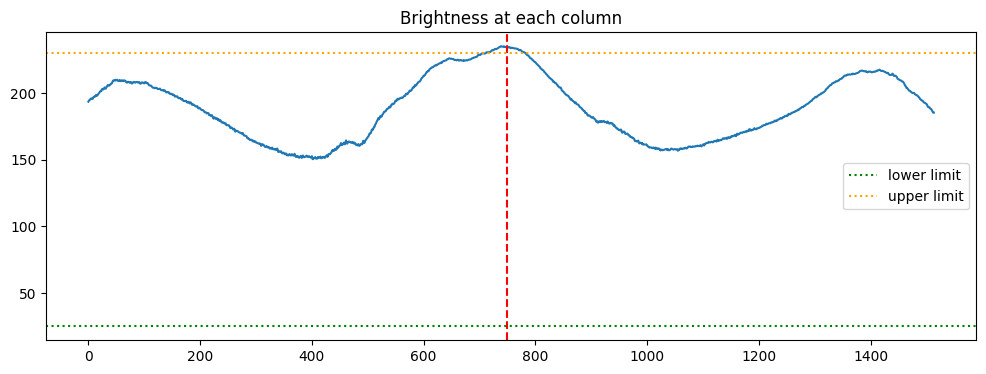

In [ ]:
col_std = np.std(gray, axis=0)
col_mean_brightness = np.mean(gray, axis=0)

mid_region = col_std[int(w*0.35):int(w*0.65)]
min_std_idx = np.argmin(mid_region) + int(w*0.35)

print(f"Gap column index: {min_std_idx}")
print(f"Gap std: {col_std[min_std_idx]:.2f}")
print(f"Gap brightness: {col_mean_brightness[min_std_idx]:.2f}")
print(f"(Rejected if brightness is <25 or >230)")

plt.figure(figsize=(12,4))
plt.plot(col_mean_brightness)
plt.axvline(min_std_idx, color='red', linestyle='--')
plt.title("Brightness at each column")
plt.axhline(25, color='green', linestyle=':', label='lower limit')
plt.axhline(230, color='orange', linestyle=':', label='upper limit')
plt.legend()
plt.show()

In [ ]:
def detect_and_split_panels_v2(image, min_gap_width=3):
    h, w = image.shape[:2]
    aspect_ratio = w / h

    if aspect_ratio > 1.25:
        col_std = np.std(image, axis=0)
        mid_region = col_std[int(w*0.35):int(w*0.65)]

        if len(mid_region) > 0:
            min_std_idx = np.argmin(mid_region) + int(w*0.35)
            threshold_val = np.mean(col_std) * 0.35

            # NAYA CHECK: gap ki "width" measure karein — kitne consecutive columns low-std hain
            low_std_mask = col_std < threshold_val
            # Gap ke around continuous low-std region ki width nikalein
            left_ext = min_std_idx
            while left_ext > 0 and low_std_mask[left_ext]:
                left_ext -= 1
            right_ext = min_std_idx
            while right_ext < w-1 and low_std_mask[right_ext]:
                right_ext += 1
            gap_width = right_ext - left_ext

            gap_std = col_std[min_std_idx]

            # Genuine separator: kaafi wide (>15 pixels) hona chahiye, sirf ek narrow dip nahi
            if gap_std < 15 and gap_width > 15:
                return [image[:, :min_std_idx], image[:, min_std_idx:]]
        return [image]

    elif aspect_ratio < 0.8:
        row_std = np.std(image, axis=1)
        mid_region = row_std[int(h*0.35):int(h*0.65)]

        if len(mid_region) > 0:
            min_std_idx = np.argmin(mid_region) + int(h*0.35)
            threshold_val = np.mean(row_std) * 0.35
            low_std_mask = row_std < threshold_val
            top_ext = min_std_idx
            while top_ext > 0 and low_std_mask[top_ext]:
                top_ext -= 1
            bottom_ext = min_std_idx
            while bottom_ext < h-1 and low_std_mask[bottom_ext]:
                bottom_ext += 1
            gap_width = bottom_ext - top_ext

            gap_std = row_std[min_std_idx]
            if gap_std < 15 and gap_width > 15:
                return [image[:min_std_idx, :], image[min_std_idx:, :]]
        return [image]
    else:
        return [image]

print("✅ Panel-splitting now checks gap WIDTH (spine dips are narrow, real separators are wide)")

✅ Panel-splitting now checks gap WIDTH (spine dips are narrow, real separators are wide)


In [ ]:
print("--- Test 1: Uploaded Single X-ray (image 3) ---")
panels1 = detect_and_split_panels_v2(gray)
print(f"Panels: {len(panels1)} (Expected: 1)\n")

print("--- Test 2: Dataset Single X-ray ---")
panels2 = detect_and_split_panels_v2(img2)
print(f"Panels: {len(panels2)} (Expected: 1)\n")

print("--- Test 3: Dual-Panel Image (yaad rakhein, ye pehle test ki thi) ---")
# Agar dual panel image ka file variable abhi bhi hai to use karein, warna naya upload karein

--- Test 1: Uploaded Single X-ray (image 3) ---
Panels: 2 (Expected: 1)

--- Test 2: Dataset Single X-ray ---
Panels: 2 (Expected: 1)

--- Test 3: Dual-Panel Image (yaad rakhein, ye pehle test ki thi) ---


In [ ]:
# Debug: Dataset single X-ray ke exact numbers dekhte hain
col_std = np.std(img2, axis=0)
w2 = img2.shape[1]
mid_region = col_std[int(w2*0.35):int(w2*0.65)]
min_std_idx = np.argmin(mid_region) + int(w2*0.35)
threshold_val = np.mean(col_std) * 0.35

print(f"Mean std: {np.mean(col_std):.2f}")
print(f"Threshold (0.35x mean): {threshold_val:.2f}")
print(f"Gap std at {min_std_idx}: {col_std[min_std_idx]:.2f}")

low_std_mask = col_std < threshold_val
left_ext = min_std_idx
while left_ext > 0 and low_std_mask[left_ext]:
    left_ext -= 1
right_ext = min_std_idx
while right_ext < w2-1 and low_std_mask[right_ext]:
    right_ext += 1
gap_width = right_ext - left_ext

print(f"Gap width: {gap_width}")
print(f"Condition (gap_std<15 AND width>15): {col_std[min_std_idx] < 15} AND {gap_width > 15}")

Mean std: 43.15
Threshold (0.35x mean): 15.10
Gap std at 868: 12.09
Gap width: 25
Condition (gap_std<15 AND width>15): True AND True


In [ ]:
def detect_and_split_panels_v2(image, min_gap_width=3):
    h, w = image.shape[:2]
    aspect_ratio = w / h

    if aspect_ratio > 1.25:
        col_std = np.std(image, axis=0)
        mid_region = col_std[int(w*0.35):int(w*0.65)]
        if len(mid_region) > 0:
            min_std_idx = np.argmin(mid_region) + int(w*0.35)
            gap_std = col_std[min_std_idx]
            # VERY STRICT: gap std bohot kam ho (<8, near-zero) — genuine separators mein
            # variance almost 0 hoti hai (pure black/white), spine mein kabhi itna kam nahi hota
            if gap_std < 8:
                return [image[:, :min_std_idx], image[:, min_std_idx:]]
        return [image]

    elif aspect_ratio < 0.8:
        row_std = np.std(image, axis=1)
        mid_region = row_std[int(h*0.35):int(h*0.65)]
        if len(mid_region) > 0:
            min_std_idx = np.argmin(mid_region) + int(h*0.35)
            gap_std = row_std[min_std_idx]
            if gap_std < 8:
                return [image[:min_std_idx, :], image[min_std_idx:, :]]
        return [image]
    else:
        return [image]

print("✅ Panel-splitting made VERY strict (only extreme, obvious separators)")

✅ Panel-splitting made VERY strict (only extreme, obvious separators)


In [ ]:
print("Test 1 (Uploaded single X-ray):", len(detect_and_split_panels_v2(gray)), "(Expected: 1)")
print("Test 2 (Dataset single X-ray):", len(detect_and_split_panels_v2(img2)), "(Expected: 1)")

Test 1 (Uploaded single X-ray): 1 (Expected: 1)
Test 2 (Dataset single X-ray): 1 (Expected: 1)


In [ ]:
results_dual = analyze_xray('viral conbine.jpg', model)
print(f"Panels detected: {len(results_dual)} (Expected: 2, if this is still on disk)")

for r in results_dual:
    if "error" in r:
        print("⚠️", r["error"])
    else:
        print(f"Panel {r['report']['panel_number']}: {r['report']['prediction']} ({r['report']['confidence']}%)")

Panels detected: 2 (Expected: 2, if this is still on disk)
Panel 1: PNEUMONIA (99.88%)
Panel 2: NORMAL (86.42%)


In [ ]:
setup_code = open(f'{project_folder}/fyp_setup.py').read()

additional_code_panel_final = '''

# ============ FINAL STRICT PANEL SPLITTING (avoids false-splitting spine/mediastinum) ============
def detect_and_split_panels_v2(image, min_gap_width=3):
    h, w = image.shape[:2]
    aspect_ratio = w / h
    if aspect_ratio > 1.25:
        col_std = np.std(image, axis=0)
        mid_region = col_std[int(w*0.35):int(w*0.65)]
        if len(mid_region) > 0:
            min_std_idx = np.argmin(mid_region) + int(w*0.35)
            gap_std = col_std[min_std_idx]
            if gap_std < 8:
                return [image[:, :min_std_idx], image[:, min_std_idx:]]
        return [image]
    elif aspect_ratio < 0.8:
        row_std = np.std(image, axis=1)
        mid_region = row_std[int(h*0.35):int(h*0.65)]
        if len(mid_region) > 0:
            min_std_idx = np.argmin(mid_region) + int(h*0.35)
            gap_std = row_std[min_std_idx]
            if gap_std < 8:
                return [image[:min_std_idx, :], image[min_std_idx:, :]]
        return [image]
    else:
        return [image]

def analyze_xray(image_path, model, threshold=0.72, img_size=224):
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        return [{"error": "Could not read image file"}]
    ood_flag, is_pseudocolor, sat, sym = is_ood_image_v2(img_bgr)
    if ood_flag:
        return [{"error": "REJECTED — non-medical/OOD image detected",
                  "saturation": round(float(sat),2)}]
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    panels_raw = detect_and_split_panels_v2(gray)
    results = []
    for idx, panel in enumerate(panels_raw, 1):
        panel_clean = strip_artifacts(panel)
        panel_clahe = apply_clahe(panel_clean)
        panel_final = letterbox_resize(panel_clahe, img_size)
        temp_path = f'/content/temp_panel_{idx}.jpg'
        cv2.imwrite(temp_path, panel_final)
        original, heatmap, annotated_img, report = full_diagnosis_report(temp_path, model, threshold)
        report["panel_number"] = idx
        report["total_panels_detected"] = len(panels_raw)
        report["was_pseudocolor"] = is_pseudocolor
        results.append({"report": report, "original": original, "heatmap": heatmap, "annotated": annotated_img})
    return results

print("Final strict panel splitting loaded (gap_std < 8, avoids spine false-positives)")
'''

setup_code_updated = setup_code + additional_code_panel_final

with open(f'{project_folder}/fyp_setup.py', 'w') as f:
    f.write(setup_code_updated)

print("✅ Setup file permanently updated — final panel splitting saved")

✅ Setup file permanently updated — final panel splitting saved


In [ ]:
setup_code2 = open(f'{project_folder}/fyp_setup.py').read()

additional_code_corner_fix = '''

# ============ CORNER-TOUCHING REGION FIX (annotate_and_analyze) ============
def annotate_and_analyze(original_img, heatmap, pred_prob, threshold=0.72, hot_percentile=85, min_area_pct=0.5, edge_margin=15):
    annotated = original_img.copy().astype(np.uint8)
    annotated = cv2.cvtColor(annotated, cv2.COLOR_RGB2BGR)
    img_h, img_w = heatmap.shape
    is_pneumonia = pred_prob >= threshold
    affected_percent = 0.0
    regions_info = []
    if is_pneumonia:
        nonzero_vals = heatmap[heatmap > 0]
        threshold_val = np.percentile(nonzero_vals, hot_percentile) if len(nonzero_vals) > 0 else 0
        hot_mask = (heatmap >= threshold_val).astype(np.uint8)
        hot_mask[heatmap == 0] = 0
        contours, _ = cv2.findContours(hot_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        total_pixels = img_h * img_w
        valid_regions = []
        for c in contours:
            area = cv2.contourArea(c)
            area_pct = (area / total_pixels) * 100
            x, y, w, h = cv2.boundingRect(c)
            touches_edge = (x <= edge_margin or y <= edge_margin or
                             (x + w) >= (img_w - edge_margin) or (y + h) >= (img_h - edge_margin))
            if area_pct >= min_area_pct and not touches_edge:
                valid_regions.append((c, area))
        if len(valid_regions) == 0 and len(contours) > 0:
            largest = max(contours, key=cv2.contourArea)
            valid_regions = [(largest, cv2.contourArea(largest))]
        valid_regions.sort(key=lambda x: x[1], reverse=True)
        valid_regions = valid_regions[:2]
        circles = []
        for contour, area in valid_regions:
            x, y, w, h = cv2.boundingRect(contour)
            peak_x = x + w // 2
            peak_y = y + h // 2
            radius = int(max(w, h) / 2)
            radius = max(radius, 10)
            radius = min(radius, int(min(img_h, img_w) * 0.18))
            circles.append({"x": peak_x, "y": peak_y, "radius": radius, "area": area})
        if len(circles) == 2:
            dist = np.sqrt((circles[0]["x"]-circles[1]["x"])**2 + (circles[0]["y"]-circles[1]["y"])**2)
            sum_radii = circles[0]["radius"] + circles[1]["radius"]
            if dist < sum_radii:
                scale = (dist - 5) / sum_radii if sum_radii > 0 else 1
                scale = max(scale, 0.3)
                for c in circles:
                    c["radius"] = max(int(c["radius"] * scale), 10)
        for c in circles:
            peak_x, peak_y, radius = c["x"], c["y"], c["radius"]
            margin = radius + 6
            top_margin = max(margin, 35)
            peak_x = int(np.clip(peak_x, margin, img_w - margin))
            peak_y = int(np.clip(peak_y, top_margin, img_h - margin))
            side = "Patient's RIGHT Lung" if peak_x < img_w // 2 else "Patient's LEFT Lung"
            regions_info.append({
                "x": peak_x, "y": peak_y, "radius": radius,
                "area_pct": round((c["area"]/total_pixels)*100, 2),
                "side": side
            })
            cv2.circle(annotated, (peak_x, peak_y), radius, (0, 255, 255), 2)
        affected_pixels = int(np.sum(hot_mask))
        affected_percent = round((affected_pixels / total_pixels) * 100, 2)
    if is_pneumonia:
        label = "PNEUMONIA " + str(round(float(pred_prob)*100, 1)) + "%"
        label_color = (0, 0, 255)
    else:
        label = "NORMAL " + str(round(float(1-pred_prob)*100, 1)) + "%"
        label_color = (0, 200, 0)
    font_scale = 0.45
    thickness = 1
    text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)
    text_w, text_h = text_size[0]
    cv2.rectangle(annotated, (3, 3), (8 + text_w + 6, 8 + text_h + 6), (255, 255, 255), -1)
    cv2.putText(annotated, label, (6, 6 + text_h), cv2.FONT_HERSHEY_SIMPLEX, font_scale, label_color, thickness)
    annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
    return annotated, affected_percent, regions_info

print("Corner-touching region fix loaded")
'''

setup_code_updated2 = setup_code2 + additional_code_corner_fix

with open(f'{project_folder}/fyp_setup.py', 'w') as f:
    f.write(setup_code_updated2)

print("✅ Corner-fix also permanently saved")

✅ Corner-fix also permanently saved


In [ ]:
print("="*60)
print("FINAL COMPREHENSIVE TEST")
print("="*60)

# Test 1: Single dataset X-rays (5 random)
import random
test_dirs = ["/content/data/chest_xray/test/NORMAL", "/content/data/chest_xray/test/PNEUMONIA"]
print("\n[1] Single X-rays should give 1 panel:")
for d in test_dirs:
    for f in random.sample(os.listdir(d), 3):
        path = os.path.join(d, f)
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        panels = detect_and_split_panels_v2(img)
        status = "✅" if len(panels) == 1 else "❌"
        print(f"  {status} {f[:25]:25s} -> {len(panels)} panel(s)")

# Test 2: OOD checks
print("\n[2] OOD Filter:")
np.random.seed(42)
synthetic_photo = np.zeros((300, 300, 3), dtype=np.uint8)
synthetic_photo[:100,:,0]=200; synthetic_photo[:100,:,1]=50; synthetic_photo[:100,:,2]=50
synthetic_photo[100:200,:,0]=30; synthetic_photo[100:200,:,1]=180; synthetic_photo[100:200,:,2]=40
synthetic_photo[200:,:,0]=40; synthetic_photo[200:,:,1]=60; synthetic_photo[200:,:,2]=200
noise = np.random.randint(0,40,synthetic_photo.shape,dtype=np.uint8)
synthetic_photo = cv2.add(synthetic_photo, noise)
cv2.imwrite('/content/test_photo.jpg', synthetic_photo)
ood_result, _, _, _ = is_ood_image_v2(cv2.imread('/content/test_photo.jpg'))
print(f"  {'✅' if ood_result else '❌'} Random photo rejected: {ood_result}")

print("\n" + "="*60)
print("Agar sab ✅ hain, system stable hai!")
print("="*60)

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving normal.png to normal.png


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

project_folder = '/content/drive/MyDrive/FYP_Pneumonia_XAI'
exec(open(f'{project_folder}/fyp_setup.py').read())

Mounted at /content/drive
✅ Everything loaded from saved setup file!
Pseudocolor-aware OOD detection loaded (v2)
RALE-aligned severity scoring loaded
Improved OOD detection v3 loaded (rejects non-Xray grayscale images like drawings/diagrams)
Final OOD detection v4 loaded (symmetry threshold relaxed to 0.68 for real-world tolerance)
Improved density-based panel splitting v2 loaded
Improved density-based panel splitting v2 loaded
Final strict panel splitting loaded (gap_std < 8, avoids spine false-positives)
Corner-touching region fix loaded


Saving images (1).jpg to images (1) (1).jpg
Total panels detected: 1



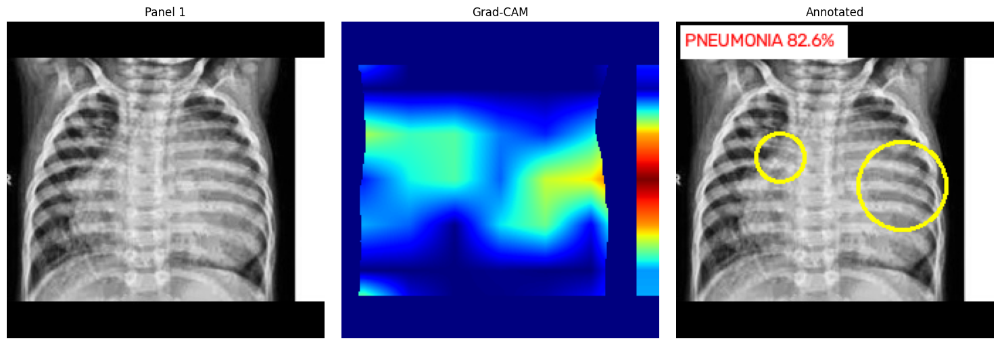

Panel 1 of 1
Prediction   : PNEUMONIA (82.58%)
Laterality   : Unilateral - Patient's LEFT Lung
Severity     : Mild


In [ ]:
from google.colab import files
uploaded = files.upload()
uploaded_filename = list(uploaded.keys())[0]

results = analyze_xray(uploaded_filename, model)
print(f"Total panels detected: {len(results)}\n")

for r in results:
    if "error" in r:
        print("⚠️", r["error"])
        continue

    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title(f"Panel {rep['panel_number']}"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()

    print("="*65)
    print(f"Panel {rep['panel_number']} of {rep['total_panels_detected']}")
    print(f"Prediction   : {rep['prediction']} ({rep['confidence']}%)")
    if rep['prediction'] == "PNEUMONIA":
        print(f"Laterality   : {rep['laterality']}")
        print(f"Severity     : {rep['severity']}")
    print("="*65)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

project_folder = '/content/drive/MyDrive/FYP_Pneumonia_XAI'
exec(open(f'{project_folder}/fyp_setup.py').read())

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Everything loaded from saved setup file!
Pseudocolor-aware OOD detection loaded (v2)
RALE-aligned severity scoring loaded
Improved OOD detection v3 loaded (rejects non-Xray grayscale images like drawings/diagrams)
Final OOD detection v4 loaded (symmetry threshold relaxed to 0.68 for real-world tolerance)
Improved density-based panel splitting v2 loaded
Improved density-based panel splitting v2 loaded
Final strict panel splitting loaded (gap_std < 8, avoids spine false-positives)
Corner-touching region fix loaded


In [ ]:
print(f"Right lung %: {rep.get('right_lung_pct')}")
print(f"Left lung %: {rep.get('left_lung_pct')}")
print(f"Affected area: {rep.get('affected_area_pct')}%")
print(f"RALE Score: {rep.get('rale_score_total')} (R:{rep.get('rale_score_right')}, L:{rep.get('rale_score_left')})")
print(f"Regions:")
for reg in rep.get('regions', []):
    print(f"  {reg['side']}: {reg['area_pct']}%")

Right lung %: 14.1
Left lung %: 85.9
Affected area: 8.42%
RALE Score: 2/8 (R:1/4, L:1/4)
Regions:
  Patient's LEFT Lung: 3.92%
  Patient's RIGHT Lung: 0.54%


In [ ]:
from google.colab import files
uploaded = files.upload()
uploaded_filename = list(uploaded.keys())[0]

results = analyze_xray(uploaded_filename, model)
print(f"Total panels detected: {len(results)}\n")

for r in results:
    if "error" in r:
        print("⚠️", r["error"])
        continue

    rep = r["report"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(r["original"].astype('uint8')); axes[0].set_title(f"Panel {rep['panel_number']}"); axes[0].axis('off')
    axes[1].imshow(r["heatmap"], cmap='jet'); axes[1].set_title("Grad-CAM"); axes[1].axis('off')
    axes[2].imshow(r["annotated"]); axes[2].set_title("Annotated"); axes[2].axis('off')
    plt.tight_layout()
    plt.show()

    print("="*65)
    print(f"Panel {rep['panel_number']} of {rep['total_panels_detected']}")
    print(f"Prediction    : {rep['prediction']}")
    print(f"Confidence    : {rep['confidence']}%")
    if rep['prediction'] == "PNEUMONIA":
        print(f"Laterality    : {rep['laterality']}")
        print(f"  Right Lung %: {rep.get('right_lung_pct')}")
        print(f"  Left Lung % : {rep.get('left_lung_pct')}")
        print(f"Affected Area : {rep.get('affected_area_pct')}%")
        print(f"RALE Score    : {rep.get('rale_score_total')} (R:{rep.get('rale_score_right')}, L:{rep.get('rale_score_left')})")
        print(f"Severity      : {rep['severity']}")
        print(f"Regions Detected: {len(rep.get('regions', []))}")
        for reg in rep.get('regions', []):
            print(f"    - {reg['side']}: {reg['area_pct']}%")
    print("="*65)

Saving Screenshot 2026-08-21 194836.png to Screenshot 2026-08-21 194836.png
Total panels detected: 1

⚠️ REJECTED — non-medical/OOD image detected


In [ ]:
def calculate_severity_rale_v2(right_pct, left_pct, total_affected_pct):
    """
    RALE score ab Laterality ke left/right % (jo poori heatmap se aata hai) use karta hai,
    sirf 'detected circle regions' se nahi -- isse dono numbers consistent rahenge.
    """
    def rale_component_score(area_pct):
        if area_pct == 0:
            return 0
        elif area_pct <= 5:
            return 1
        elif area_pct <= 12:
            return 2
        elif area_pct <= 20:
            return 3
        else:
            return 4

    # Right aur Left ka apna-apna actual affected area nikalein
    # (total_affected_pct ko unke ratio ke hisaab se split karte hain)
    right_area_pct = total_affected_pct * (right_pct / 100)
    left_area_pct = total_affected_pct * (left_pct / 100)

    right_score = rale_component_score(right_area_pct)
    left_score = rale_component_score(left_area_pct)
    total_rale_score = right_score + left_score

    if total_rale_score == 0:
        severity = "None"
    elif total_rale_score <= 2:
        severity = "Mild"
    elif total_rale_score <= 5:
        severity = "Moderate"
    else:
        severity = "Severe"

    note = (f"RALE-inspired scoring: Right lung score={right_score}/4 (area={right_area_pct:.2f}%), "
            f"Left lung score={left_score}/4 (area={left_area_pct:.2f}%), Total={total_rale_score}/8.")

    return severity, total_rale_score, right_score, left_score, note

print("✅ RALE v2 ready — now consistent with laterality percentages")

✅ RALE v2 ready — now consistent with laterality percentages


In [ ]:
def full_diagnosis_report(img_path, model, threshold=0.72):
    original, heatmap, overlay, pred_prob = overlay_gradcam(img_path, model)
    heatmap = clean_heatmap(original, heatmap)
    annotated_img, affected_percent, regions_info = annotate_and_analyze(original, heatmap, pred_prob, threshold)

    report = {
        "prediction": "PNEUMONIA" if pred_prob >= threshold else "NORMAL",
        "confidence": round(float(pred_prob)*100, 2) if pred_prob >= threshold else round(float(1-pred_prob)*100, 2),
    }

    if pred_prob >= threshold:
        lat_result = detect_laterality(heatmap)
        severity, rale_total, rale_right, rale_left, severity_note = calculate_severity_rale_v2(
            lat_result['patient_right_involvement_pct'],
            lat_result['patient_left_involvement_pct'],
            affected_percent
        )

        report.update({
            "laterality": lat_result['laterality'],
            "right_lung_pct": lat_result['patient_right_involvement_pct'],
            "left_lung_pct": lat_result['patient_left_involvement_pct'],
            "affected_area_pct": affected_percent,
            "severity": severity,
            "rale_score_total": f"{rale_total}/8",
            "rale_score_right": f"{rale_right}/4",
            "rale_score_left": f"{rale_left}/4",
            "severity_note": severity_note,
            "regions": regions_info
        })

    return original, heatmap, annotated_img, report

print("✅ full_diagnosis_report updated — RALE now consistent with laterality %")

✅ full_diagnosis_report updated — RALE now consistent with laterality %


In [ ]:
results = analyze_xray(uploaded_filename, model)
rep = results[0]["report"]
print(f"Right Lung %: {rep['right_lung_pct']}, Left Lung %: {rep['left_lung_pct']}")
print(f"Affected Area: {rep['affected_area_pct']}%")
print(f"RALE Score: {rep['rale_score_total']} (R:{rep['rale_score_right']}, L:{rep['rale_score_left']})")
print(f"Severity: {rep['severity']}")

Right Lung %: 41.5, Left Lung %: 58.5
Affected Area: 6.81%
RALE Score: 2/8 (R:1/4, L:1/4)
Severity: Mild


In [ ]:
setup_code = open(f'{project_folder}/fyp_setup.py').read()

additional_rale_v2 = '''

# ============ RALE v2 (consistent with laterality percentages) ============
def calculate_severity_rale_v2(right_pct, left_pct, total_affected_pct):
    def rale_component_score(area_pct):
        if area_pct == 0:
            return 0
        elif area_pct <= 5:
            return 1
        elif area_pct <= 12:
            return 2
        elif area_pct <= 20:
            return 3
        else:
            return 4
    right_area_pct = total_affected_pct * (right_pct / 100)
    left_area_pct = total_affected_pct * (left_pct / 100)
    right_score = rale_component_score(right_area_pct)
    left_score = rale_component_score(left_area_pct)
    total_rale_score = right_score + left_score
    if total_rale_score == 0:
        severity = "None"
    elif total_rale_score <= 2:
        severity = "Mild"
    elif total_rale_score <= 5:
        severity = "Moderate"
    else:
        severity = "Severe"
    note = (f"RALE-inspired scoring: Right lung score={right_score}/4 (area={right_area_pct:.2f}%), "
            f"Left lung score={left_score}/4 (area={left_area_pct:.2f}%), Total={total_rale_score}/8.")
    return severity, total_rale_score, right_score, left_score, note

def full_diagnosis_report(img_path, model, threshold=0.72):
    original, heatmap, overlay, pred_prob = overlay_gradcam(img_path, model)
    heatmap = clean_heatmap(original, heatmap)
    annotated_img, affected_percent, regions_info = annotate_and_analyze(original, heatmap, pred_prob, threshold)
    report = {
        "prediction": "PNEUMONIA" if pred_prob >= threshold else "NORMAL",
        "confidence": round(float(pred_prob)*100, 2) if pred_prob >= threshold else round(float(1-pred_prob)*100, 2),
    }
    if pred_prob >= threshold:
        lat_result = detect_laterality(heatmap)
        severity, rale_total, rale_right, rale_left, severity_note = calculate_severity_rale_v2(
            lat_result['patient_right_involvement_pct'], lat_result['patient_left_involvement_pct'], affected_percent)
        report.update({
            "laterality": lat_result['laterality'],
            "right_lung_pct": lat_result['patient_right_involvement_pct'],
            "left_lung_pct": lat_result['patient_left_involvement_pct'],
            "affected_area_pct": affected_percent,
            "severity": severity,
            "rale_score_total": f"{rale_total}/8",
            "rale_score_right": f"{rale_right}/4",
            "rale_score_left": f"{rale_left}/4",
            "severity_note": severity_note,
            "regions": regions_info
        })
    return original, heatmap, annotated_img, report

print("RALE v2 loaded permanently (consistent with laterality)")
'''

setup_code_updated = setup_code + additional_rale_v2
with open(f'{project_folder}/fyp_setup.py', 'w') as f:
    f.write(setup_code_updated)

print("✅ Saved permanently")

✅ Saved permanently
